### **Installing Libraries**

In [1]:
!uv pip install -q scikit-learn==1.6.1 imblearn --system

In [2]:
import wave,os,librosa,tqdm,time,warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import librosa, os, cv2, pickle, tqdm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from cuml.svm import SVC as cuSVC
from cuml.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from imblearn.over_sampling import SMOTE
import IPython.display as ipd

2025-07-05 14:30:02.567952: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751725802.971305      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751725803.076369      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### **Exploratory Data Analysis**

In [8]:
dpath = '/kaggle/input/cremad/AudioWAV'
audio_path = os.path.join(dpath,os.listdir(dpath)[0])
y, sr = librosa.load(audio_path,sr=16000)
print(y.shape)
print(sr)

(38972,)
16000


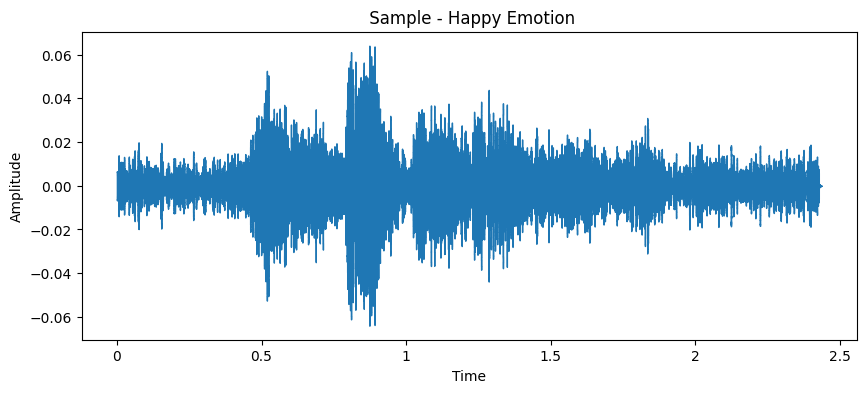

In [3]:
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(" Sample - Happy Emotion")
plt.ylabel("Amplitude")
plt.show()

In [ ]:
pip install noisereduce

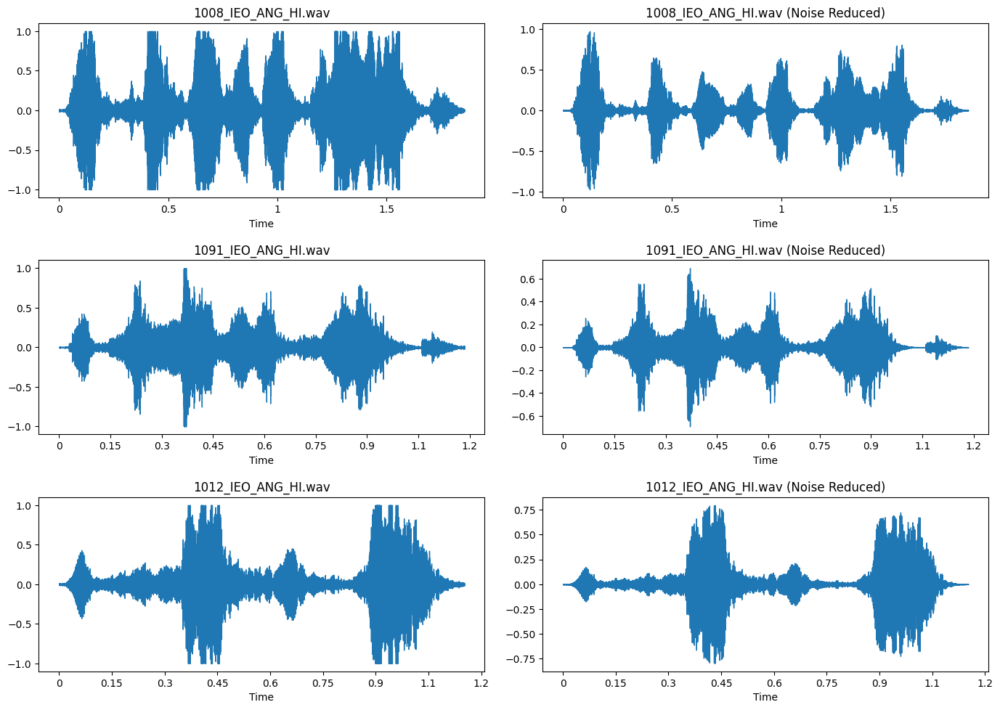

In [7]:
import noisereduce as nr
labdict = {'ANG':'angry','DIS':'disgust','FEA':'fear','HAP':'happy','NEU':'neutral','SAD':'sad'}
wavlabs = dict()
plt.figure(figsize=(14, 10))
rwav = np.random.choice(os.listdir(dpath),500)
wavs = []
i = 0
for p in rwav:
    path = os.path.join(dpath,p)
    label = labdict[p.split('_')[2]]
    its = p.split('_')[3]
    if label in ['angry','neutral','happy','sad'] and its=='HI.wav':
        i+=1
        y,sr = librosa.load(path,sr=16000)
        wavs.append(p)
        ytrim,index = librosa.effects.trim(y,top_db=25)
        yclean = nr.reduce_noise(ytrim,sr)
        plt.subplot(3,2,i)
        plt.title(p)
        #plt.ylim(-1,1)
        librosa.display.waveshow(ytrim, sr=sr)
        i+=1
        plt.subplot(3,2,i)
        plt.title(p+' (Noise Reduced)')
        #plt.ylim(-1,1)
        librosa.display.waveshow(yclean, sr=sr)
        if i==6:
            break
plt.tight_layout(pad=1.5)
plt.show()

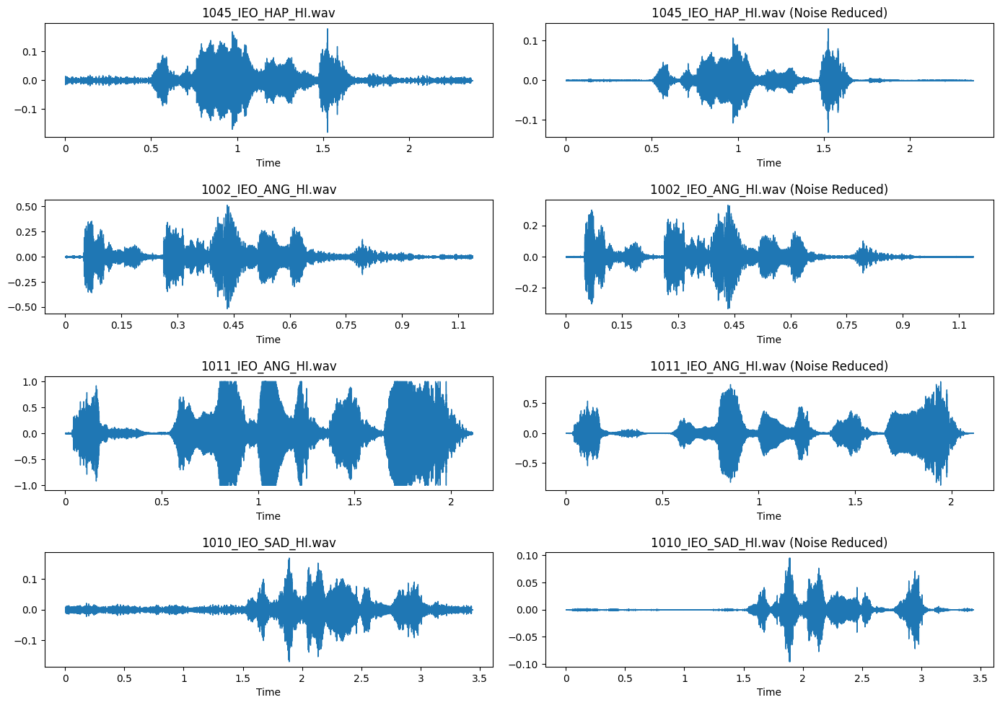

In [9]:
import noisereduce as nr
labdict = {'ANG':'angry','DIS':'disgust','FEA':'fear','HAP':'happy','NEU':'neutral','SAD':'sad'}
wavlabs = dict()
plt.figure(figsize=(14, 10))
rwav = np.random.choice(os.listdir(dpath),500)
wavs = []
i = 0
for p in rwav:
    path = os.path.join(dpath,p)
    label = labdict[p.split('_')[2]]
    its = p.split('_')[3]
    if label in ['angry','neutral','happy','sad'] and its=='HI.wav':
        i+=1
        y,sr = librosa.load(path,sr=16000)
        wavs.append(p)
        ytrim,index = librosa.effects.trim(y,top_db=25)
        yclean = nr.reduce_noise(ytrim,sr)
        plt.subplot(4,2,i)
        plt.title(p)
        #plt.ylim(-1,1)
        librosa.display.waveshow(ytrim, sr=sr)
        i+=1
        plt.subplot(4,2,i)
        plt.title(p+' (Noise Reduced)')
        #plt.ylim(-1,1)
        librosa.display.waveshow(yclean, sr=sr)
        if i==8:
            break
plt.tight_layout(pad=1.5)
plt.show()

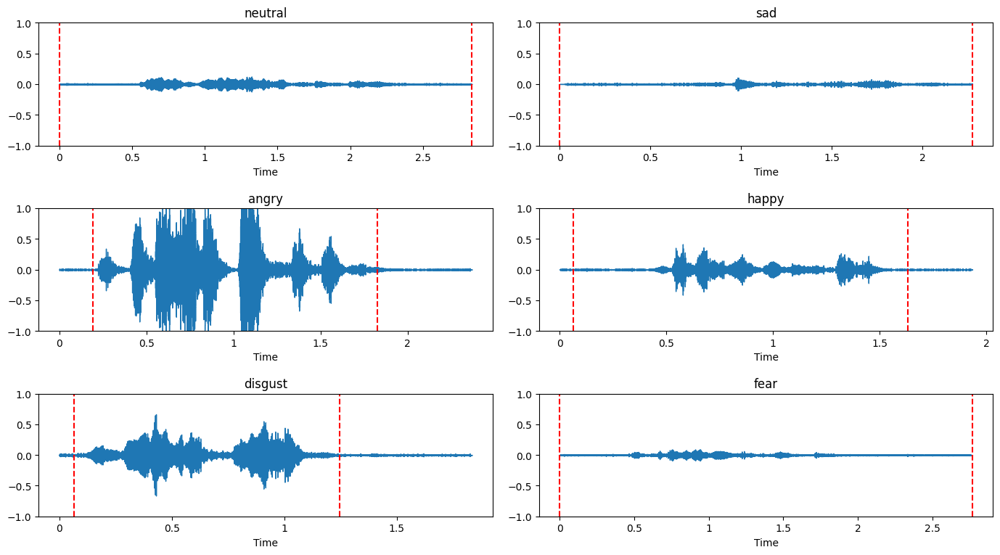

In [15]:
import noisereduce as nr
cre_labs = {'ANG':'angry','DIS':'disgust','FEA':'fear','HAP':'happy','NEU':'neutral','SAD':'sad'}
plt.figure(figsize=(14, 10))
emos,i = [],1
rwav = np.random.choice(os.listdir(dpath),500)
for wav in rwav:
  lab = cre_labs[wav.split('_')[2]]
  if lab not in emos:
    emos.append(lab)
    audio_path = os.path.join(dpath,wav)
    y, sr = librosa.load(audio_path,sr=16000)
    ytrim, index = librosa.effects.trim(y,top_db=25)
    plt.subplot(4,2,i)
    plt.title(f"{lab}")
    plt.ylim(-1,1)
    dur = librosa.get_duration(y=y,sr=sr)
    plt.axvline(x=dur/len(y)*index[0], color='r', linestyle='--')
    plt.axvline(x=dur/len(y)*index[1], color='r', linestyle='--')
    librosa.display.waveshow(y, sr=sr)
    i+=1
  if len(emos)==6:
    break
plt.tight_layout(pad=1.5)
plt.show()

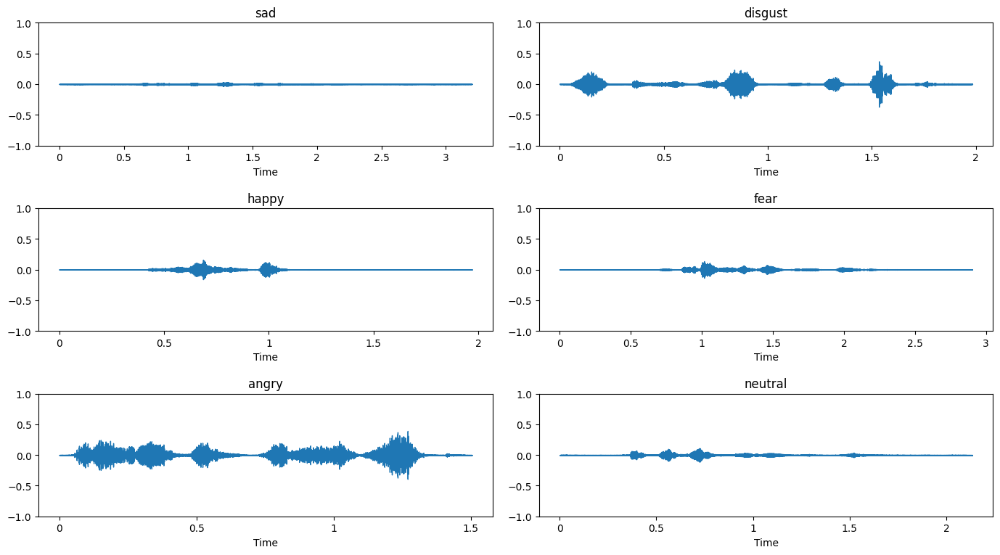

In [17]:
plt.figure(figsize=(14, 10))
emos,i = [],1
rwav = np.random.choice(os.listdir(dpath),500)
for wav in rwav:
  lab = cre_labs[wav.split('_')[2]]
  if lab not in emos:
    emos.append(lab)
    audio_path = os.path.join(dpath,wav)
    y, sr = librosa.load(audio_path,sr=16000)
    ytrim, index = librosa.effects.trim(y,top_db=25)
    yclean = nr.reduce_noise(y=ytrim, sr=sr)
    plt.subplot(4,2,i)
    plt.title(lab)
    plt.ylim(-1,1)
    librosa.display.waveshow(yclean, sr=sr)
    i+=1
  if len(emos)==6:
    break
plt.tight_layout(pad=1.5)
plt.show()

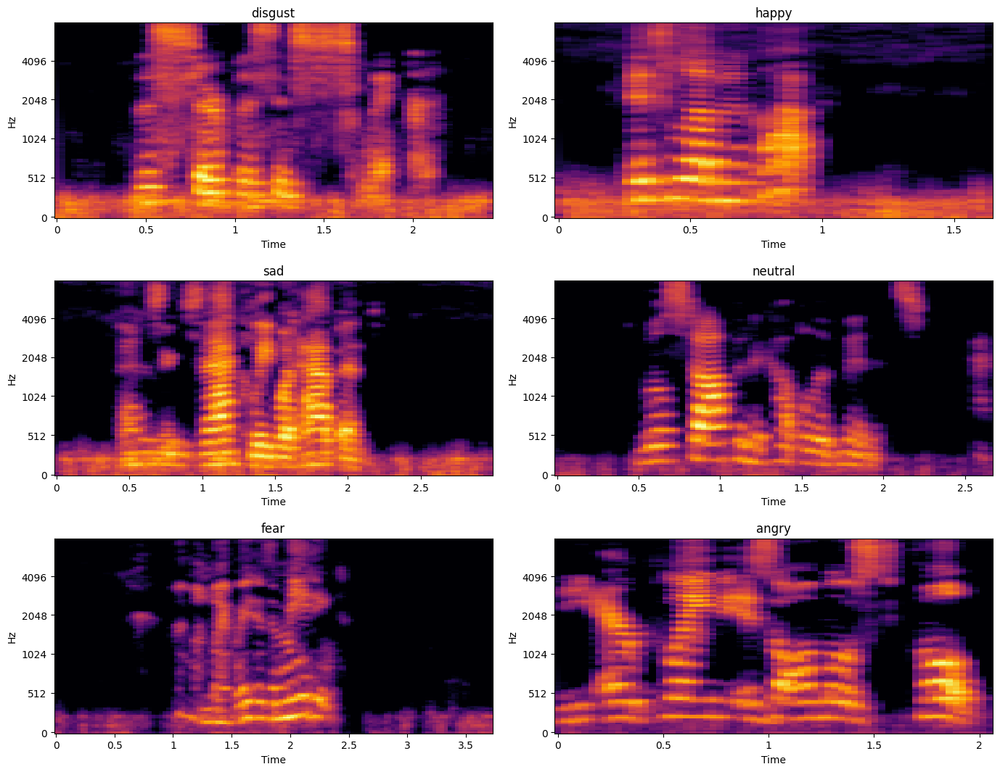

In [18]:
plt.figure(figsize=(14, 14))
emos,i = [],1
for wav in os.listdir(dpath):
  lab = cre_labs[wav.split('_')[2]]
  if lab not in emos:
    emos.append(lab)
    audio_path = os.path.join(dpath,wav)
    y, sr = librosa.load(audio_path,sr=16000)
    ytrim, index = librosa.effects.trim(y,top_db=25)
    yclean = nr.reduce_noise(y=ytrim, sr=sr)
    plt.subplot(4,2,i)
    plt.title(lab)
    S = librosa.feature.melspectrogram(y=yclean, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, x_axis='time',y_axis='mel', sr=sr,cmap='inferno')
    i+=1
  if len(emos)==6:
    break
plt.tight_layout(pad=1.5)
plt.show()

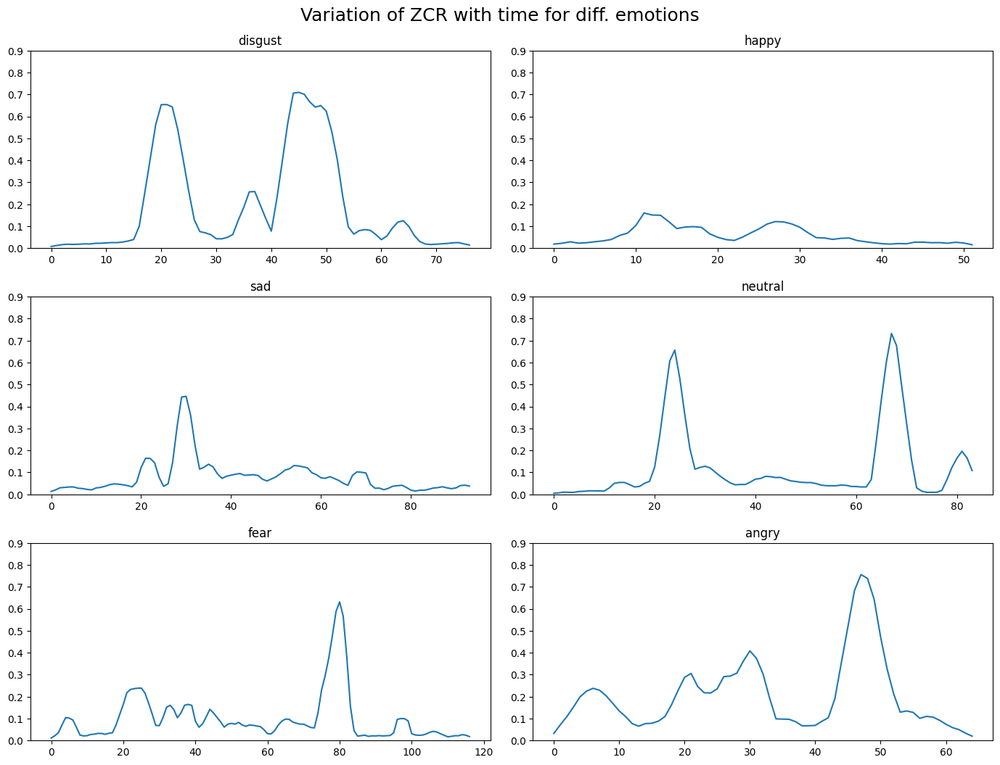

In [19]:
plt.figure(figsize=(14, 14))
emos,i = [],1
for wav in os.listdir(dpath):
  lab = cre_labs[wav.split('_')[2]]
  if lab not in emos:
    emos.append(lab)
    audio_path = os.path.join(dpath,wav)
    y, sr = librosa.load(audio_path,sr=16000)
    ytrim, index = librosa.effects.trim(y,top_db=25)
    yclean = nr.reduce_noise(y=ytrim, sr=sr)
    plt.subplot(4,2,i)
    plt.title(lab)
    zcr = librosa.feature.zero_crossing_rate(yclean)
    plt.ylim(0,0.9)
    plt.plot(zcr[0])
    i+=1
  if len(emos)==6:
    break
plt.suptitle("Variation of ZCR with time for diff. emotions",fontsize=18)
plt.tight_layout(pad=1.5)
plt.show()

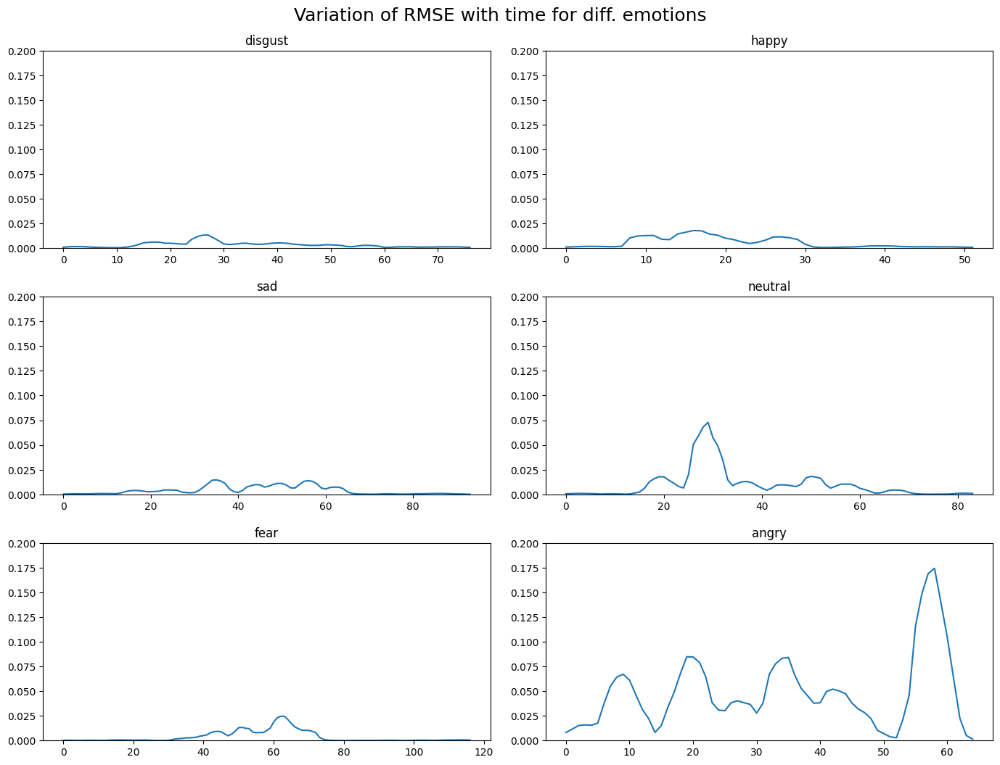

In [20]:
plt.figure(figsize=(14, 14))
emos,i = [],1
for wav in os.listdir(dpath):
  lab = cre_labs[wav.split('_')[2]]
  if lab not in emos:
    emos.append(lab)
    audio_path = os.path.join(dpath,wav)
    y, sr = librosa.load(audio_path,sr=16000)
    ytrim, index = librosa.effects.trim(y,top_db=25)
    yclean = nr.reduce_noise(y=ytrim, sr=sr)
    plt.subplot(4,2,i)
    plt.title(lab)
    rmse = librosa.feature.rms(y=yclean)
    plt.ylim(0,0.2)
    plt.plot(rmse[0])
    i+=1
  if len(emos)==6:
    break
plt.suptitle("Variation of RMSE with time for diff. emotions",fontsize=18)
plt.tight_layout(pad=1.5)
plt.show()

### **Feature Extraction**

In [21]:
audio_path = os.path.join(dpath,os.listdir(dpath)[0])
y, sr = librosa.load(audio_path,sr=16000)
ytrim, index = librosa.effects.trim(y,top_db=25)
yclean = nr.reduce_noise(y=ytrim, sr=sr)
dur = librosa.get_duration(y=yclean,sr=sr)
print("Duration:", dur)

mfcc = librosa.feature.mfcc(y=yclean, sr=sr, n_mfcc=13)
print("MFCC:", mfcc.shape)

mfcc2 = librosa.feature.mfcc(y=yclean, sr=sr, n_mfcc=20)
print("MFCC:", mfcc2.shape)

mfsp=librosa.feature.melspectrogram(y=yclean, sr=sr)
print("MFSP:", mfsp.shape)

zcr = librosa.feature.zero_crossing_rate(yclean)
print("Zero Crossing Rate:", zcr.shape)

rms = librosa.feature.rms(y=yclean)
print("RMS:", rms.shape)

chroma_stft = librosa.feature.chroma_stft(y=yclean, sr=sr)
print("Chroma STFT:", chroma_stft.shape)

spectral_contrast = librosa.feature.spectral_contrast(y=yclean, sr=sr)
print("Spectral Contrast:", spectral_contrast.shape)

tonnetz = librosa.feature.tonnetz(y=librosa.effects.harmonic(yclean), sr=sr)
print("Tonnetz:", tonnetz.shape)

Duration: 2.43575
MFCC: (13, 77)
MFCC: (20, 77)
MFSP: (128, 77)
Zero Crossing Rate: (1, 77)
RMS: (1, 77)
Chroma STFT: (12, 77)
Spectral Contrast: (7, 77)
Tonnetz: (6, 77)


In [43]:
from scipy.stats import skew, kurtosis
def compute_statistics(feature, name):
    stats = {}
    stats[f'{name}_mean'] = np.mean(feature)
    stats[f'{name}_std'] = np.std(feature)
    stats[f'{name}_median'] = np.median(feature)
    stats[f'{name}_min'] = np.min(feature)
    stats[f'{name}_max'] = np.max(feature)
    stats[f'{name}_range'] = np.max(feature) - np.min(feature)
    stats[f'{name}_skewness'] = skew(feature)
    stats[f'{name}_kurtosis'] = kurtosis(feature)
    stats[f'{name}_25_%tile'] = np.percentile(feature, 25)
    stats[f'{name}_75_%tile'] = np.percentile(feature, 75)
    return stats
def extract_features(audio, sr):
    features = {}
    audio, _ = librosa.effects.trim(audio,top_db=20)
    audio = nr.reduce_noise(y=audio, sr=sr)
    if np.sum(np.isnan(audio))>0:
        return 0
    mfs=librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128,fmax=8000).mean(axis=1)
    for i, value in enumerate(mfs):
        features[f'mfs{i+1}'] = value

    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=20).mean(axis=1)
    for i, value in enumerate(mfcc):
        features[f'mfcc{i+1}'] = value

    zcr = librosa.feature.zero_crossing_rate(audio)
    stats = compute_statistics(zcr[0], 'zcr')
    features.update(stats)

    rms = librosa.feature.rms(y=audio)
    stats = compute_statistics(rms[0], 'rms')
    features.update(stats)

    chroma = librosa.feature.chroma_stft(y=audio, sr=sr).mean(axis=1)
    for i, value in enumerate(chroma):
        features[f'chroma{i+1}'] = value

    spectral_contrast = librosa.feature.spectral_contrast(y=audio, sr=sr).mean(axis=1)
    for i, value in enumerate(spectral_contrast):
        features[f'spectral_contrast{i+1}'] = value

    tonnetz = librosa.feature.tonnetz(y=librosa.effects.harmonic(audio), sr=sr).mean(axis=1)
    for i, value in enumerate(tonnetz):
        features[f'tonnetz{i+1}'] = value
    return features

100%|██████████| 7442/7442 [36:15<00:00,  3.42it/s]


,mfs1,mfs2,mfs3,mfs4,mfs5,mfs6,mfs7,mfs8,mfs9,mfs10,...,spectral_contrast5,spectral_contrast6,spectral_contrast7,tonnetz1,tonnetz2,tonnetz3,tonnetz4,tonnetz5,tonnetz6,label
0,0.002623,0.001396,0.001924,0.002744,0.004027,0.007103,0.011077,0.013218,0.024847,0.018338,...,26.400070,38.527629,23.492026,0.015381,-0.012422,-0.105655,-0.019672,0.007007,0.012496,disgust
1,0.006485,0.005287,0.005749,0.008229,0.006079,0.003938,0.005943,0.014424,0.062798,0.216018,...,25.892634,23.371475,16.628296,0.003880,0.022485,-0.032189,-0.075089,0.056970,0.002570,happy
2,0.000178,0.002433,0.007462,0.004324,0.007019,0.009113,0.058549,0.054300,0.076637,0.107077,...,29.672101,23.971414,24.403650,0.003589,0.028384,-0.185712,0.027113,0.030109,-0.020663,happy
3,0.010380,0.005014,0.008693,0.027696,0.056692,1.118112,1.766167,10.305630,1.871540,0.178354,...,22.340157,20.758986,16.715712,0.098090,0.072312,0.116666,-0.224413,0.036498,0.002459,disgust
4,0.006408,0.004041,0.004868,0.049944,0.054115,0.009213,0.010143,0.015567,0.061086,0.094967,...,25.097815,22.971083,18.640203,0.026246,-0.053235,0.045788,0.036879,0.016800,0.025744,disgust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7436,0.005237,0.003045,0.004238,0.014994,0.016808,0.017379,0.027611,0.123947,0.459641,0.436703,...,27.983829,26.957299,17.268023,0.059969,0.014625,-0.033092,-0.024429,0.023034,0.005991,angry
7437,0.000932,0.004232,0.013059,0.045466,0.076840,0.505811,0.836050,0.535685,0.427407,0.768204,...,26.356438,27.418096,18.942220,-0.028369,0.003592,-0.044170,-0.052332,0.002054,-0.002394,angry
7438,0.003561,0.001469,0.001767,0.013737,0.042231,0.311419,0.291032,0.536210,0.618459,0.749315,...,31.406925,26.559391,21.147371,0.040838,-0.073778,-0.053573,-0.206587,0.018030,0.061686,angry
7439,0.001962,0.000920,0.001178,0.005777,0.012551,0.008476,0.002173,0.003000,0.036976,0.091195,...,23.289996,19.906455,16.683907,-0.019501,0.095059,-0.065825,-0.002430,0.023742,0.038807,sad


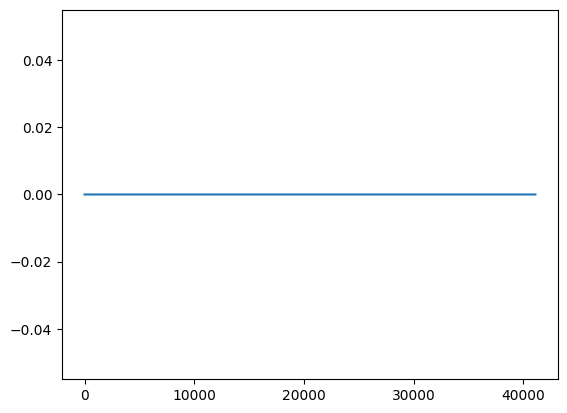

In [44]:
import warnings,tqdm
warnings.filterwarnings('ignore')
feats = []
for wav in tqdm.tqdm(os.listdir(dpath)):
    audio_path = os.path.join(dpath,wav)
    y, sr = librosa.load(audio_path,sr=16000)
    feat = extract_features(audio=y,sr=sr)
    if feat==0:
        plt.plot(y)
        continue
    label = cre_labs[wav.split('_')[2]]
    feat['label'] = label
    feats.append(feat)
df = pd.DataFrame(feats)
df

In [46]:
df['label'].value_counts()

label
disgust    1271
happy      1271
angry      1271
fear       1271
sad        1270
neutral    1087
Name: count, dtype: int64

In [48]:
df.to_csv('/kaggle/working/CREMA_D_MFCC_etc_features_trim_NR.csv',index=False)

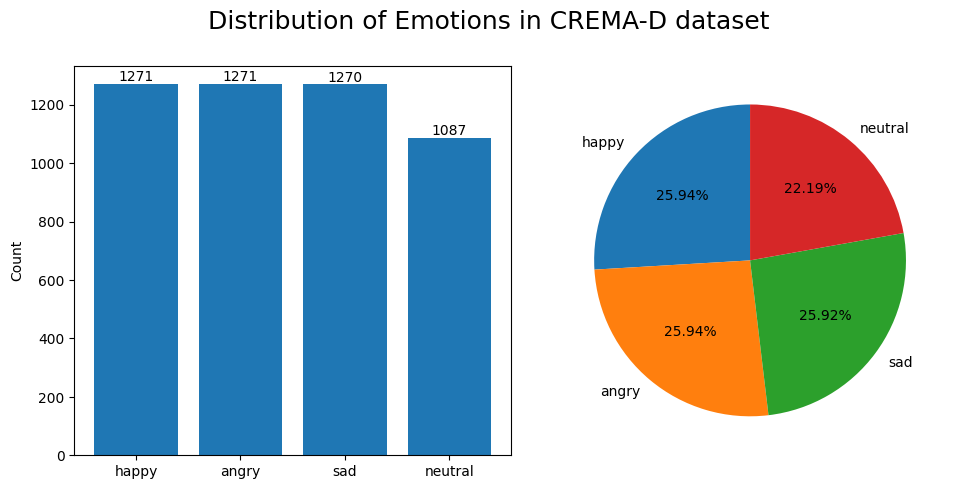

In [3]:
df = pd.read_csv('/kaggle/input/crema-d-mfcc-etc-features-trim-nr/CREMA_D_MFCC_etc_features_trim_NR.csv')
df = df[df['label'].isin(['happy','angry','sad','neutral'])]
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
bars = plt.bar(df['label'].value_counts().index, df['label'].value_counts().values)
plt.ylabel("Count")
for bar in bars.patches:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(),bar.get_height(), ha='center', va='bottom')
plt.subplot(1, 2, 2)
df['label'].value_counts().plot(kind='pie',autopct='%1.2f%%',startangle=90)
plt.ylabel('')
plt.suptitle('Distribution of Emotions in CREMA-D dataset', fontsize=18)
plt.tight_layout(pad=1.5)
plt.show()

### **Preprocessing, Training, Hyperparameter Tuning and Testing using ML Models**

In [4]:
def preprocess_split_train_test(df,model,name,apply_smote=False,rs=536,printres=True,returnModelFiles=False,apply_LDA=True,hppms=None):
  x = df.drop(['label'], axis=1)
  y = df['label']
  trainX, testX, trainY, testY = train_test_split(x, y, test_size=0.2, random_state=rs,stratify=y)
  scaler = StandardScaler()
  trainX = scaler.fit_transform(trainX)
  testX = scaler.transform(testX)
  if apply_LDA:
    lda = LinearDiscriminantAnalysis()
    trainX = lda.fit_transform(trainX, trainY)
    testX = lda.transform(testX)
  le = LabelEncoder()
  y2 = le.fit_transform(y)
  if name in ['XGBoost','SVM']:
    trainY, testY = le.transform(trainY), le.transform(testY)
  if apply_smote:
    smote = SMOTE(random_state=42)
    trainX, trainY = smote.fit_resample(trainX, trainY)
  if name in ['XGBoost','SVM']:
      if isinstance(trainY, pd.Series):
          trainY = trainY.to_numpy().astype(np.int32)
          testY = testY.to_numpy().astype(np.int32)
      else:
          trainY = trainY.astype(np.int32)
          testY = testY.astype(np.int32)
  #print(trainX.shape,trainX.var())
  model.fit(trainX, trainY)
  predictions = model.predict(testX)
  acc = accuracy_score(testY, predictions)
  #print(model.get_params())
  #print(acc)
  if printres:
    plot_confusion_matrix(testY, predictions,le.classes_)
    print(f"\n{name} Accuracy: {acc*100:.3f}%")
    print(classification_report(testY, predictions))
  if returnModelFiles:
    return model,scaler,acc
  if hppms:
    return acc,hppms
  return acc

In [5]:
def plot_confusion_matrix(y_true, y_pred,labels):
  cm = confusion_matrix(y_true, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)
  disp.plot(cmap=plt.cm.Blues)
  plt.title("Confusion Matrix")
  plt.show()

#### **Hyperparameter Tuning of ML and Ensemble Models**

In [6]:
def getRandparams(mname):
    if mname == 'SVM':
        model_params = {
            'C': 10**np.random.uniform(np.log10(0.01), np.log10(10)),
            'gamma': 10**np.random.uniform(np.log10(0.00005), np.log10(0.0003)),
            'coef0': 10**np.random.uniform(0, np.log10(0.1)),
            'class_weight': np.random.choice(['balanced', None]),
            'multiclass_strategy': np.random.choice(['ovo', 'ovr']),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'XGBoost':
        model_params = {
            'learning_rate': np.random.uniform(0.01, 0.5),
            'n_estimators': np.random.randint(50, 200),
            'max_depth': np.random.randint(3, 20),
            'min_child_weight': np.random.randint(1, 10),
            'gamma': np.random.uniform(0, 1),
            'subsample': np.random.uniform(0.3, 1),
            'colsample_bytree': np.random.uniform(0.5, 1),
            'reg_alpha': np.random.uniform(0, 1),
            'reg_lambda': np.random.uniform(0, 1),
            'scale_pos_weight': np.random.uniform(1, 15),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'LogisticRegression':
        model_params = {
            'C': 10**np.random.uniform(np.log10(0.001), np.log10(10)),
            'solver': np.random.choice(['newton-cg', 'lbfgs','liblinear' ,'sag', 'saga']),
            'class_weight': np.random.choice(['balanced', None]),
            'penalty': np.random.choice(['l1', 'l2', 'elasticnet', None]),
            'random_state': np.random.randint(0, 1000),
        }
        if model_params['solver'] in ['lbfgs','newton-cg','sag']:
            model_params['penalty'] = np.random.choice(['l2', None])
        if model_params['solver'] == 'liblinear':
            model_params['penalty'] = np.random.choice(['l1', 'l2'])
        if model_params.get('penalty') == 'elasticnet':
            model_params['l1_ratio'] = np.random.uniform(0.0, 1.0)
    elif mname == 'RandomForest':
        model_params = {
            'n_estimators': np.random.randint(50, 600),
            'max_depth': np.random.randint(3, 50),
            'min_samples_split': np.random.randint(2, 20),
            'min_samples_leaf': np.random.randint(1, 10),
            'max_features': np.random.choice(['sqrt', 'log2', None]),
            'bootstrap': np.random.choice([True, False]),
            'class_weight': np.random.choice(['balanced', 'balanced_subsample', None]),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'KNN':
        model_params = {
            'n_neighbors': np.random.randint(3, 40),
            'weights': np.random.choice(['uniform', 'distance']),
            'algorithm': np.random.choice(['auto', 'ball_tree', 'kd_tree', 'brute']),
            'leaf_size': np.random.randint(20, 50),
            'p': np.random.choice([1, 2]),  # Minkowski metric (p=1 for Manhattan, p=2 for Euclidean)
        }
    elif mname == 'DecisionTree':
        model_params = {
            'criterion': np.random.choice(['gini', 'entropy', 'log_loss']),
            'splitter': np.random.choice(['best', 'random']),
            'max_depth': np.random.randint(3, 50),
            'min_samples_split': np.random.randint(2, 20),
            'min_samples_leaf': np.random.randint(1, 10),
            'max_features': np.random.choice([None, 'sqrt', 'log2']),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'NaiveBayes':
        model_params = {
            'var_smoothing': 1e-9
        }
    elif mname == 'AdaBoost':
        model_params = {
            'n_estimators': np.random.randint(50, 100),
            'learning_rate': np.random.uniform(0,2),
            'random_state': np.random.randint(0, 1000)
        }
    else:
        raise ValueError(f"Unsupported model name: {mname}")
    
    return model_params


In [7]:
def tune_ML_hppms(mname,model,iters=20,rs=None,apply_smote=None,apply_LDA=None):
    hpr = []
    max_acc = 0
    best_model_params,best_prep_params,phist = dict(),dict(),dict()
    st0 = time.time()
    all_params = dict()
    for k in range(iters):
        st = time.time()
        model_params = getRandparams(mname)
        rs2 = rs if rs else np.random.randint(0, 1000)
        smote = apply_smote if apply_smote is not None else np.random.choice([True,False])
        lda = apply_LDA if apply_LDA is not None else np.random.choice([True,False])
        prep_params = {'rs': rs2,
                       'apply_smote': smote,
                        'apply_LDA': lda}
        all_params = {**model_params, **prep_params}
        fparams = frozenset(all_params.items())
        #update model params
        model.set_params(**model_params)
        print(f"Iter No. - {k}")
        print(f"Model Params = {model_params}")
        print(f"Preprocessing Params = {prep_params}")
        acc = preprocess_split_train_test(df,model,mname,**prep_params,printres=False)
        en = time.time()
        tm = en-st
        tm0 = en-st0
        print(f"Time taken = {int(tm/60)} min {int(tm%60)} sec")
        ipd.clear_output(wait=True)
        print(f"Total Time taken = {int(tm0/60)} min {int(tm0%60)} sec")
        phist[fparams] = acc
        if acc>max_acc:
            max_acc = acc
            best_model_params = model_params
            best_prep_params = prep_params
            best_iter = k
        print(f"\nCurrent Accuracy = {acc*100:.2f}%")
        print(f"Best Accuracy = {max_acc*100:.2f}% at iter={best_iter}")
        print(f"Best Model Params Found so far = {best_model_params}\n")
        print(f"Best Preprocessing Params Found so far = {best_prep_params}\n")
    print("Hyperparameter Tuning Done!")
    model.set_params(**best_model_params)
    acc = preprocess_split_train_test(df,model,mname,**best_prep_params)
    return max_acc,best_model_params,best_prep_params,phist

In [15]:
def getRandParamsOptuna(mname,trial,n_features,sp_params=None):
    sp_params = sp_params or {}  # default to empty dict
    if mname == 'SVM':
        if 'C' in sp_params and isinstance(sp_params['C'], tuple):
            C = 10 ** trial.suggest_uniform('C', sp_params['C'][0], sp_params['C'][1])
        elif 'C' in sp_params:
            C = sp_params['C']
        else:
            C = trial.suggest_uniform('C',0.01,10)
        kernel = sp_params.get('kernel') or trial.suggest_categorical(
            'kernel', ['linear', 'poly', 'rbf', 'sigmoid']
        )
        multiclass_strategy = sp_params.get('multiclass_strategy') or trial.suggest_categorical(
            'multiclass_strategy', ['ovo', 'ovr']
        )
        gamma, coef0, random_state = None, None, None
        if sp_params.get('kernel') != 'linear':
            if 'gamma' in sp_params and isinstance(sp_params['gamma'], tuple):
                gamma = trial.suggest_uniform('gamma', sp_params['gamma'][0], sp_params['gamma'][1])
            elif 'gamma' in sp_params:
                gamma = sp_params['gamma']
            else:
                gamma_mode = trial.suggest_categorical('gamma', ['auto', 'scale', 'float'])
                if gamma_mode == 'float':
                    scale = 1 / n_features
                    gamma = trial.suggest_uniform('gamma_value', scale/10, scale*10)
                else:
                    gamma = gamma_mode
    
            if 'coef0' in sp_params and isinstance(sp_params['coef0'], tuple):
                coef0 = trial.suggest_uniform('coef0', sp_params['coef0'][0], sp_params['coef0'][1])
            elif 'coef0' in sp_params:
                coef0 = sp_params['coef0']
            else:
                coef0 = trial.suggest_uniform('coef0', 0, 1)
    
            if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
                random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
            elif 'random_state' in sp_params:
                random_state = sp_params['random_state']
            else:
                random_state = trial.suggest_int('random_state', 0, 1000)
            
        class_weight = sp_params.get('class_weight') or trial.suggest_categorical(
            'class_weight', ['balanced', None]
        )

        model_params = {
            'C': C,
            'kernel': kernel,
            'gamma': gamma or None,
            'coef0': coef0 or None,
            'class_weight': class_weight,
            'multiclass_strategy': multiclass_strategy,
            'random_state': random_state or None
        }
    elif mname == 'XGBoost':
        if 'learning_rate' in sp_params and isinstance(sp_params['learning_rate'], tuple):
            learning_rate = trial.suggest_uniform('learning_rate', sp_params['learning_rate'][0], sp_params['learning_rate'][1])
        elif 'learning_rate' in sp_params:
            learning_rate = sp_params['learning_rate']
        else:
            learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.5)
    
        if 'n_estimators' in sp_params and isinstance(sp_params['n_estimators'], tuple):
            n_estimators = trial.suggest_int('n_estimators', sp_params['n_estimators'][0], sp_params['n_estimators'][1])
        elif 'n_estimators' in sp_params:
            n_estimators = sp_params['n_estimators']
        else:
            n_estimators = trial.suggest_int('n_estimators', 50, 200)
    
        if 'max_depth' in sp_params and isinstance(sp_params['max_depth'], tuple):
            max_depth = trial.suggest_int('max_depth', sp_params['max_depth'][0], sp_params['max_depth'][1])
        elif 'max_depth' in sp_params:
            max_depth = sp_params['max_depth']
        else:
            max_depth = trial.suggest_int('max_depth', 3, 20)
    
        if 'min_child_weight' in sp_params and isinstance(sp_params['min_child_weight'], tuple):
            min_child_weight = trial.suggest_int('min_child_weight', sp_params['min_child_weight'][0], sp_params['min_child_weight'][1])
        elif 'min_child_weight' in sp_params:
            min_child_weight = sp_params['min_child_weight']
        else:
            min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    
        if 'gamma' in sp_params and isinstance(sp_params['gamma'], tuple):
            gamma = trial.suggest_uniform('gamma', sp_params['gamma'][0], sp_params['gamma'][1])
        elif 'gamma' in sp_params:
            gamma = sp_params['gamma']
        else:
            gamma = trial.suggest_uniform('gamma', 0, 1)
    
        if 'subsample' in sp_params and isinstance(sp_params['subsample'], tuple):
            subsample = trial.suggest_uniform('subsample', sp_params['subsample'][0], sp_params['subsample'][1])
        elif 'subsample' in sp_params:
            subsample = sp_params['subsample']
        else:
            subsample = trial.suggest_uniform('subsample', 0.3, 1)
    
        if 'colsample_bytree' in sp_params and isinstance(sp_params['colsample_bytree'], tuple):
            colsample_bytree = trial.suggest_uniform('colsample_bytree', sp_params['colsample_bytree'][0], sp_params['colsample_bytree'][1])
        elif 'colsample_bytree' in sp_params:
            colsample_bytree = sp_params['colsample_bytree']
        else:
            colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.5, 1)
    
        if 'reg_alpha' in sp_params and isinstance(sp_params['reg_alpha'], tuple):
            reg_alpha = trial.suggest_uniform('reg_alpha', sp_params['reg_alpha'][0], sp_params['reg_alpha'][1])
        elif 'reg_alpha' in sp_params:
            reg_alpha = sp_params['reg_alpha']
        else:
            reg_alpha = trial.suggest_uniform('reg_alpha', 0, 1)
    
        if 'reg_lambda' in sp_params and isinstance(sp_params['reg_lambda'], tuple):
            reg_lambda = trial.suggest_uniform('reg_lambda', sp_params['reg_lambda'][0], sp_params['reg_lambda'][1])
        elif 'reg_lambda' in sp_params:
            reg_lambda = sp_params['reg_lambda']
        else:
            reg_lambda = trial.suggest_uniform('reg_lambda', 0, 1)
    
        if 'scale_pos_weight' in sp_params and isinstance(sp_params['scale_pos_weight'], tuple):
            scale_pos_weight = trial.suggest_uniform('scale_pos_weight', sp_params['scale_pos_weight'][0], sp_params['scale_pos_weight'][1])
        elif 'scale_pos_weight' in sp_params:
            scale_pos_weight = sp_params['scale_pos_weight']
        else:
            scale_pos_weight = trial.suggest_uniform('scale_pos_weight', 1, 15)
    
        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)
    
        model_params = {
            'learning_rate': learning_rate,
            'n_estimators': n_estimators,
            'max_depth': max_depth,
            'min_child_weight': min_child_weight,
            'gamma': gamma,
            'subsample': subsample,
            'colsample_bytree': colsample_bytree,
            'reg_alpha': reg_alpha,
            'reg_lambda': reg_lambda,
            'scale_pos_weight': scale_pos_weight,
            'random_state': random_state
        }
    elif mname == 'LogisticRegression':
        if 'C' in sp_params and isinstance(sp_params['C'], tuple):
            C = trial.suggest_uniform('C', sp_params['C'][0]), np.log10(sp_params['C'][1])
        elif 'C' in sp_params:
            C = sp_params['C']
        else:
            C = trial.suggest_uniform('C', 0.001, 10)

        solver = sp_params.get('solver') or trial.suggest_categorical(
            'solver', ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
        )

        class_weight = sp_params.get('class_weight') or trial.suggest_categorical(
            'class_weight', ['balanced', None]
        )

        if 'penalty' in sp_params:
            penalty = sp_params['penalty']
        
        else:
            if solver in ['lbfgs', 'newton-cg', 'sag']:
                penalty = trial.suggest_categorical('penalty_l2_only', ['l2', None])
            elif solver == 'liblinear':
                penalty = trial.suggest_categorical('penalty_liblinear', ['l1', 'l2'])
            else:  # e.g. saga
                penalty = trial.suggest_categorical('penalty_all', ['l1', 'l2', 'elasticnet', None])

        if penalty == 'elasticnet':
            if 'l1_ratio' in sp_params:
                l1_ratio = sp_params['l1_ratio']
            else:
                l1_ratio = trial.suggest_uniform('l1_ratio', 0.0, 1.0)
        else:
            l1_ratio = None

        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)

        model_params = {
            'C': C,
            'solver': solver,
            'class_weight': class_weight,
            'penalty': penalty,
            'random_state': random_state
        }
        if l1_ratio is not None:
            model_params['l1_ratio'] = l1_ratio
    elif mname == 'RandomForest':
        if 'n_estimators' in sp_params and isinstance(sp_params['n_estimators'], tuple):
            n_estimators = trial.suggest_int('n_estimators', sp_params['n_estimators'][0], sp_params['n_estimators'][1])
        elif 'n_estimators' in sp_params:
            n_estimators = sp_params['n_estimators']
        else:
            n_estimators = trial.suggest_int('n_estimators', 50, 600)
    
        if 'max_depth' in sp_params and isinstance(sp_params['max_depth'], tuple):
            max_depth = trial.suggest_int('max_depth', sp_params['max_depth'][0], sp_params['max_depth'][1])
        elif 'max_depth' in sp_params:
            max_depth = sp_params['max_depth']
        else:
            max_depth = trial.suggest_int('max_depth', 3, 50)
    
        if 'min_samples_split' in sp_params and isinstance(sp_params['min_samples_split'], tuple):
            min_samples_split = trial.suggest_int('min_samples_split', sp_params['min_samples_split'][0], sp_params['min_samples_split'][1])
        elif 'min_samples_split' in sp_params:
            min_samples_split = sp_params['min_samples_split']
        else:
            min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    
        if 'min_samples_leaf' in sp_params and isinstance(sp_params['min_samples_leaf'], tuple):
            min_samples_leaf = trial.suggest_int('min_samples_leaf', sp_params['min_samples_leaf'][0], sp_params['min_samples_leaf'][1])
        elif 'min_samples_leaf' in sp_params:
            min_samples_leaf = sp_params['min_samples_leaf']
        else:
            min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    
        if 'max_features' in sp_params:
            max_features = sp_params['max_features']
        else:
            max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    
        if 'bootstrap' in sp_params:
            bootstrap = sp_params['bootstrap']
        else:
            bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    
        if 'class_weight' in sp_params:
            class_weight = sp_params['class_weight']
        else:
            class_weight = trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample', None])
    
        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)
    
        model_params = {
            'n_estimators': n_estimators,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'max_features': max_features,
            'bootstrap': bootstrap,
            'class_weight': class_weight,
            'random_state': random_state
        }
    elif mname == 'KNN':
        if 'n_neighbors' in sp_params and isinstance(sp_params['n_neighbors'], tuple):
            n_neighbors = trial.suggest_int('n_neighbors', sp_params['n_neighbors'][0], sp_params['n_neighbors'][1])
        elif 'n_neighbors' in sp_params:
            n_neighbors = sp_params['n_neighbors']
        else:
            n_neighbors = trial.suggest_int('n_neighbors', 3, 40)

        weights = sp_params.get('weights') or trial.suggest_categorical('weights', ['uniform', 'distance'])

        algorithm = sp_params.get('algorithm') or trial.suggest_categorical('algorithm',['auto', 'ball_tree', 'kd_tree', 'brute'])

        if 'leaf_size' in sp_params and isinstance(sp_params['leaf_size'], tuple):
            leaf_size = trial.suggest_int('leaf_size', sp_params['leaf_size'][0], sp_params['leaf_size'][1])
        elif 'leaf_size' in sp_params:
            leaf_size = sp_params['leaf_size']
        else:
            leaf_size = trial.suggest_int('leaf_size', 20, 50)

        p = sp_params.get('p') or trial.suggest_categorical('p',[1,2])
            
        model_params = {
            'n_neighbors': n_neighbors,
            'weights': weights,
            'algorithm': algorithm,
            'leaf_size': leaf_size,
            'p': p,
        }
    elif mname == 'DecisionTree':
        criterion = sp_params.get('criterion') or trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])
        splitter = sp_params.get('splitter') or trial.suggest_categorical('splitter', ['best', 'random'])

        if 'max_depth' in sp_params and isinstance(sp_params['max_depth'], tuple):
            max_depth = trial.suggest_int('max_depth', sp_params['max_depth'][0], sp_params['max_depth'][1])
        elif 'max_depth' in sp_params:
            max_depth = sp_params['max_depth']
        else:
            max_depth = trial.suggest_int('max_depth', 3, 50)

        if 'min_samples_split' in sp_params and isinstance(sp_params['min_samples_split'], tuple):
            min_samples_split = trial.suggest_int('min_samples_split', sp_params['min_samples_split'][0], sp_params['min_samples_split'][1])
        elif 'min_samples_split' in sp_params:
            min_samples_split = sp_params['min_samples_split']
        else:
            min_samples_split = trial.suggest_int('min_samples_split', 2, 20)

        if 'min_samples_leaf' in sp_params and isinstance(sp_params['min_samples_leaf'], tuple):
            min_samples_leaf = trial.suggest_int('min_samples_leaf', sp_params['min_samples_leaf'][0], sp_params['min_samples_leaf'][1])
        elif 'min_samples_leaf' in sp_params:
            min_samples_leaf = sp_params['min_samples_leaf']
        else:
            min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)

        if 'max_features' in sp_params:
            max_features = sp_params['max_features']
        else:
            max_features = trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])

        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)

        model_params = {
            'criterion': criterion,
            'splitter': splitter,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'max_features': max_features,
            'random_state': random_state
        }
    elif mname == 'NaiveBayes':
        model_params = {
            'var_smoothing': 1e-9
        }
    elif mname == 'AdaBoost':
        if 'n_estimators' in sp_params and isinstance(sp_params['n_estimators'], tuple):
            n_estimators = trial.suggest_int('n_estimators', sp_params['n_estimators'][0], sp_params['n_estimators'][1])
        elif 'n_estimators' in sp_params:
            n_estimators = sp_params['n_estimators']
        else:
            n_estimators = trial.suggest_int('n_estimators', 50, 100)

        if 'learning_rate' in sp_params and isinstance(sp_params['learning_rate'], tuple):
            learning_rate = trial.suggest_uniform('learning_rate', sp_params['learning_rate'][0], sp_params['learning_rate'][1])
        elif 'learning_rate' in sp_params:
            learning_rate = sp_params['learning_rate']
        else:
            learning_rate = trial.suggest_uniform('learning_rate', 0, 2)

        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)
            
        model_params = {
            'n_estimators': n_estimators,
            'learning_rate': learning_rate,
            'random_state': random_state
        }
    else:
        raise ValueError(f"Unsupported model name: {mname}")
    
    return model_params

In [13]:
import optuna
from optuna.visualization import plot_optimization_history, plot_param_importances

optuna.logging.set_verbosity(optuna.logging.WARNING)

def live_progress_callback(study, trial):
    ipd.clear_output(wait=True)
    print(f"Trial: {trial.number}\n"
          f"Params: {trial.params}\n"
          f"Accuracy = {trial.value*100:.2f}%\n")
    print(f"Best so far :\n "
          f"Trial: {study.best_trial.number}\n"
          f"Params: {study.best_params}\n"
          f"Accuracy = {study.best_value*100:.2f}%")

def run_optuna(mname,model,n_trials=20,rs=None,apply_smote=None,apply_LDA=None,sp_params=None):
    def optuna_objective(trial):
        rs2 = rs if rs else trial.suggest_int('rs',0, 1000)
        smote = apply_smote if apply_smote is not None else trial.suggest_categorical('apply_smote',[True,False])
        lda = apply_LDA if apply_LDA is not None else trial.suggest_categorical('apply_LDA',[True,False])
        prep_params = {'rs': rs2,
                       'apply_smote': smote,
                        'apply_LDA': lda}
        n_features = len(df['label'].unique())-1 if lda else df.shape[1]-1
        params = getRandParamsOptuna(mname,trial,n_features,sp_params)
        local_model = model
        if mname == 'SVM' and params['gamma'] == 'float':
            params['gamma'] = params['gamma_value']
        if mname == 'SVM' and params['kernel'] == 'linear':
            params_to_remove = ['kernel', 'random_state', 'coef0', 'gamma']
            filtered_params = {k: v for k, v in params.items() if k not in params_to_remove}
            local_model = LinearSVC(**filtered_params)
        else:
            local_model.set_params(**params)
        return preprocess_split_train_test(df,local_model,mname,printres=False,**prep_params)

    study = optuna.create_study(direction='maximize')
    start = time.time()
    study.optimize(optuna_objective, n_trials=n_trials,callbacks=[live_progress_callback])
    end = time.time()
    prep_prms = ['rs','apply_smote','apply_LDA']
    best_params = study.best_params
    if rs:
        best_params['rs'] = rs
    if apply_smote is not None:
        best_params['apply_smote'] = apply_smote
    if apply_LDA is not None:
        best_params['apply_LDA'] = apply_LDA
    if sp_params:
        for p,v in sp_params.items():
            if not isinstance(v,tuple):
                best_params[p] = v
    best_prep_params = {k:v for k,v in best_params.items() if k in prep_prms}
    best_model_params = {k:v for k,v in best_params.items() if k not in prep_prms}
    local_model = model
    if mname == 'SVM' and best_model_params['kernel'] == 'linear':
        params_to_remove = ['kernel', 'random_state', 'coef0', 'gamma']
        filtered_params = {k: v for k, v in best_model_params.items() if k not in params_to_remove}
        local_model = LinearSVC(**filtered_params)
    else:
        for pen in ['penalty_l2_only', 'penalty_liblinear', 'penalty_all']:
            if pen in best_model_params:
                best_model_params['penalty'] = best_model_params.pop(pen)
                break
        local_model.set_params(**best_model_params)
    #print(local_model.get_params())
    #print(best_prep_params)
    #print(best_model_params)
    acc = preprocess_split_train_test(df,local_model,mname,**best_prep_params)
    #print(acc)
    print(f"\nTime taken = {int((end-start)/60)} min {int((end-start)%60)} sec\n")
    return {
        'best_score': study.best_value,
        'best_params': best_params,
        'time': end - start,
        'study': study
    }

def visualize_tuning(study):
    fig1 = optuna.visualization.matplotlib.plot_optimization_history(study)
    fig2 = optuna.visualization.matplotlib.plot_param_importances(study)
    fig3 = optuna.visualization.matplotlib.plot_parallel_coordinate(study, params=list(study.best_params.keys()))
    fig3.figure.set_size_inches(15, 6)
    for collection in fig3.collections:
        if hasattr(collection, 'set_cmap'):
            collection.set_cmap(cm.coolwarm)
    plt.show(fig1)
    plt.show(fig2)
    plt.show(fig3)
    fig4 = optuna.visualization.matplotlib.plot_slice(res['study'], params=list(res['study'].best_params.keys()))
    plt.show()

### **K-Nearest Neighbors Classifier**

Total Time taken = 9 min 53 sec

Current Accuracy = 64.59%
Best Accuracy = 68.16% at iter=40
Best Model Params Found so far = {'n_neighbors': 35, 'weights': 'uniform', 'algorithm': 'brute', 'leaf_size': 24, 'p': 1}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': True, 'apply_LDA': True}

Hyperparameter Tuning Done!


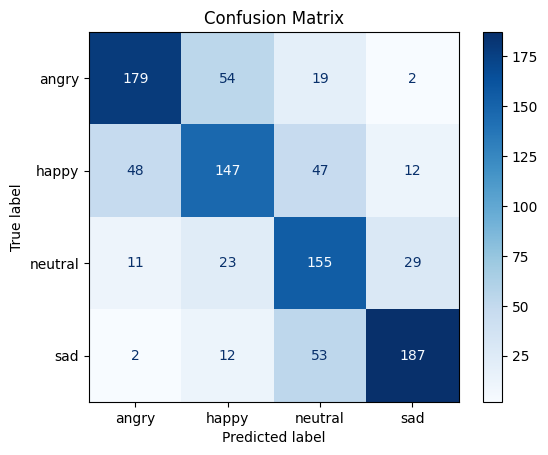


KNN Accuracy: 68.163%
              precision    recall  f1-score   support

       angry       0.75      0.70      0.72       254
       happy       0.62      0.58      0.60       254
     neutral       0.57      0.71      0.63       218
         sad       0.81      0.74      0.77       254

    accuracy                           0.68       980
   macro avg       0.69      0.68      0.68       980
weighted avg       0.69      0.68      0.68       980



In [13]:
knn_model = KNeighborsClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('KNN',knn_model,iters=1000,rs=650)

Trial: 499
Params: {'n_neighbors': 37, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 34, 'p': 1, 'apply_smote': False, 'apply_LDA': False}
Accuracy = 67.04%

Best so far :
 Trial: 11
Params: {'n_neighbors': 39, 'weights': 'distance', 'algorithm': 'auto', 'leaf_size': 49, 'p': 1, 'apply_smote': False, 'apply_LDA': True}
Accuracy = 68.16%


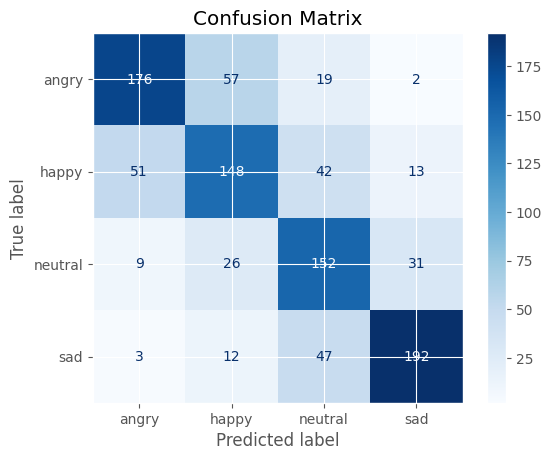


KNN Accuracy: 68.163%
              precision    recall  f1-score   support

       angry       0.74      0.69      0.71       254
       happy       0.61      0.58      0.60       254
     neutral       0.58      0.70      0.64       218
         sad       0.81      0.76      0.78       254

    accuracy                           0.68       980
   macro avg       0.68      0.68      0.68       980
weighted avg       0.69      0.68      0.68       980


Time taken = 2 min 16 sec



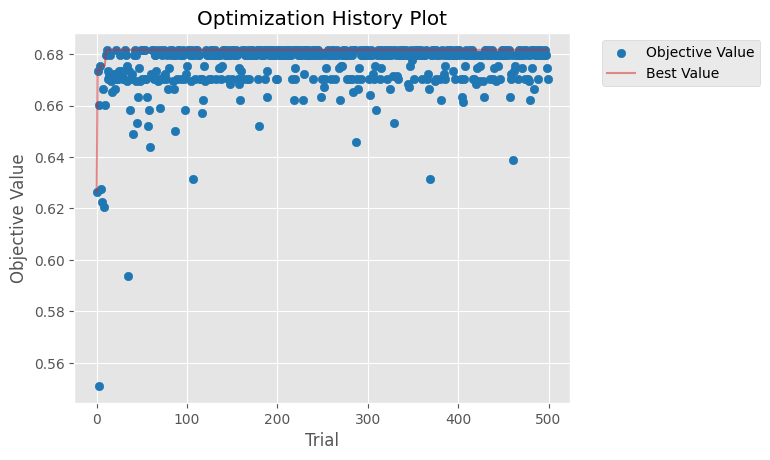

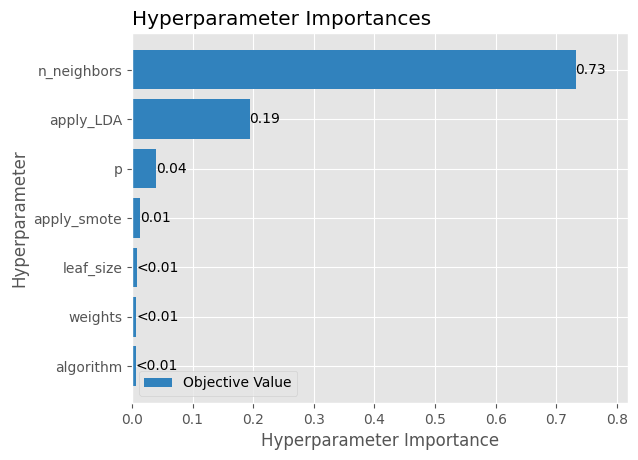

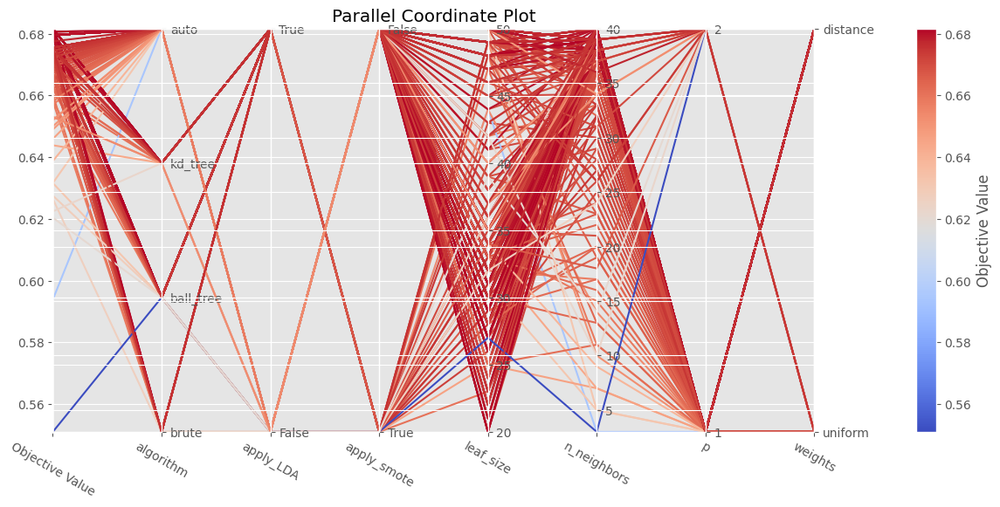

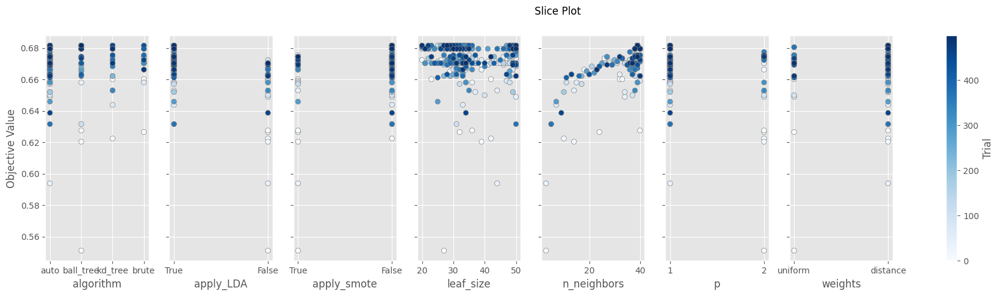

In [100]:
knn_model = KNeighborsClassifier()
res = run_optuna('KNN',knn_model,n_trials=500,rs=650)
visualize_tuning(res['study'])

### **Decision Tree Classifier**

Total Time taken = 2 min 2 sec

Current Accuracy = 56.12%
Best Accuracy = 65.61% at iter=50
Best Model Params Found so far = {'criterion': 'log_loss', 'splitter': 'random', 'max_depth': 23, 'min_samples_split': 7, 'min_samples_leaf': 7, 'max_features': None, 'random_state': 892}

Best Preprocessing Params Found so far = {'rs': 219, 'apply_smote': True, 'apply_LDA': True}

Hyperparameter Tuning Done!


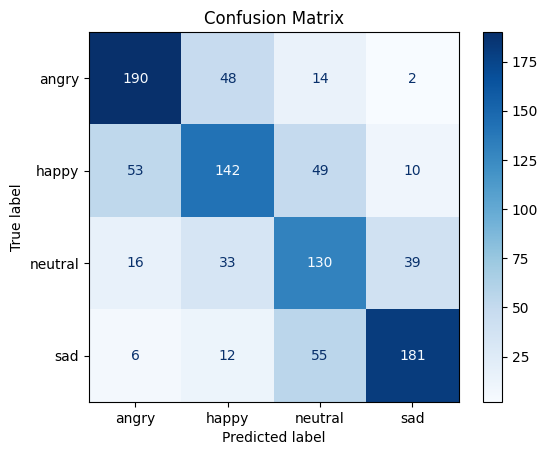


DecisionTree Accuracy: 65.612%
              precision    recall  f1-score   support

       angry       0.72      0.75      0.73       254
       happy       0.60      0.56      0.58       254
     neutral       0.52      0.60      0.56       218
         sad       0.78      0.71      0.74       254

    accuracy                           0.66       980
   macro avg       0.66      0.65      0.65       980
weighted avg       0.66      0.66      0.66       980



In [12]:
dt_model = DecisionTreeClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('DecisionTree',dt_model,iters=500)

Trial: 499
Params: {'criterion': 'gini', 'splitter': 'best', 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': None, 'random_state': 548, 'apply_smote': False, 'apply_LDA': True}
Accuracy = 66.02%

Best so far :
 Trial: 171
Params: {'criterion': 'gini', 'splitter': 'best', 'max_depth': 6, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': None, 'random_state': 203, 'apply_smote': False, 'apply_LDA': True}
Accuracy = 67.04%


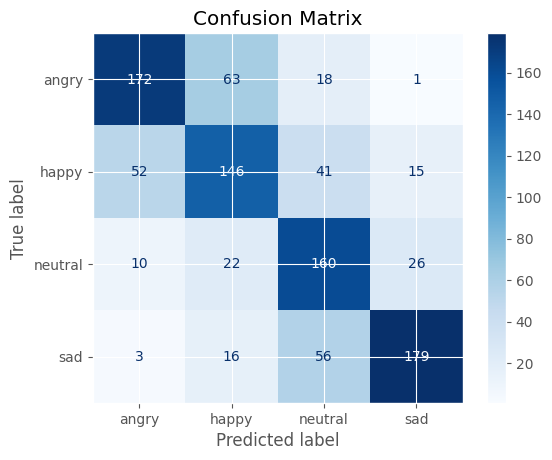


DecisionTree Accuracy: 67.041%
              precision    recall  f1-score   support

       angry       0.73      0.68      0.70       254
       happy       0.59      0.57      0.58       254
     neutral       0.58      0.73      0.65       218
         sad       0.81      0.70      0.75       254

    accuracy                           0.67       980
   macro avg       0.68      0.67      0.67       980
weighted avg       0.68      0.67      0.67       980


Time taken = 2 min 24 sec



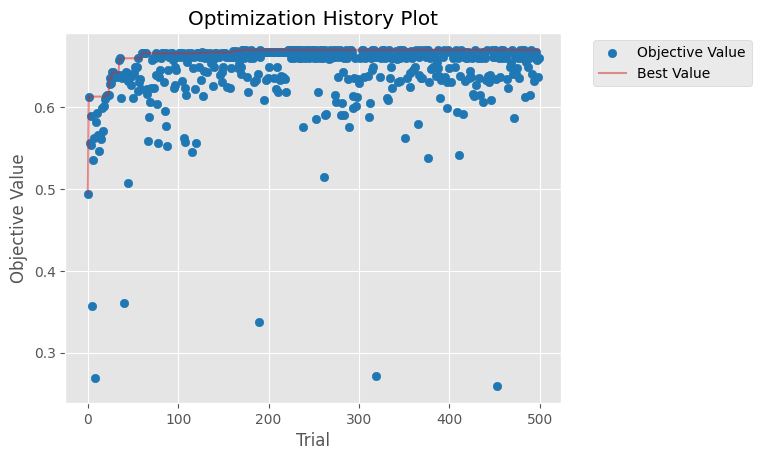

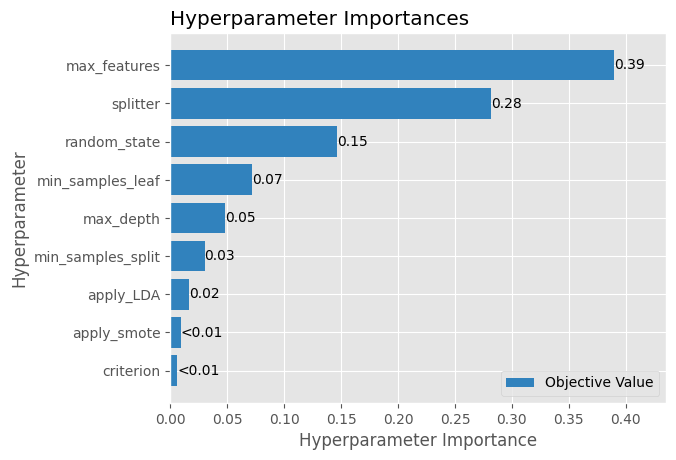

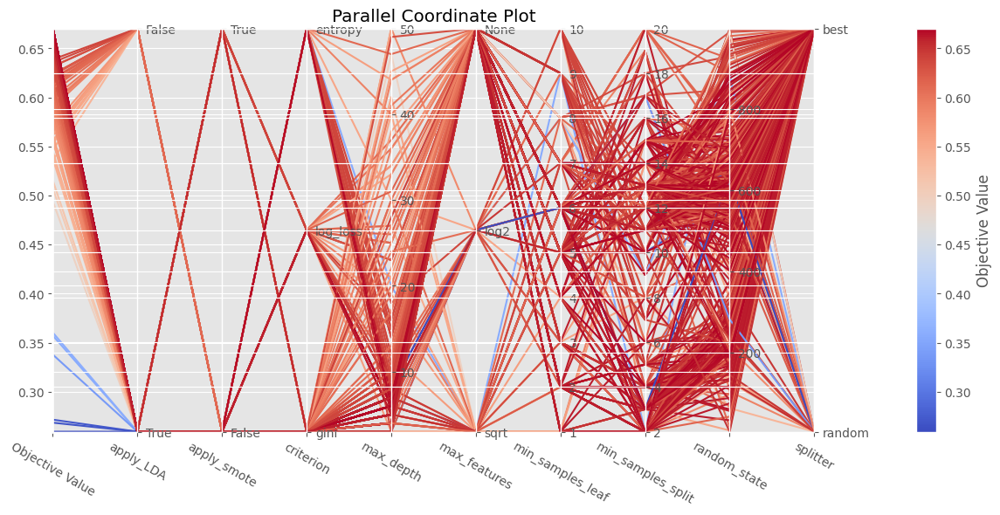

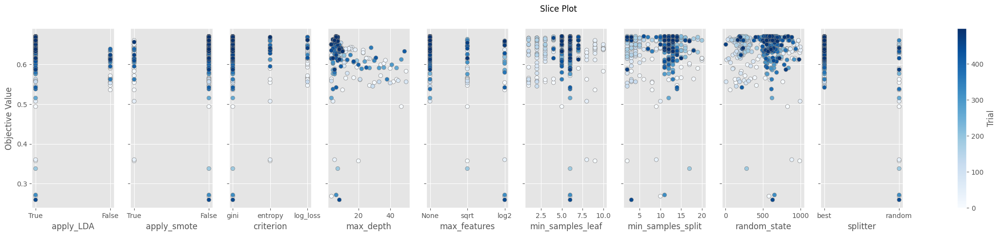

In [16]:
dt_model = DecisionTreeClassifier()
res = run_optuna('DecisionTree',dt_model,n_trials=500,rs=650)
visualize_tuning(res['study'])

Trial: 499
Params: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 18, 'min_samples_leaf': 10, 'random_state': 564, 'apply_smote': False, 'apply_LDA': True}
Accuracy = 66.53%

Best so far :
 Trial: 139
Params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 8, 'random_state': 436, 'apply_smote': False, 'apply_LDA': True}
Accuracy = 67.14%


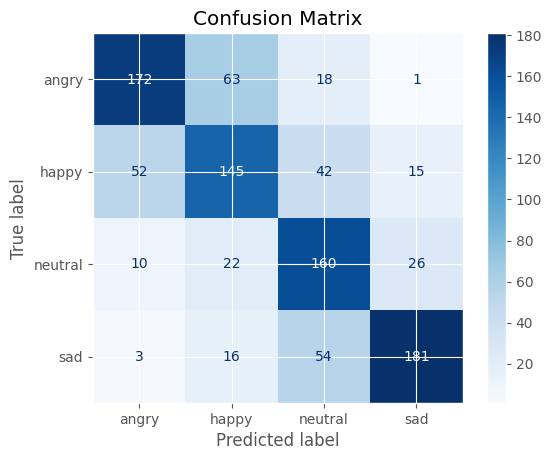


DecisionTree Accuracy: 67.143%
              precision    recall  f1-score   support

       angry       0.73      0.68      0.70       254
       happy       0.59      0.57      0.58       254
     neutral       0.58      0.73      0.65       218
         sad       0.81      0.71      0.76       254

    accuracy                           0.67       980
   macro avg       0.68      0.67      0.67       980
weighted avg       0.68      0.67      0.67       980


Time taken = 2 min 38 sec



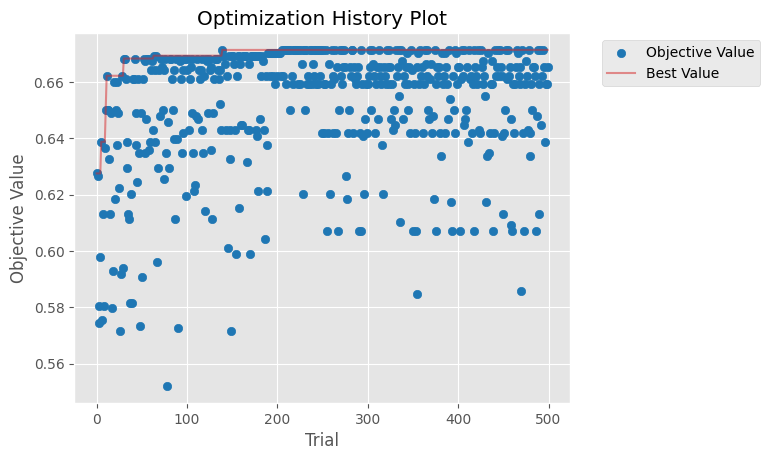

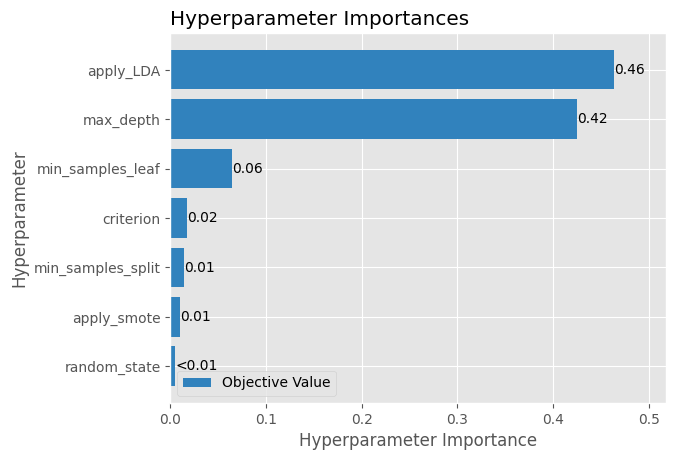

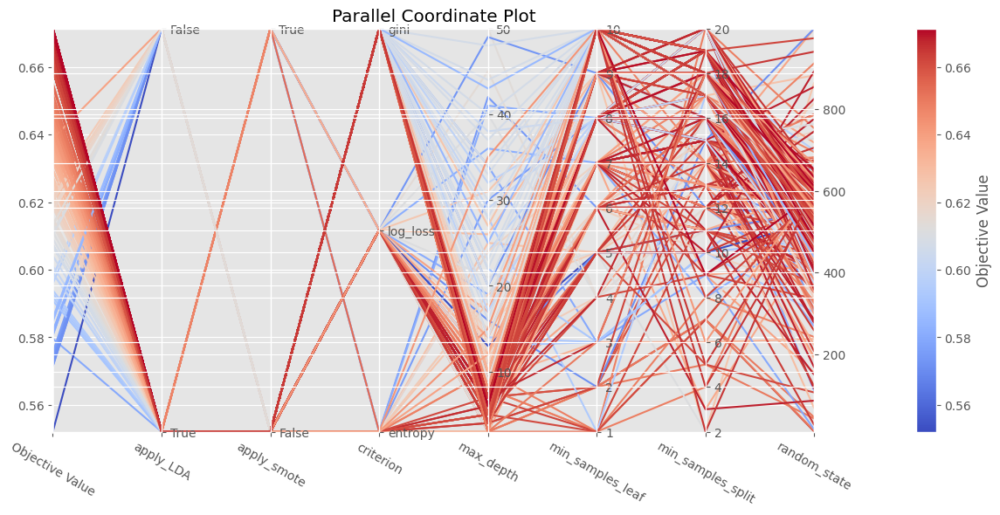

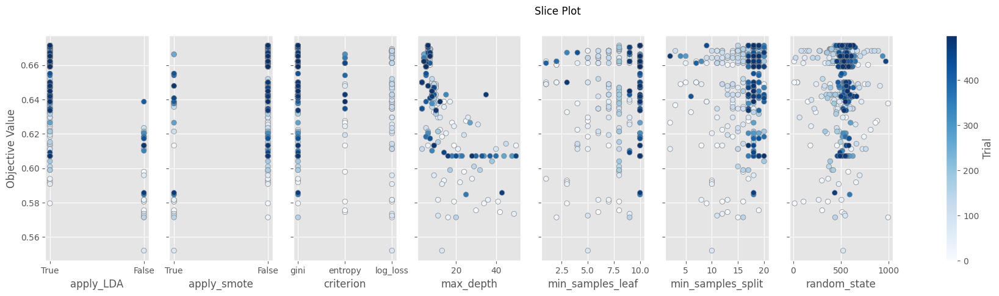

In [23]:
dt_model = DecisionTreeClassifier()
sp_params = {'splitter':'best','max_features':None}
res = run_optuna('DecisionTree',dt_model,n_trials=500,rs=650,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 499
Params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 9, 'random_state': 196, 'apply_smote': False}
Accuracy = 67.04%

Best so far :
 Trial: 24
Params: {'criterion': 'gini', 'max_depth': 6, 'min_samples_split': 11, 'min_samples_leaf': 10, 'random_state': 105, 'apply_smote': False}
Accuracy = 67.14%


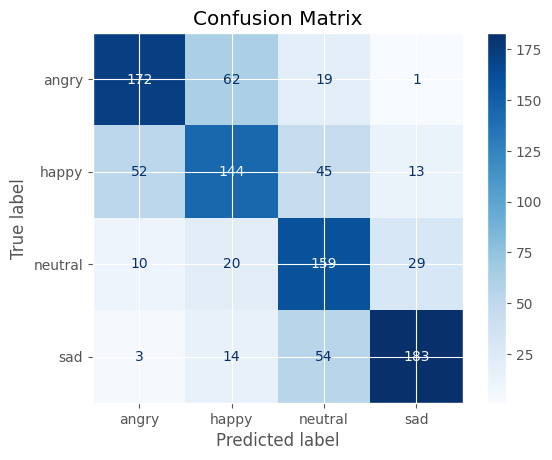


DecisionTree Accuracy: 67.143%
              precision    recall  f1-score   support

       angry       0.73      0.68      0.70       254
       happy       0.60      0.57      0.58       254
     neutral       0.57      0.73      0.64       218
         sad       0.81      0.72      0.76       254

    accuracy                           0.67       980
   macro avg       0.68      0.67      0.67       980
weighted avg       0.68      0.67      0.67       980


Time taken = 2 min 9 sec



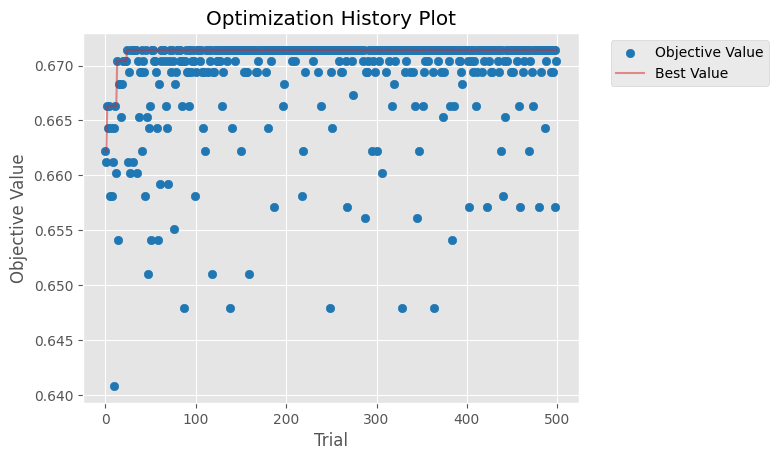

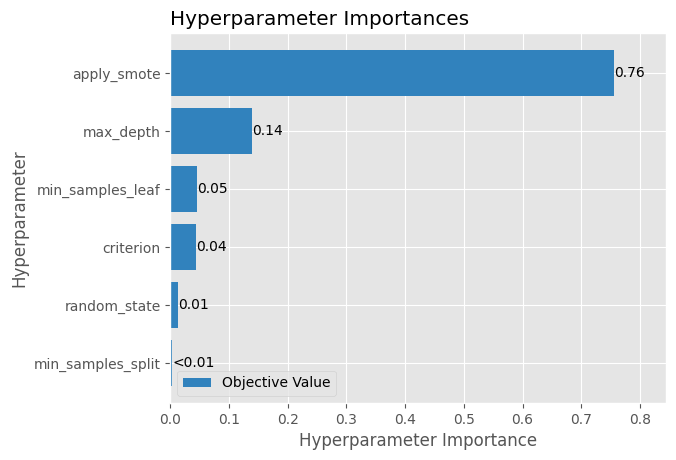

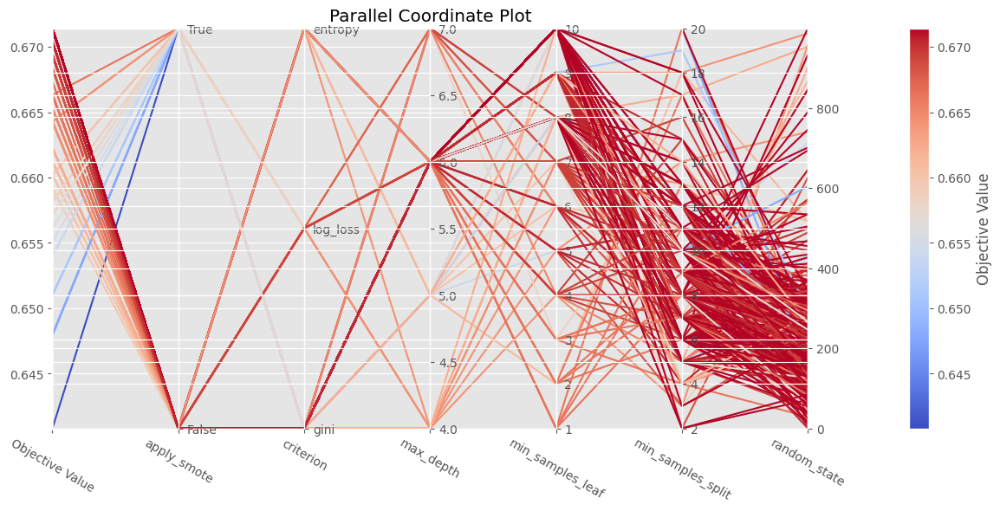

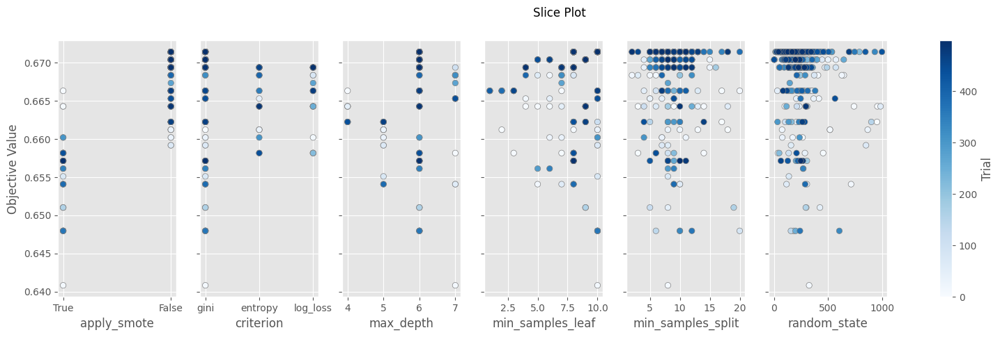

In [25]:
dt_model = DecisionTreeClassifier()
sp_params = {'splitter':'best','max_features':None,'max_depth':(4,7)}
res = run_optuna('DecisionTree',dt_model,n_trials=500,rs=650,apply_LDA=True,sp_params=sp_params)
visualize_tuning(res['study'])

### **Support Vector Classifier (CuML)**

Total Time taken = 1 min 36 sec

Current Accuracy = 56.84%
Best Accuracy = 67.35% at iter=50
Best Model Params Found so far = {'C': 7.431337415308706, 'gamma': 0.00028169145792369515, 'coef0': 0.6447249306918716, 'class_weight': None, 'multiclass_strategy': 'ovo', 'random_state': 406}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': True, 'apply_LDA': False}

Hyperparameter Tuning Done!


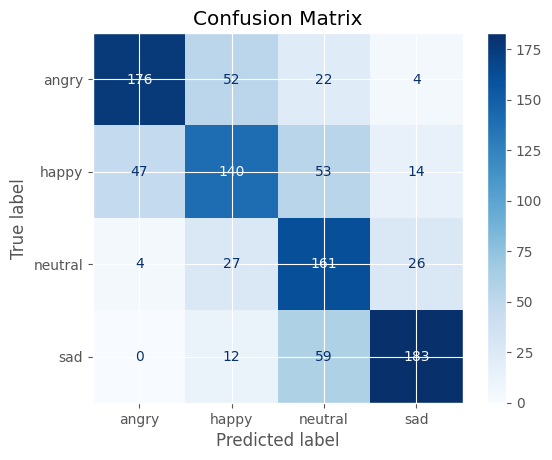


SVM Accuracy: 67.347%
              precision    recall  f1-score   support

           0       0.78      0.69      0.73       254
           1       0.61      0.55      0.58       254
           2       0.55      0.74      0.63       218
           3       0.81      0.72      0.76       254

    accuracy                           0.67       980
   macro avg       0.68      0.68      0.67       980
weighted avg       0.69      0.67      0.68       980



In [33]:
svm_model = cuSVC()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('SVM',svm_model,iters=200,rs=650)

Trial: 299
Params: {'C': 2.297383964546328, 'kernel': 'linear', 'multiclass_strategy': 'ovo', 'gamma': 0.0001516254611893905, 'coef0': 0.9217286494821915, 'class_weight': 'balanced', 'random_state': 252, 'apply_smote': True, 'apply_LDA': False}
Accuracy = 68.57%

Best so far :
 Trial: 285
Params: {'C': 2.6745094755562393, 'kernel': 'linear', 'multiclass_strategy': 'ovr', 'gamma': 0.00019236292346205955, 'coef0': 0.9370204142605787, 'class_weight': 'balanced', 'random_state': 207, 'apply_smote': True, 'apply_LDA': False}
Accuracy = 69.49%


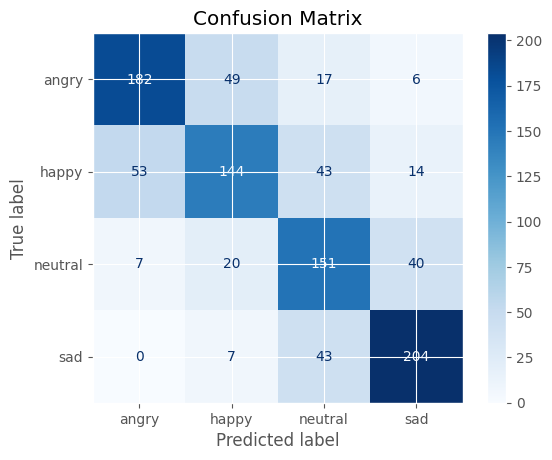


SVM Accuracy: 69.490%
              precision    recall  f1-score   support

           0       0.75      0.72      0.73       254
           1       0.65      0.57      0.61       254
           2       0.59      0.69      0.64       218
           3       0.77      0.80      0.79       254

    accuracy                           0.69       980
   macro avg       0.69      0.69      0.69       980
weighted avg       0.70      0.69      0.69       980


Time taken = 1 min 19 sec



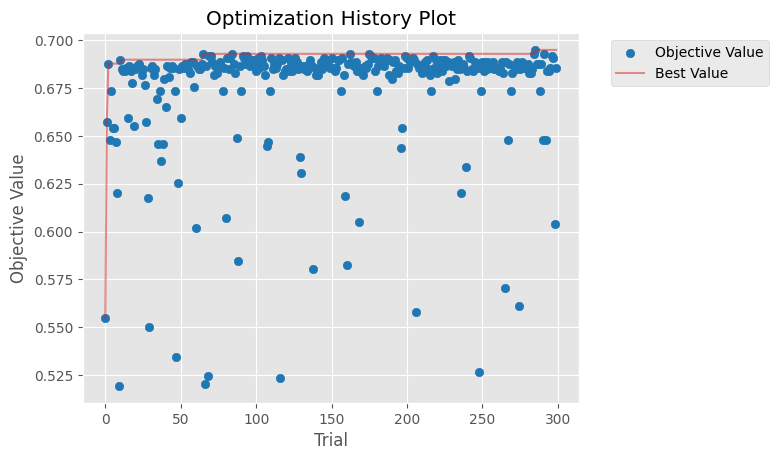

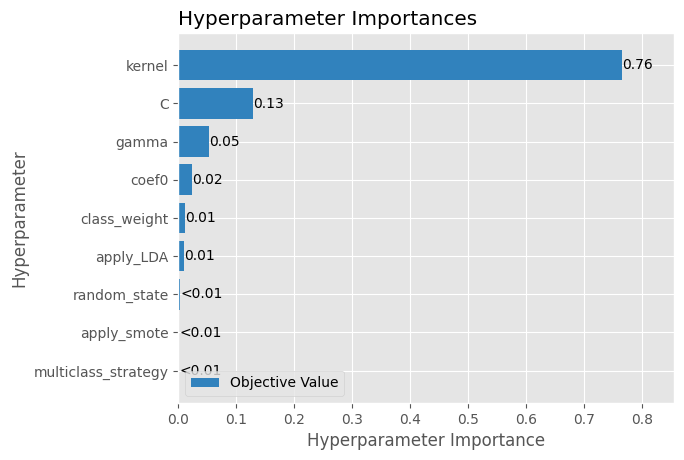

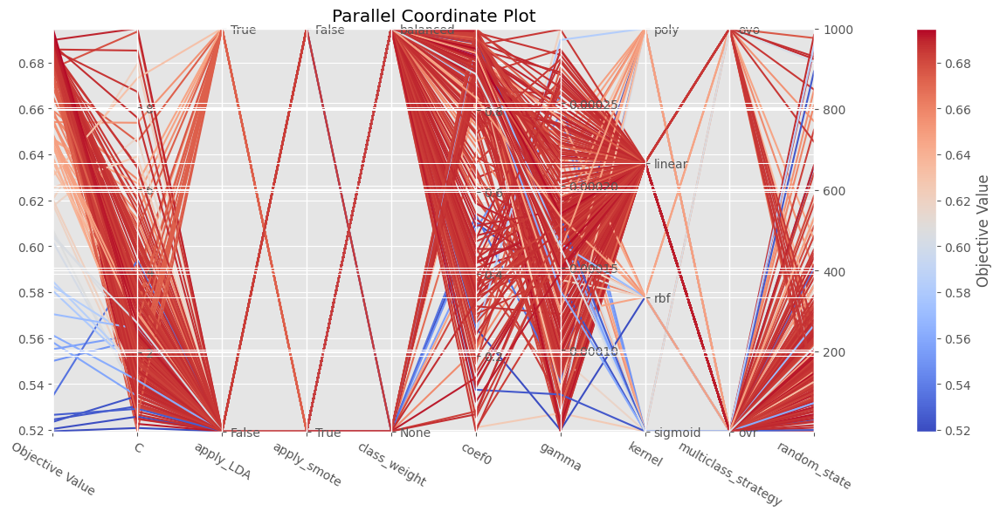

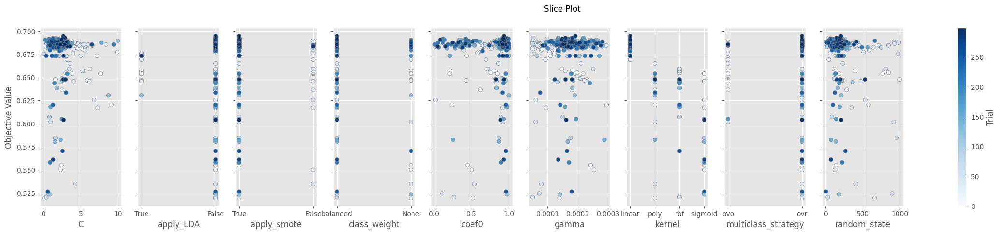

In [128]:
svm_model = cuSVC()
res = run_optuna('SVM',svm_model,n_trials=300,rs=650)
visualize_tuning(res['study'])

Trial: 299
Params: {'C': 0.8409765786608101, 'multiclass_strategy': 'ovo', 'class_weight': 'balanced', 'apply_smote': False}
Accuracy = 68.98%

Best so far :
 Trial: 292
Params: {'C': 6.328660307326754, 'multiclass_strategy': 'ovo', 'class_weight': 'balanced', 'apply_smote': True}
Accuracy = 69.49%


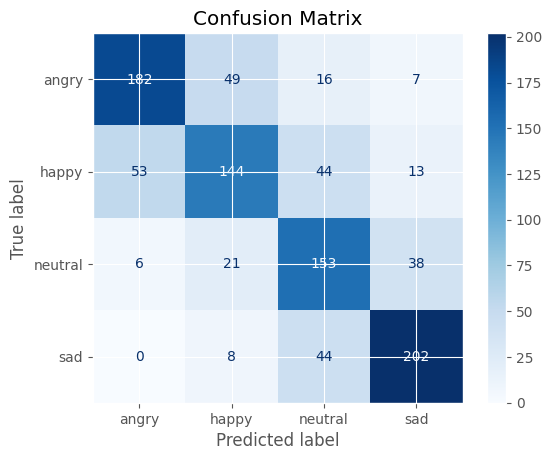


SVM Accuracy: 69.490%
              precision    recall  f1-score   support

           0       0.76      0.72      0.74       254
           1       0.65      0.57      0.61       254
           2       0.60      0.70      0.64       218
           3       0.78      0.80      0.79       254

    accuracy                           0.69       980
   macro avg       0.69      0.70      0.69       980
weighted avg       0.70      0.69      0.69       980


Time taken = 1 min 0 sec



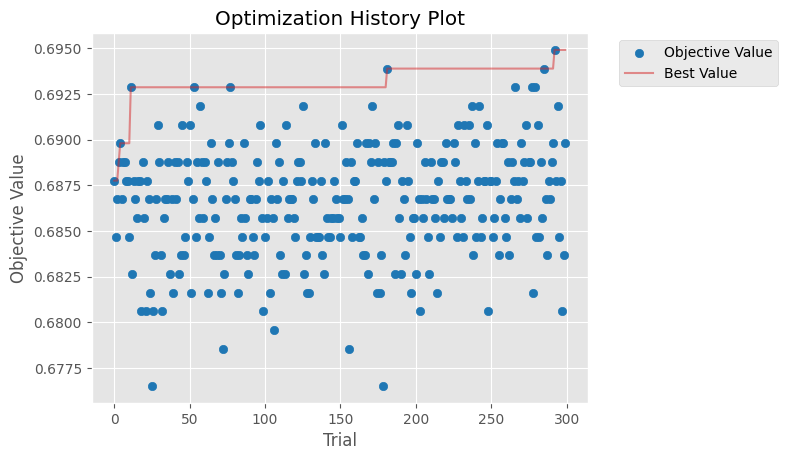

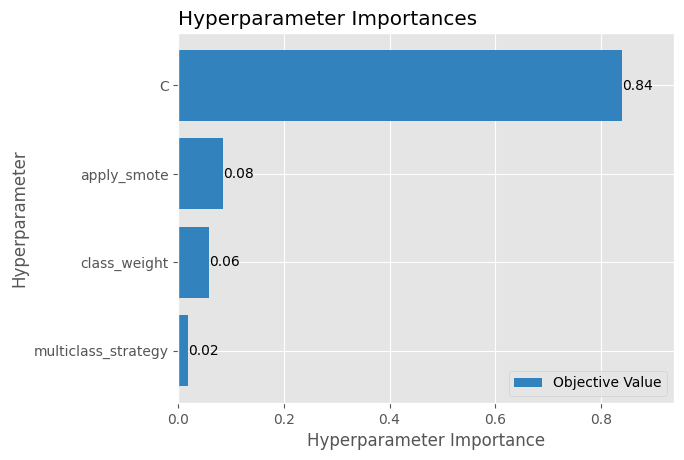

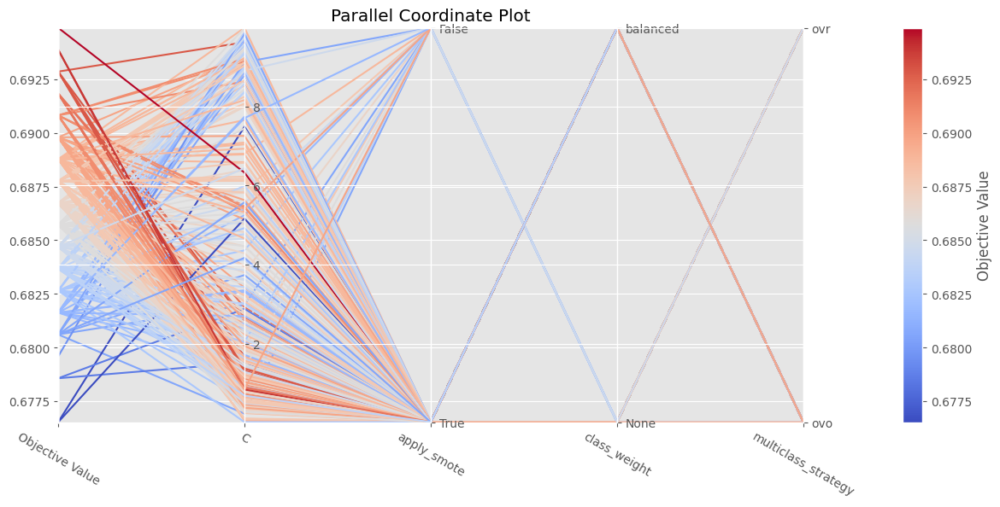

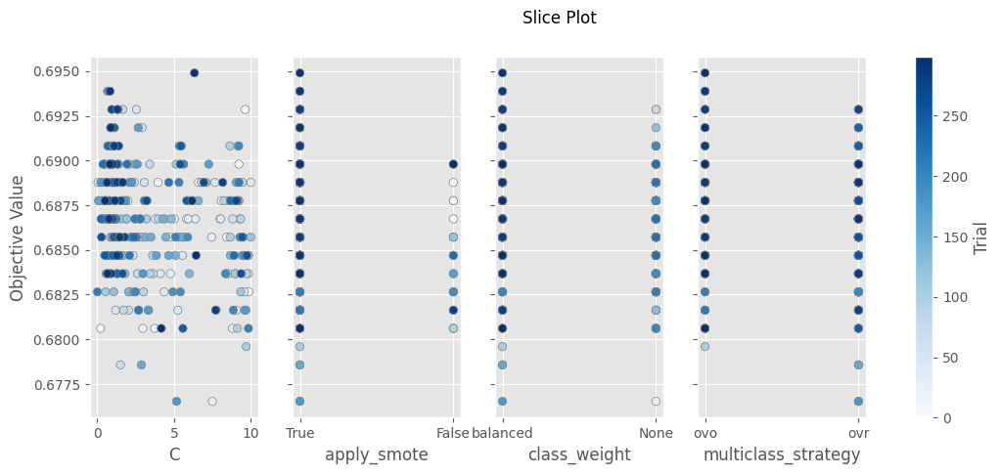

In [170]:
svm_model = cuSVC()
sp_params = {'kernel':'linear'}
res = run_optuna('SVM',svm_model,n_trials=300,rs=650,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 299
Params: {'apply_smote': True, 'apply_LDA': False, 'C': 9.53093849654512, 'multiclass_strategy': 'ovr', 'gamma': 'scale', 'coef0': 0.9075399246794298, 'random_state': 551, 'class_weight': None}
Accuracy = 71.73%

Best so far :
 Trial: 120
Params: {'apply_smote': True, 'apply_LDA': False, 'C': 9.359522511324919, 'multiclass_strategy': 'ovr', 'gamma': 'scale', 'coef0': 0.149501740246907, 'random_state': 470, 'class_weight': None}
Accuracy = 71.84%


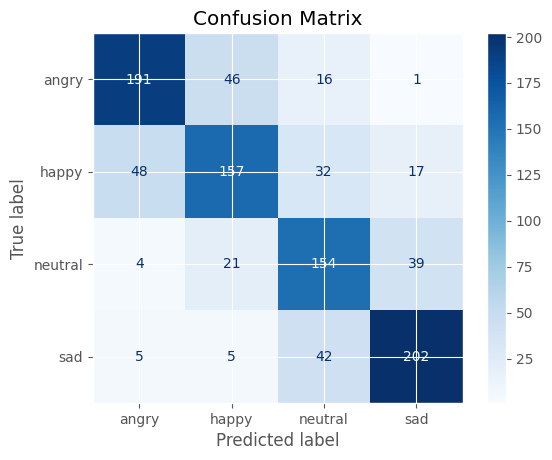


SVM Accuracy: 71.837%
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       254
           1       0.69      0.62      0.65       254
           2       0.63      0.71      0.67       218
           3       0.78      0.80      0.79       254

    accuracy                           0.72       980
   macro avg       0.72      0.72      0.72       980
weighted avg       0.72      0.72      0.72       980


Time taken = 6 min 39 sec



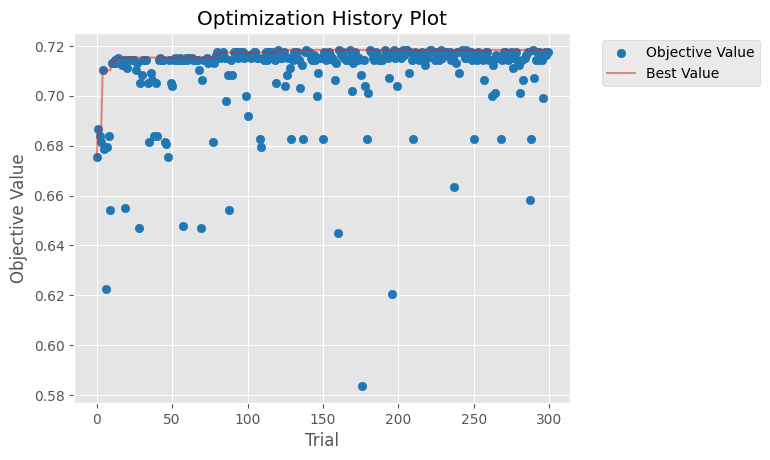

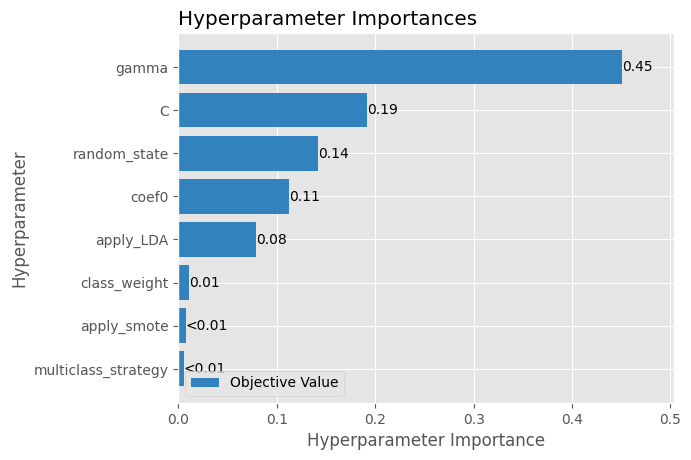

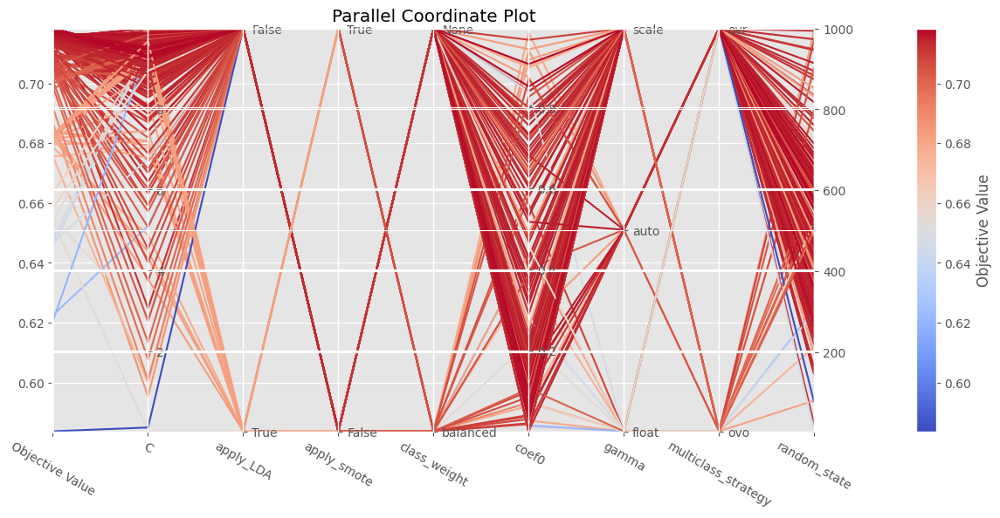

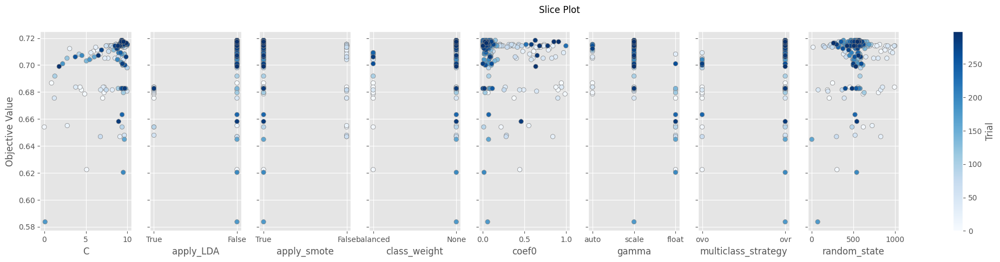

In [198]:
svm_model = cuSVC()
sp_params = {'kernel':'rbf'}
res = run_optuna('SVM',svm_model,n_trials=300,rs=650,sp_params=sp_params)
visualize_tuning(res['study'])

### **Logistic Regression**

Total Time taken = 3 min 18 sec

Current Accuracy = 67.04%
Best Accuracy = 68.88% at iter=15
Best Model Params Found so far = {'C': 1.9782867545415792, 'solver': 'saga', 'class_weight': None, 'penalty': 'elasticnet', 'random_state': 848, 'l1_ratio': 0.6436679648726301}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': False, 'apply_LDA': False}

Hyperparameter Tuning Done!


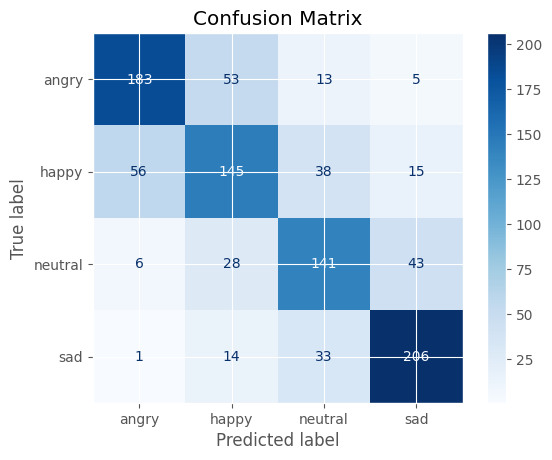


LogisticRegression Accuracy: 68.878%
              precision    recall  f1-score   support

       angry       0.74      0.72      0.73       254
       happy       0.60      0.57      0.59       254
     neutral       0.63      0.65      0.64       218
         sad       0.77      0.81      0.79       254

    accuracy                           0.69       980
   macro avg       0.69      0.69      0.69       980
weighted avg       0.69      0.69      0.69       980



In [202]:
lr_model = LogisticRegression(max_iter=1000)
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('LogisticRegression',lr_model,iters=50,rs=650)

Trial: 49
Params: {'apply_smote': False, 'apply_LDA': True, 'C': 2.4424730529416863, 'solver': 'saga', 'class_weight': None, 'penalty_all': None, 'random_state': 141}
Accuracy = 67.55%

Best so far :
 Trial: 45
Params: {'apply_smote': False, 'apply_LDA': False, 'C': 2.7603678650436176, 'solver': 'saga', 'class_weight': None, 'penalty_all': 'l1', 'random_state': 242}
Accuracy = 68.88%


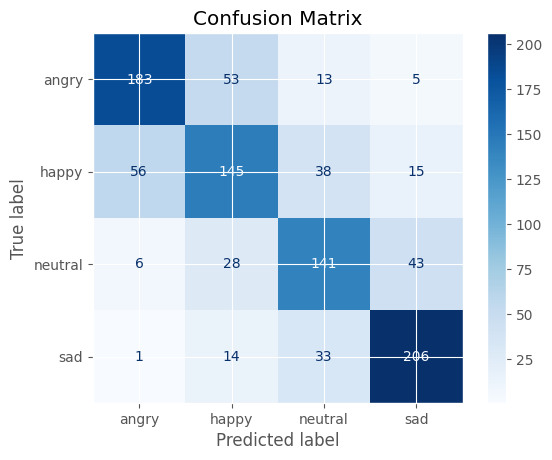


LogisticRegression Accuracy: 68.878%
              precision    recall  f1-score   support

       angry       0.74      0.72      0.73       254
       happy       0.60      0.57      0.59       254
     neutral       0.63      0.65      0.64       218
         sad       0.77      0.81      0.79       254

    accuracy                           0.69       980
   macro avg       0.69      0.69      0.69       980
weighted avg       0.69      0.69      0.69       980


Time taken = 12 min 8 sec



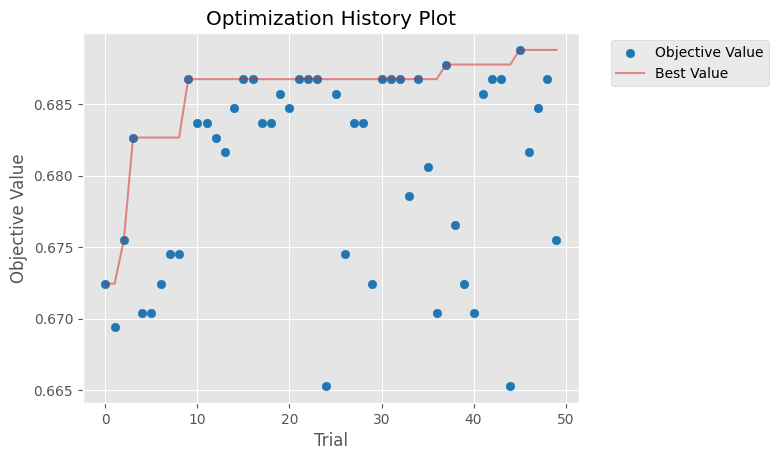

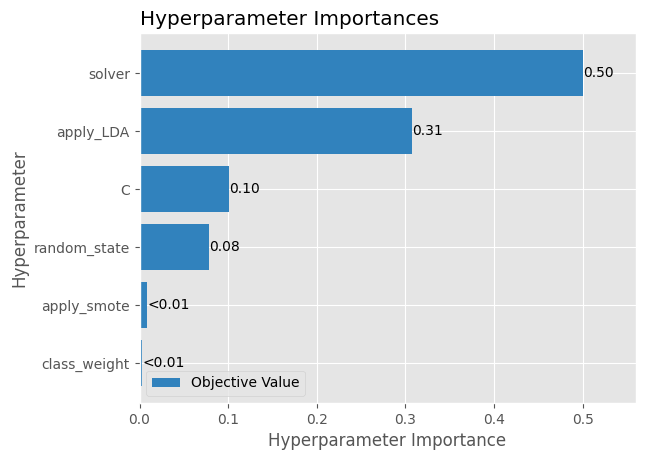

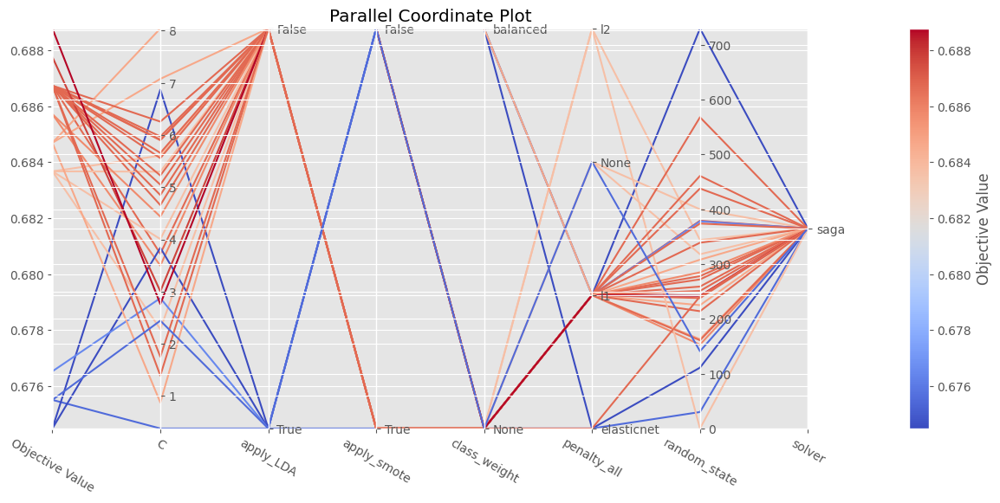

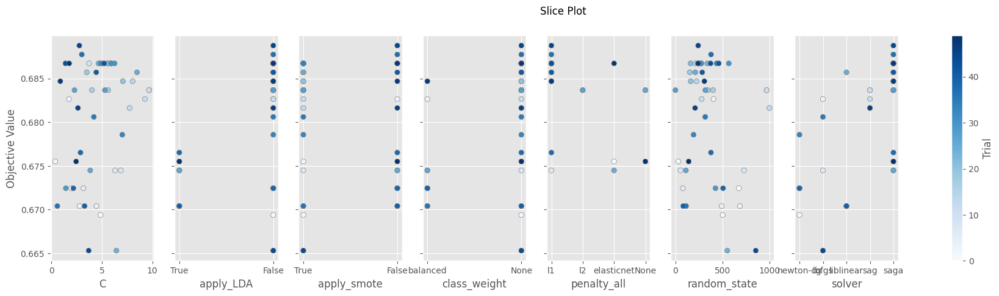

In [208]:
lr_model = LogisticRegression(max_iter=1000)
res = run_optuna('LogisticRegression',lr_model,n_trials=50,rs=650)
visualize_tuning(res['study'])

Trial: 49
Params: {'apply_smote': True, 'C': 1.3295348764899058, 'solver': 'lbfgs', 'class_weight': None, 'penalty_l2_only': None, 'random_state': 450}
Accuracy = 66.53%

Best so far :
 Trial: 34
Params: {'apply_smote': True, 'C': 0.6299558109755701, 'solver': 'saga', 'class_weight': None, 'penalty_all': 'elasticnet', 'l1_ratio': 0.22373605467882235, 'random_state': 352}
Accuracy = 68.98%


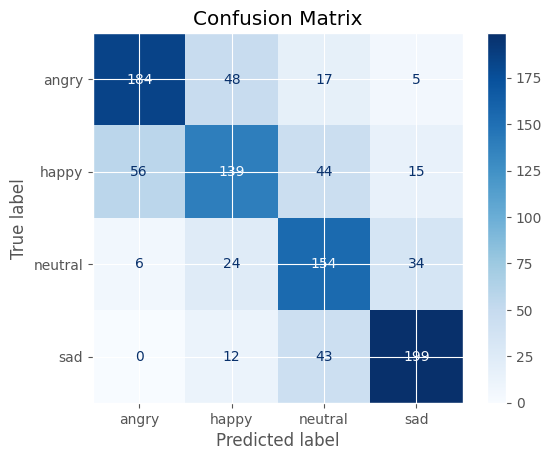


LogisticRegression Accuracy: 68.980%
              precision    recall  f1-score   support

       angry       0.75      0.72      0.74       254
       happy       0.62      0.55      0.58       254
     neutral       0.60      0.71      0.65       218
         sad       0.79      0.78      0.79       254

    accuracy                           0.69       980
   macro avg       0.69      0.69      0.69       980
weighted avg       0.69      0.69      0.69       980


Time taken = 14 min 1 sec



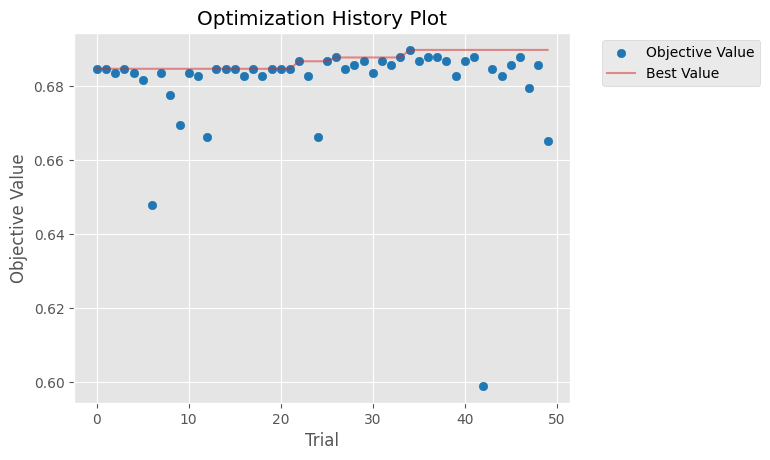

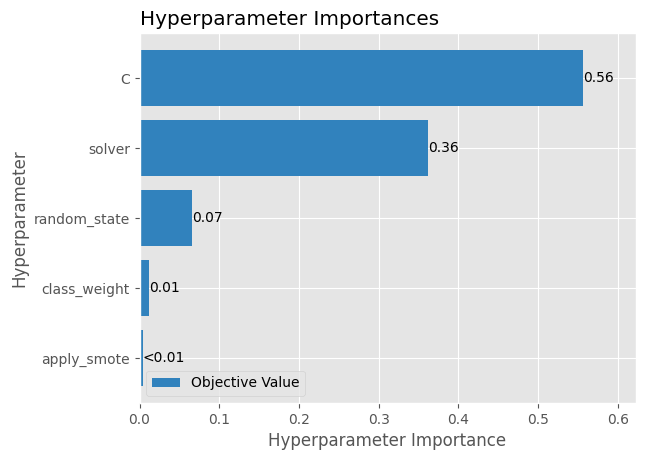

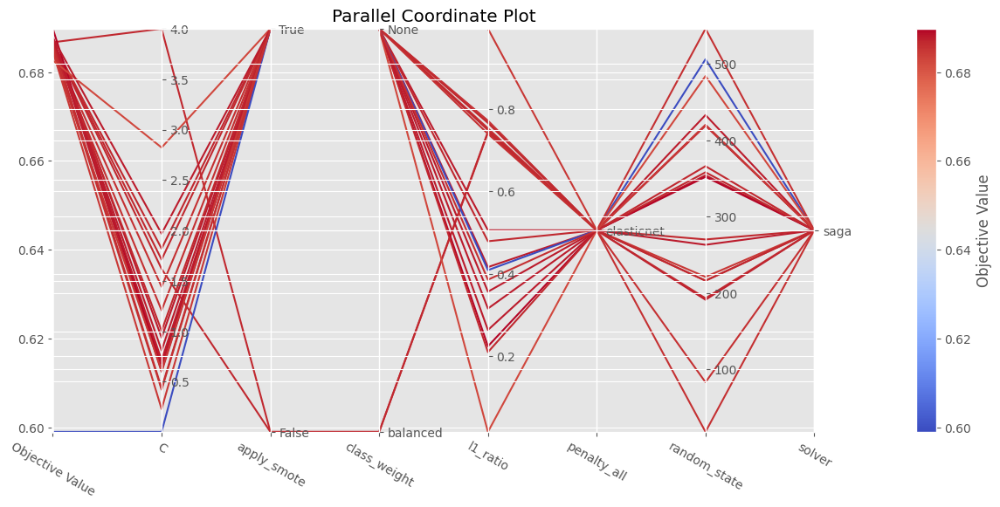

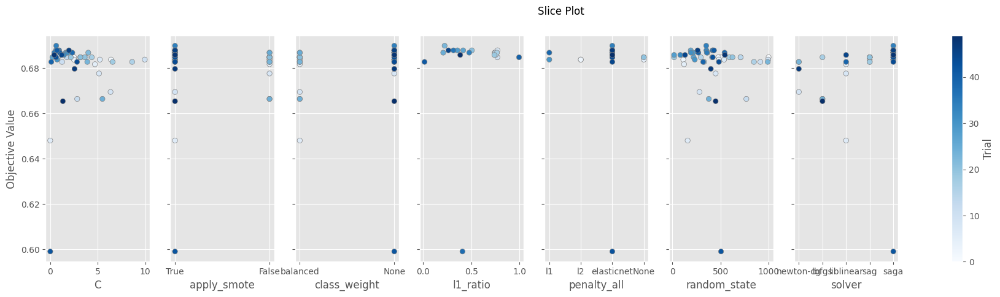

In [218]:
lr_model = LogisticRegression(max_iter=1000)
res = run_optuna('LogisticRegression',lr_model,n_trials=50,rs=650,apply_LDA=False)
visualize_tuning(res['study'])

Trial: 19
Params: {'C': 1.3835019824862764, 'class_weight': None, 'penalty_all': 'l2', 'random_state': 89}
Accuracy = 68.67%

Best so far :
 Trial: 3
Params: {'C': 0.6419359167687596, 'class_weight': None, 'penalty_all': 'l2', 'random_state': 156}
Accuracy = 68.78%


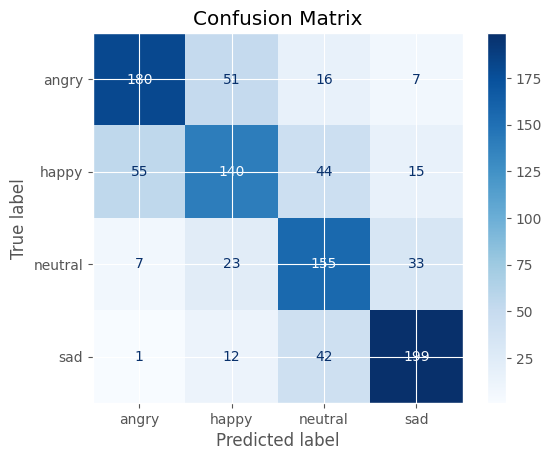


LogisticRegression Accuracy: 68.776%
              precision    recall  f1-score   support

       angry       0.74      0.71      0.72       254
       happy       0.62      0.55      0.58       254
     neutral       0.60      0.71      0.65       218
         sad       0.78      0.78      0.78       254

    accuracy                           0.69       980
   macro avg       0.69      0.69      0.69       980
weighted avg       0.69      0.69      0.69       980


Time taken = 7 min 27 sec



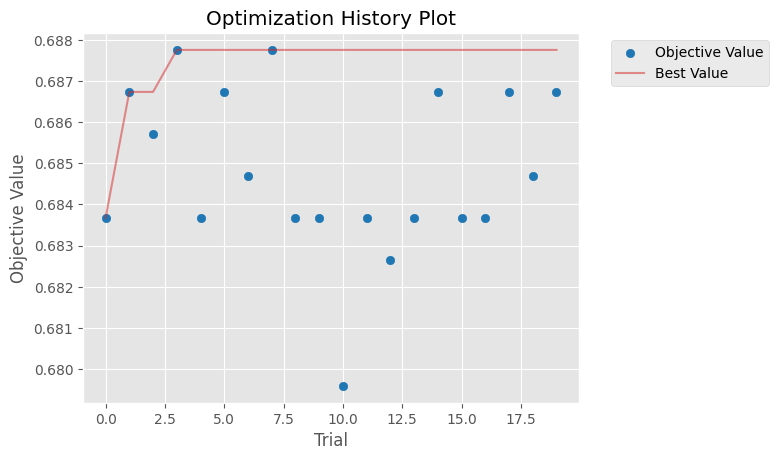

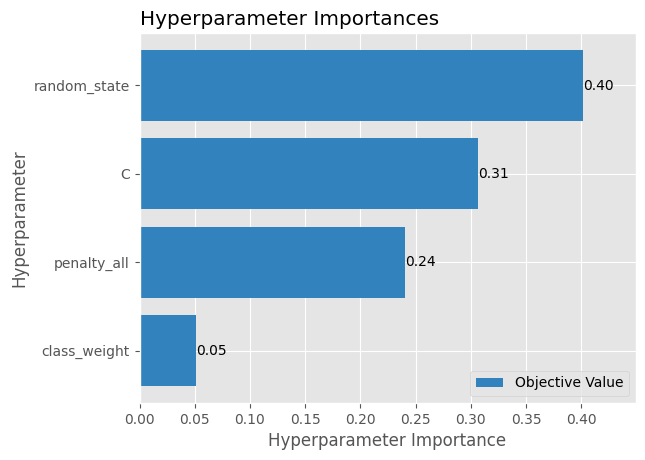

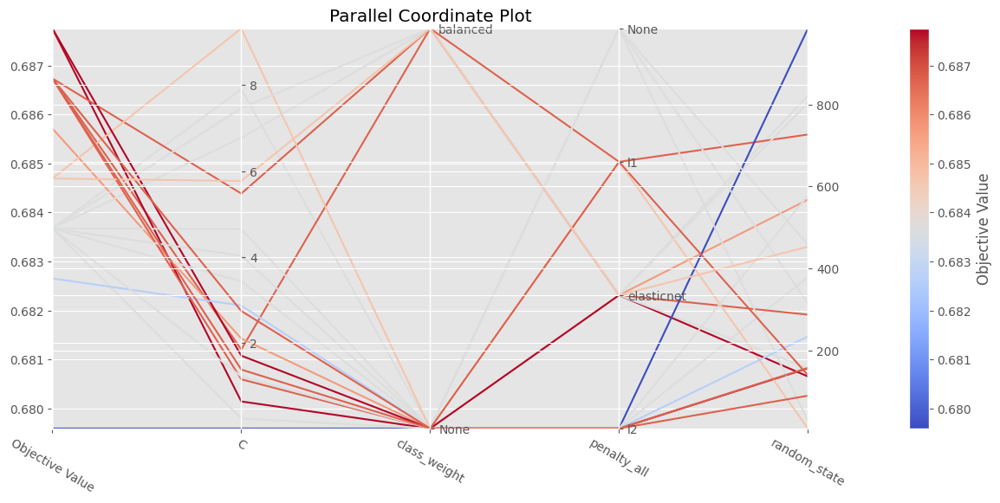

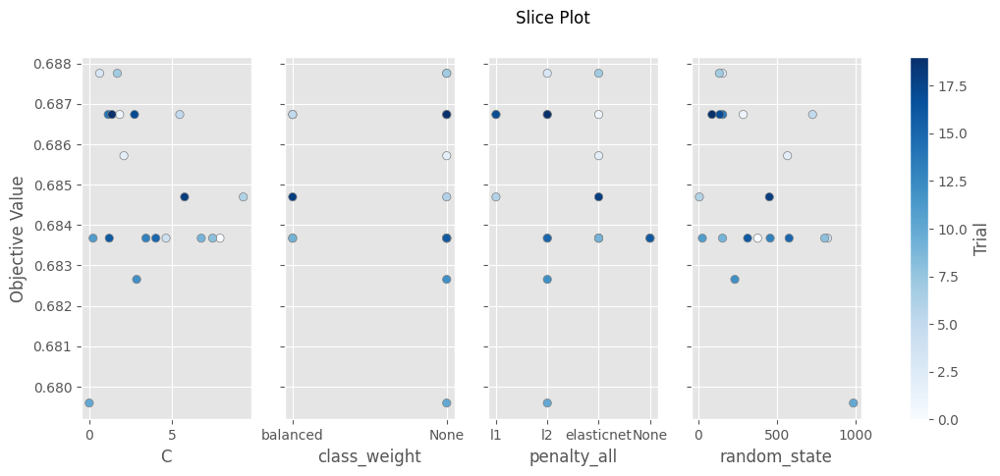

In [221]:
lr_model = LogisticRegression(max_iter=1000)
sp_params = {'solver':'saga','class_weight':None}
res = run_optuna('LogisticRegression',lr_model,n_trials=20,rs=650,apply_LDA=False,apply_smote=True,sp_params=sp_params)
visualize_tuning(res['study'])

### **Random Forest Classifier**

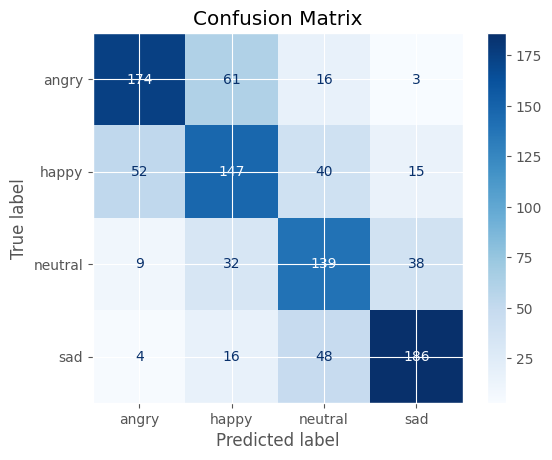


Random Forest Accuracy: 65.918%
              precision    recall  f1-score   support

       angry       0.73      0.69      0.71       254
       happy       0.57      0.58      0.58       254
     neutral       0.57      0.64      0.60       218
         sad       0.77      0.73      0.75       254

    accuracy                           0.66       980
   macro avg       0.66      0.66      0.66       980
weighted avg       0.66      0.66      0.66       980



In [223]:
rf_model = RandomForestClassifier(n_estimators=400,random_state=42)
acc_rf = preprocess_split_train_test(df,rf_model,'Random Forest',rs=650)

Total Time taken = 6 min 6 sec

Current Accuracy = 62.65%
Best Accuracy = 68.37% at iter=7
Best Model Params Found so far = {'n_estimators': 596, 'max_depth': 19, 'min_samples_split': 19, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True, 'class_weight': 'balanced', 'random_state': 660}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': True, 'apply_LDA': False}

Hyperparameter Tuning Done!


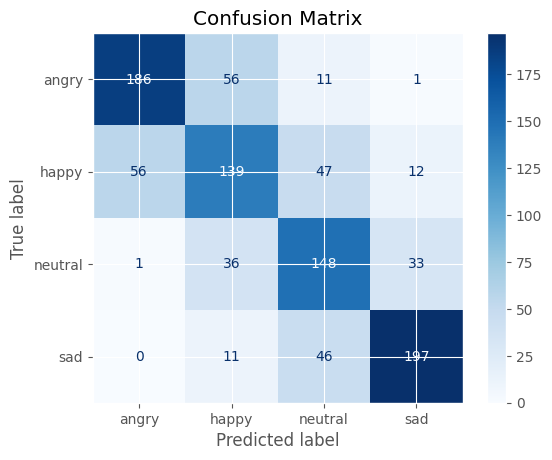


RandomForest Accuracy: 68.367%
              precision    recall  f1-score   support

       angry       0.77      0.73      0.75       254
       happy       0.57      0.55      0.56       254
     neutral       0.59      0.68      0.63       218
         sad       0.81      0.78      0.79       254

    accuracy                           0.68       980
   macro avg       0.68      0.68      0.68       980
weighted avg       0.69      0.68      0.68       980



In [239]:
rf_model = RandomForestClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('RandomForest',rf_model,iters=10,rs=650)

Trial: 19
Params: {'apply_smote': False, 'apply_LDA': False, 'n_estimators': 51, 'max_depth': 48, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': False, 'class_weight': None, 'random_state': 11}
Accuracy = 68.27%

Best so far :
 Trial: 17
Params: {'apply_smote': False, 'apply_LDA': False, 'n_estimators': 83, 'max_depth': 48, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': False, 'class_weight': None, 'random_state': 486}
Accuracy = 68.57%


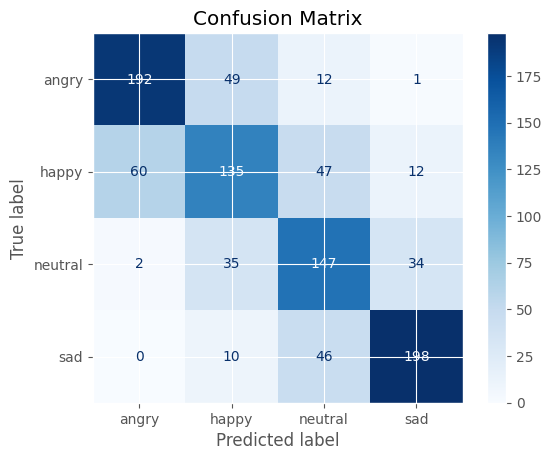


RandomForest Accuracy: 68.571%
              precision    recall  f1-score   support

       angry       0.76      0.76      0.76       254
       happy       0.59      0.53      0.56       254
     neutral       0.58      0.67      0.63       218
         sad       0.81      0.78      0.79       254

    accuracy                           0.69       980
   macro avg       0.68      0.69      0.68       980
weighted avg       0.69      0.69      0.69       980


Time taken = 3 min 32 sec



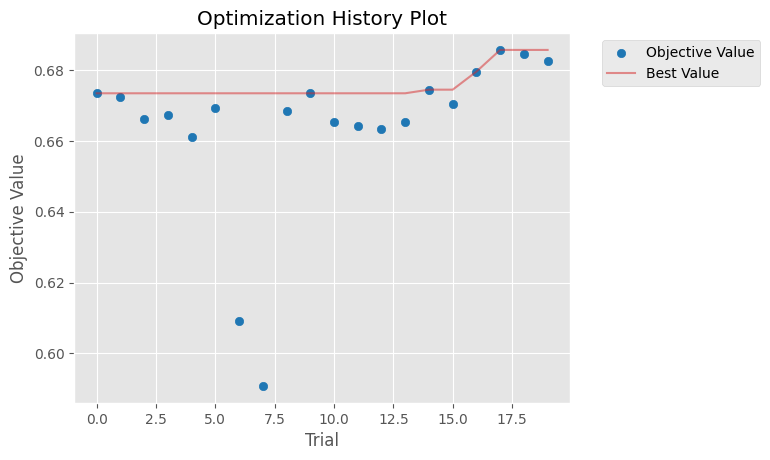

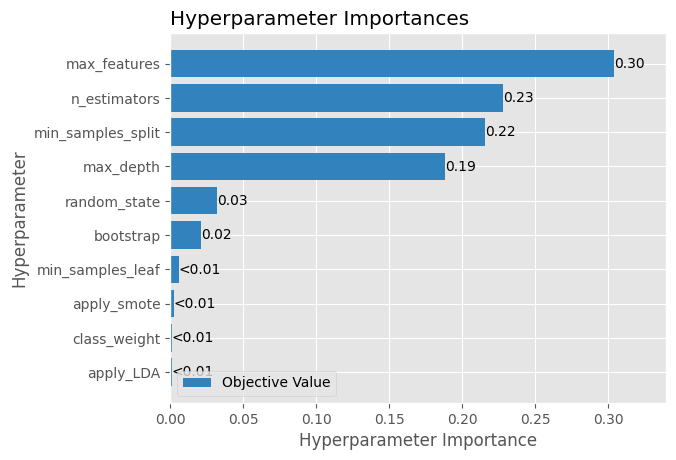

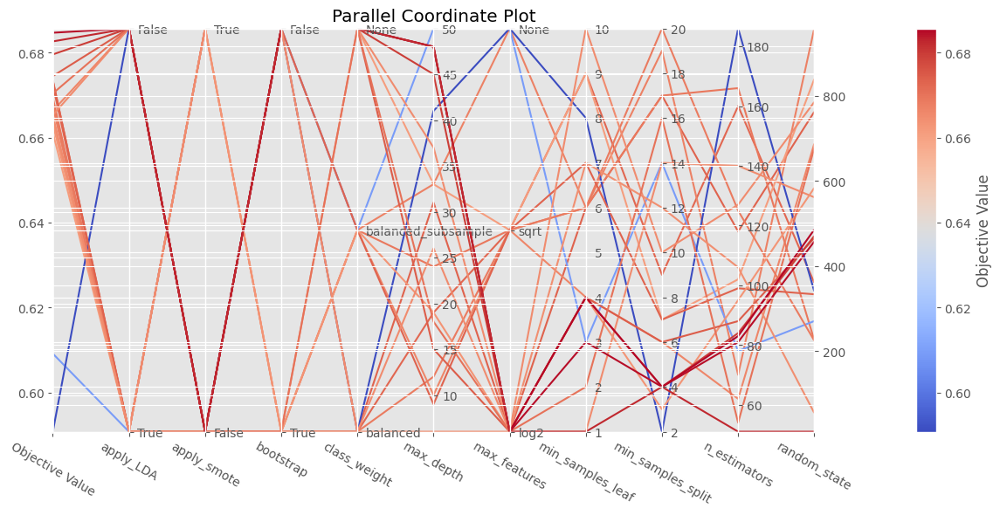

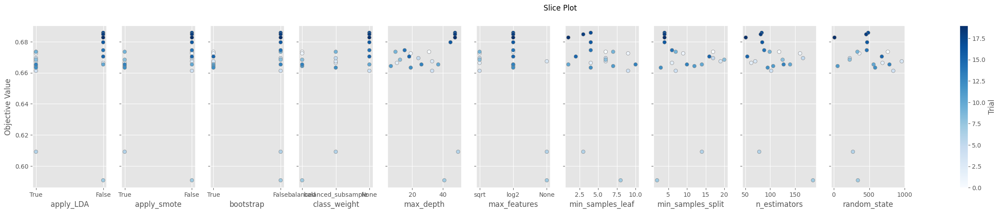

In [231]:
rf_model = RandomForestClassifier()
sp_params = {'n_estimators':(50,200)}
res = run_optuna('RandomForest',rf_model,n_trials=20,rs=650,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 49
Params: {'apply_smote': False, 'apply_LDA': False, 'n_estimators': 107, 'max_depth': 49, 'min_samples_split': 3, 'min_samples_leaf': 5, 'bootstrap': False, 'class_weight': 'balanced', 'random_state': 227}
Accuracy = 67.35%

Best so far :
 Trial: 19
Params: {'apply_smote': False, 'apply_LDA': False, 'n_estimators': 197, 'max_depth': 49, 'min_samples_split': 4, 'min_samples_leaf': 6, 'bootstrap': False, 'class_weight': 'balanced', 'random_state': 116}
Accuracy = 69.18%


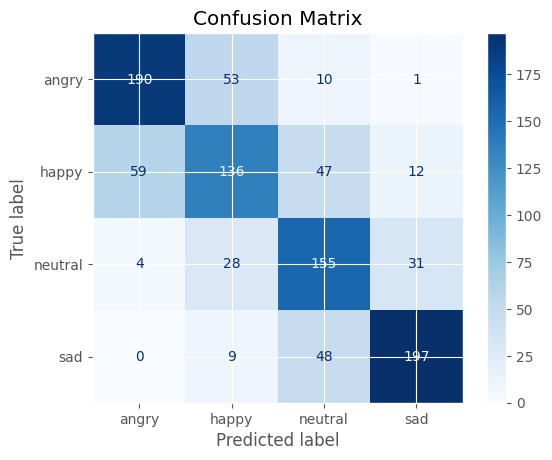


RandomForest Accuracy: 69.184%
              precision    recall  f1-score   support

       angry       0.75      0.75      0.75       254
       happy       0.60      0.54      0.57       254
     neutral       0.60      0.71      0.65       218
         sad       0.82      0.78      0.80       254

    accuracy                           0.69       980
   macro avg       0.69      0.69      0.69       980
weighted avg       0.70      0.69      0.69       980


Time taken = 3 min 53 sec



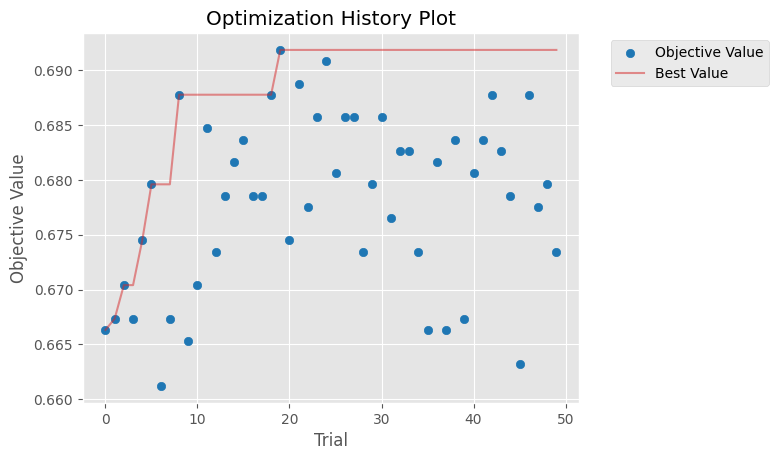

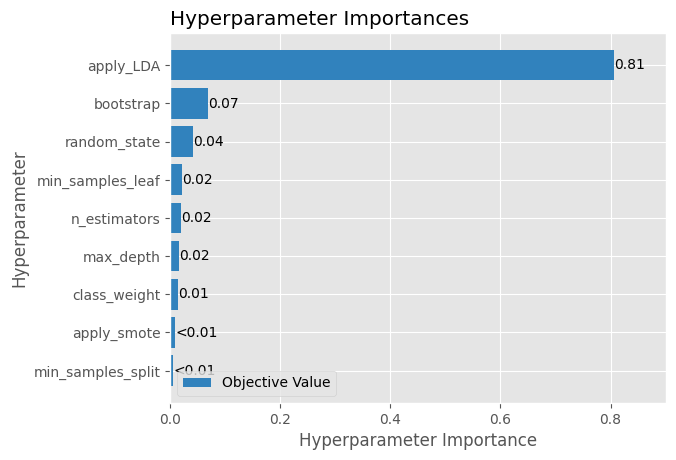

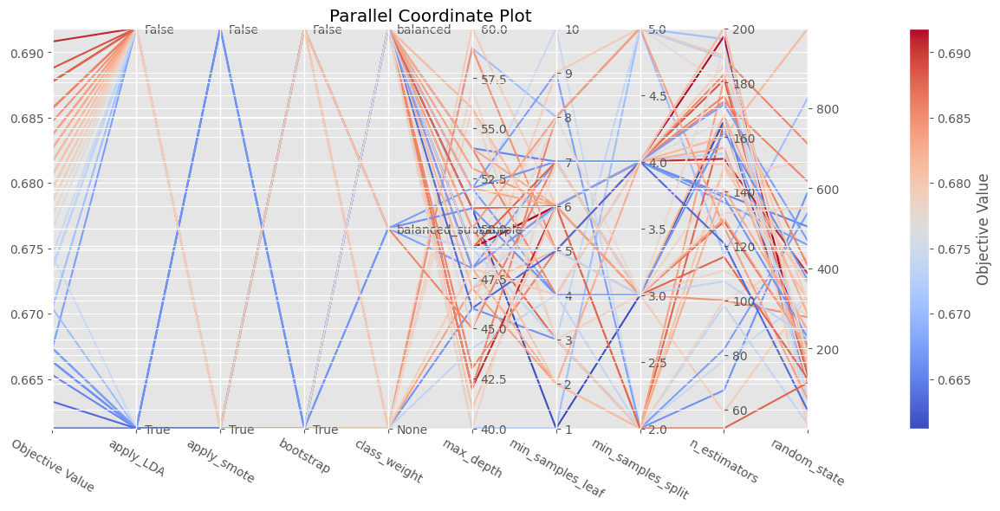

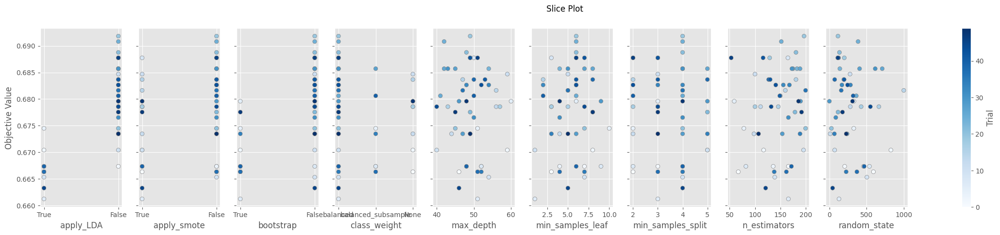

In [233]:
rf_model = RandomForestClassifier()
sp_params = {'n_estimators':(50,200),'max_features':'log2','min_samples_split':(2,5),'max_depth':(40,60)}
res = run_optuna('RandomForest',rf_model,n_trials=50,rs=650,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 49
Params: {'apply_smote': True, 'n_estimators': 161, 'max_depth': 43, 'min_samples_split': 2, 'min_samples_leaf': 1, 'class_weight': 'balanced_subsample', 'random_state': 953}
Accuracy = 67.86%

Best so far :
 Trial: 0
Params: {'apply_smote': True, 'n_estimators': 116, 'max_depth': 44, 'min_samples_split': 2, 'min_samples_leaf': 1, 'class_weight': None, 'random_state': 114}
Accuracy = 69.59%


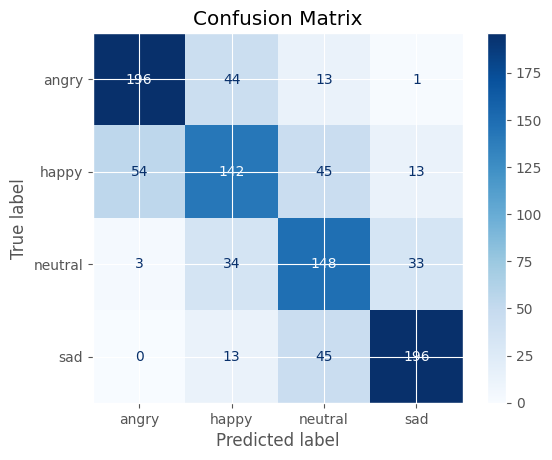


RandomForest Accuracy: 69.592%
              precision    recall  f1-score   support

       angry       0.77      0.77      0.77       254
       happy       0.61      0.56      0.58       254
     neutral       0.59      0.68      0.63       218
         sad       0.81      0.77      0.79       254

    accuracy                           0.70       980
   macro avg       0.70      0.70      0.69       980
weighted avg       0.70      0.70      0.70       980


Time taken = 6 min 29 sec



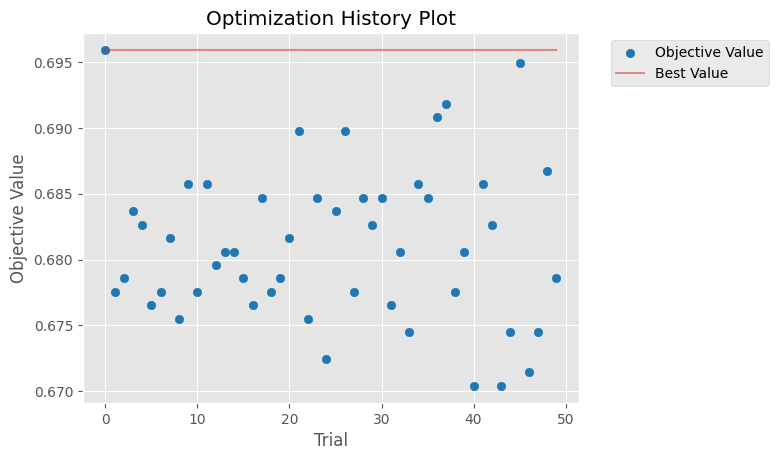

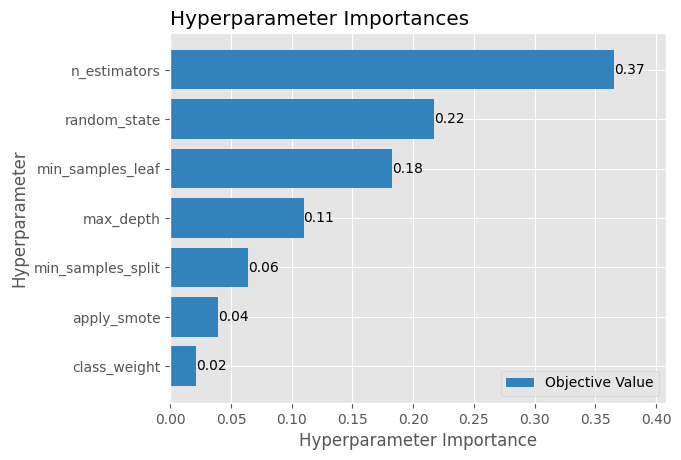

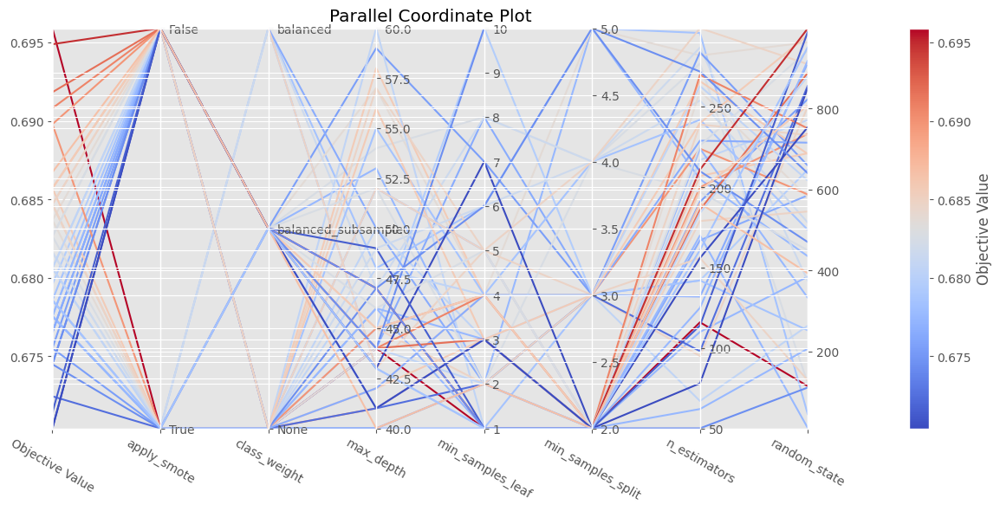

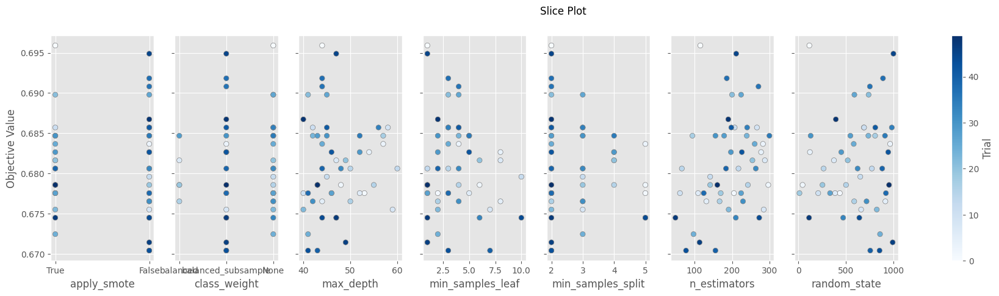

In [235]:
rf_model = RandomForestClassifier()
sp_params = {'n_estimators':(50,300),'max_features':'log2','min_samples_split':(2,5),'max_depth':(40,60),
            'bootstrap':False}
res = run_optuna('RandomForest',rf_model,n_trials=50,rs=650,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 49
Params: {'apply_smote': True, 'n_estimators': 85, 'max_depth': 58, 'min_samples_split': 2, 'min_samples_leaf': 1, 'class_weight': 'balanced_subsample', 'random_state': 608}
Accuracy = 67.76%

Best so far :
 Trial: 36
Params: {'apply_smote': False, 'n_estimators': 190, 'max_depth': 52, 'min_samples_split': 5, 'min_samples_leaf': 1, 'class_weight': None, 'random_state': 917}
Accuracy = 69.69%


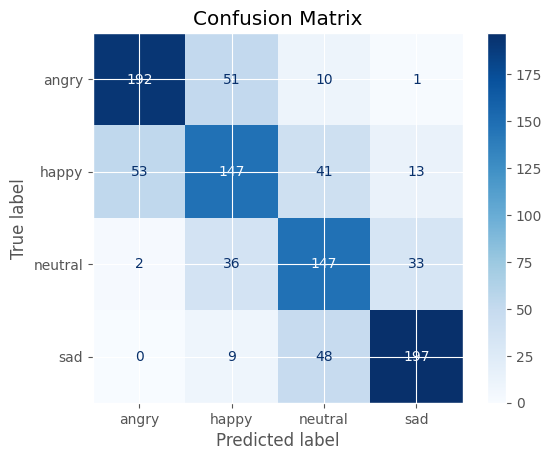


RandomForest Accuracy: 69.694%
              precision    recall  f1-score   support

       angry       0.78      0.76      0.77       254
       happy       0.60      0.58      0.59       254
     neutral       0.60      0.67      0.63       218
         sad       0.81      0.78      0.79       254

    accuracy                           0.70       980
   macro avg       0.70      0.70      0.70       980
weighted avg       0.70      0.70      0.70       980


Time taken = 7 min 6 sec



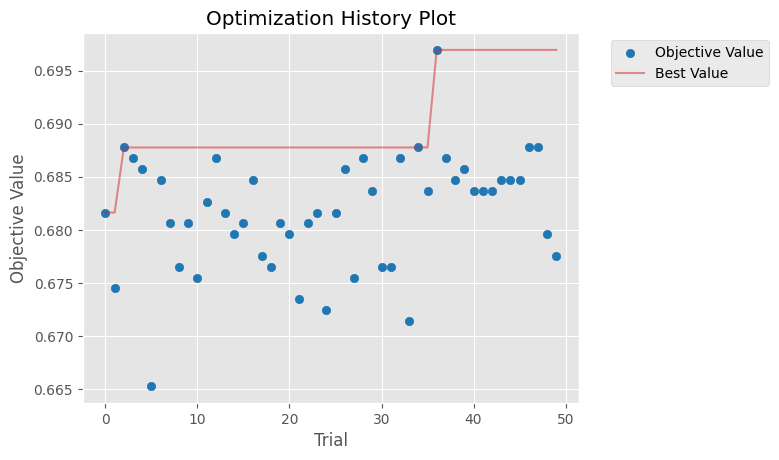

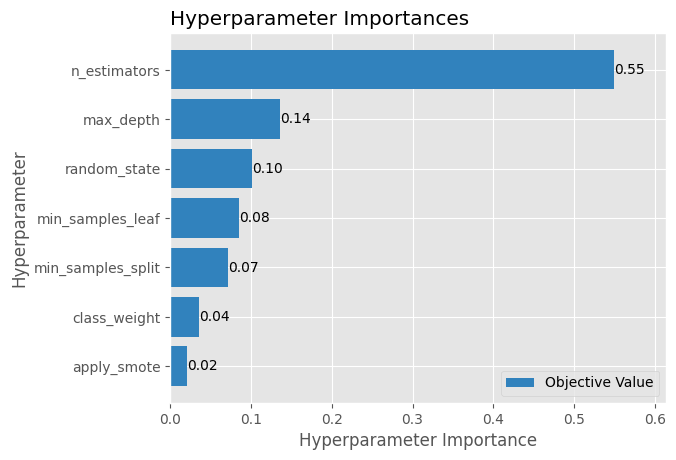

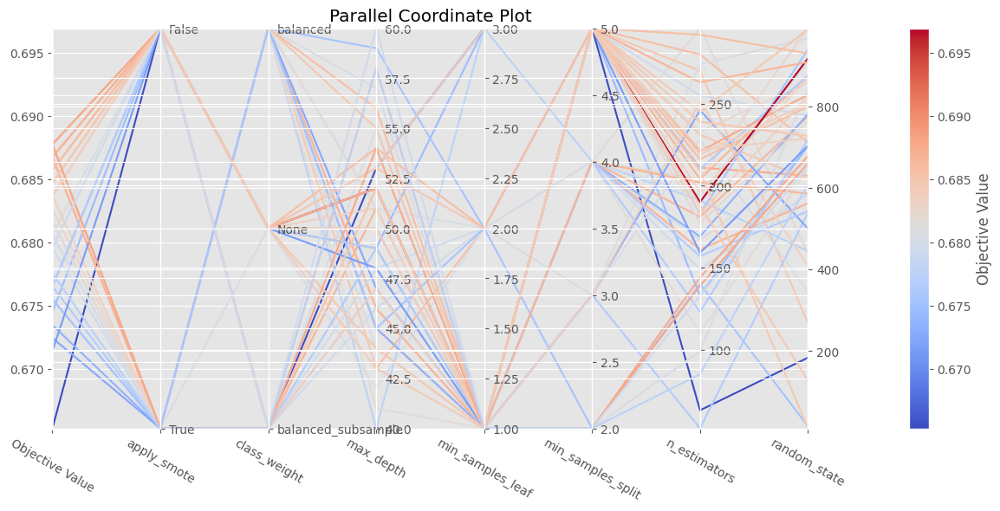

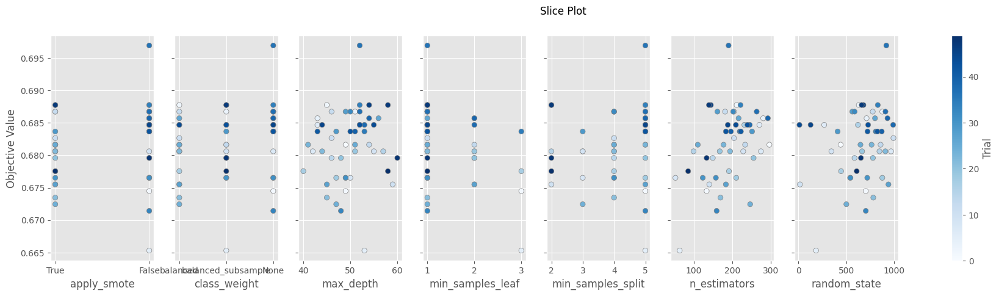

In [236]:
rf_model = RandomForestClassifier()
sp_params = {'n_estimators':(50,300),'max_features':'log2','min_samples_split':(2,5),'max_depth':(40,60),
            'bootstrap':False,'min_samples_leaf':(1,3)}
res = run_optuna('RandomForest',rf_model,n_trials=50,rs=650,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

### **Extreme Gradient Boosting Classifier (XGBoost)**

Total Time taken = 2 min 35 sec

Current Accuracy = 71.63%
Best Accuracy = 72.24% at iter=19
Best Model Params Found so far = {'learning_rate': 0.10804458428871415, 'n_estimators': 199, 'max_depth': 17, 'min_child_weight': 3, 'gamma': 0.736193950978941, 'subsample': 0.6128388714218251, 'colsample_bytree': 0.8562853334756023, 'reg_alpha': 0.6258734464885625, 'reg_lambda': 0.20429711639814918, 'scale_pos_weight': 3.223816388526603, 'random_state': 911}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': True, 'apply_LDA': False}

Hyperparameter Tuning Done!


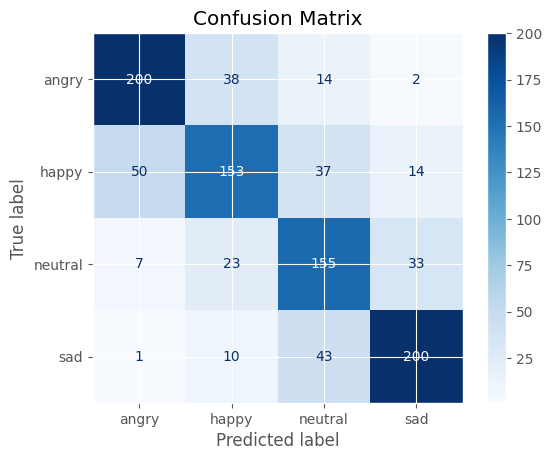


XGBoost Accuracy: 72.245%
              precision    recall  f1-score   support

           0       0.78      0.79      0.78       254
           1       0.68      0.60      0.64       254
           2       0.62      0.71      0.66       218
           3       0.80      0.79      0.80       254

    accuracy                           0.72       980
   macro avg       0.72      0.72      0.72       980
weighted avg       0.72      0.72      0.72       980



In [252]:
xgb_model = XGBClassifier(device='cuda')
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('XGBoost',xgb_model,iters=100,rs=650)

Trial: 99
Params: {'apply_smote': False, 'learning_rate': 0.2880833581411021, 'n_estimators': 124, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.05989704286931677, 'subsample': 0.677878749233465, 'colsample_bytree': 0.82396324102818, 'reg_alpha': 0.3277004886872534, 'reg_lambda': 0.05279773920308471, 'scale_pos_weight': 1.8986235534905844, 'random_state': 192}
Accuracy = 71.02%

Best so far :
 Trial: 96
Params: {'apply_smote': False, 'learning_rate': 0.25021076267540254, 'n_estimators': 199, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 0.0220662004233658, 'subsample': 0.6249431426697384, 'colsample_bytree': 0.775923977956102, 'reg_alpha': 0.3252344817033667, 'reg_lambda': 0.08995647155681165, 'scale_pos_weight': 1.9109827198527594, 'random_state': 190}
Accuracy = 72.55%


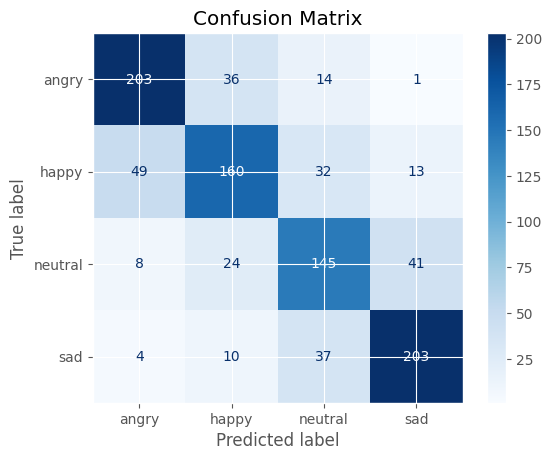


XGBoost Accuracy: 72.551%
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       254
           1       0.70      0.63      0.66       254
           2       0.64      0.67      0.65       218
           3       0.79      0.80      0.79       254

    accuracy                           0.73       980
   macro avg       0.72      0.72      0.72       980
weighted avg       0.72      0.73      0.72       980


Time taken = 3 min 44 sec



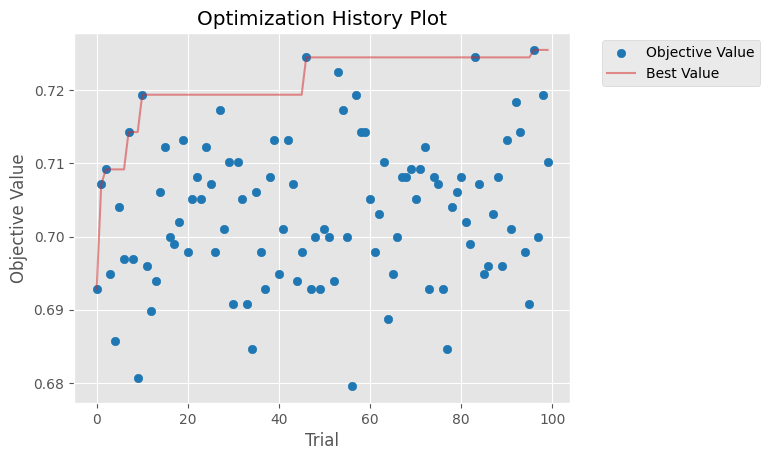

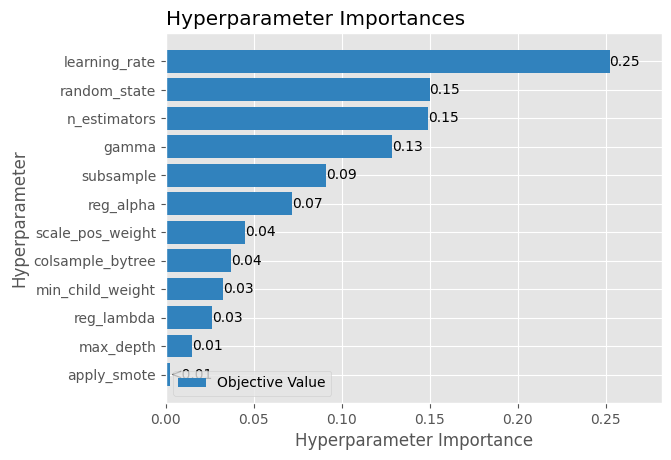

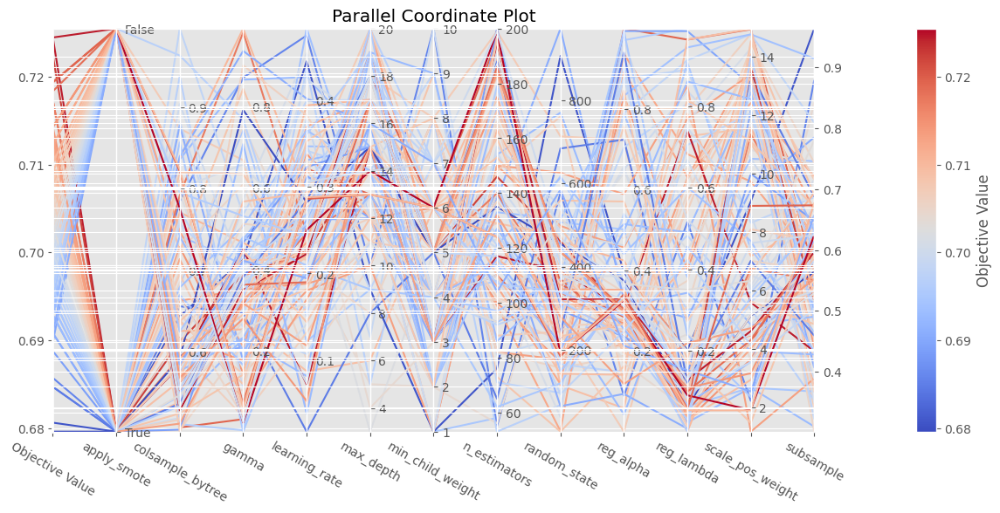

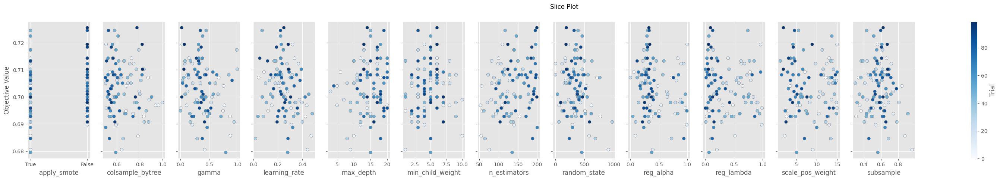

In [245]:
xgb_model = XGBClassifier(device='cuda')
res = run_optuna('XGBoost',xgb_model,n_trials=100,rs=650,apply_LDA=False)
visualize_tuning(res['study'])

Trial: 99
Params: {'apply_smote': True, 'learning_rate': 0.06426280504338486, 'n_estimators': 248, 'max_depth': 5, 'min_child_weight': 10, 'gamma': 0.39300634145844093, 'subsample': 0.6470368426914576, 'colsample_bytree': 0.702945466537762, 'reg_alpha': 0.5128164738924051, 'reg_lambda': 0.35124558560068037, 'scale_pos_weight': 8.993112846821973, 'random_state': 701}
Accuracy = 71.53%

Best so far :
 Trial: 88
Params: {'apply_smote': True, 'learning_rate': 0.05515372898639964, 'n_estimators': 251, 'max_depth': 6, 'min_child_weight': 9, 'gamma': 0.34497341048992414, 'subsample': 0.4663861700623359, 'colsample_bytree': 0.723186581174249, 'reg_alpha': 0.3814547447664233, 'reg_lambda': 0.3809619102874534, 'scale_pos_weight': 9.42023012347002, 'random_state': 545}
Accuracy = 73.37%


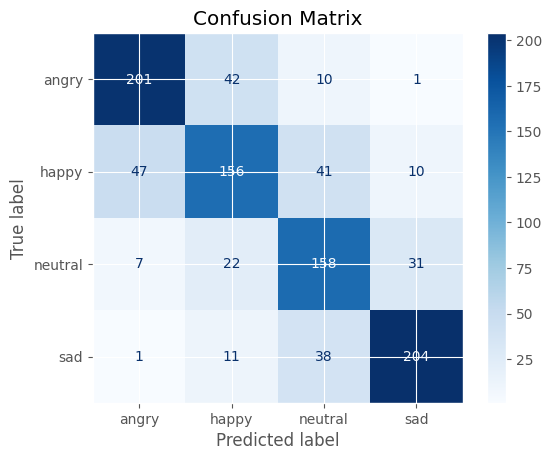


XGBoost Accuracy: 73.367%
              precision    recall  f1-score   support

           0       0.79      0.79      0.79       254
           1       0.68      0.61      0.64       254
           2       0.64      0.72      0.68       218
           3       0.83      0.80      0.82       254

    accuracy                           0.73       980
   macro avg       0.73      0.73      0.73       980
weighted avg       0.74      0.73      0.73       980


Time taken = 5 min 33 sec



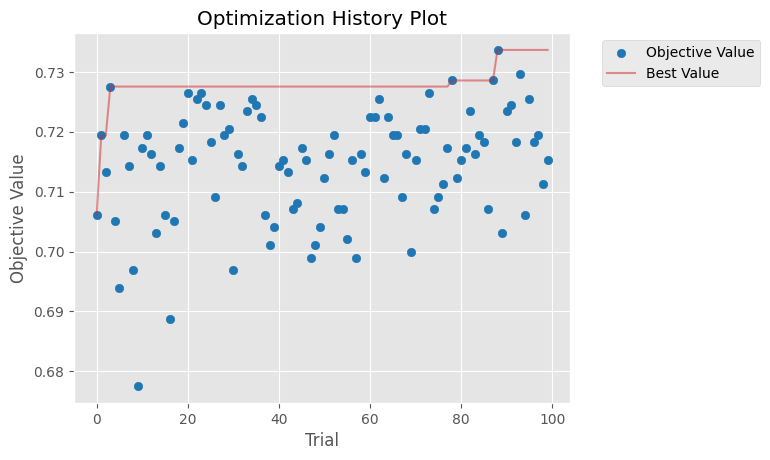

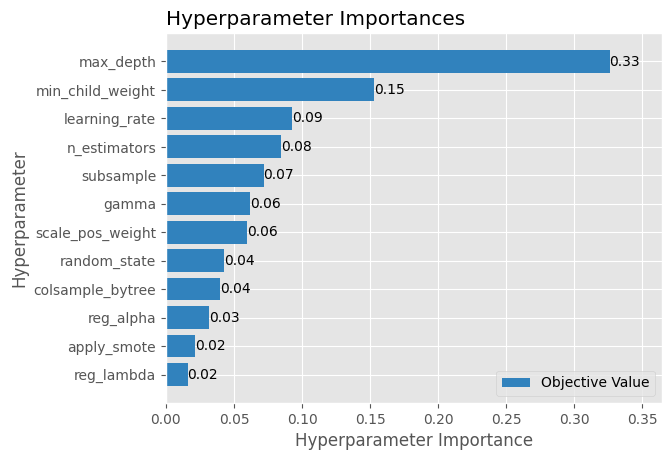

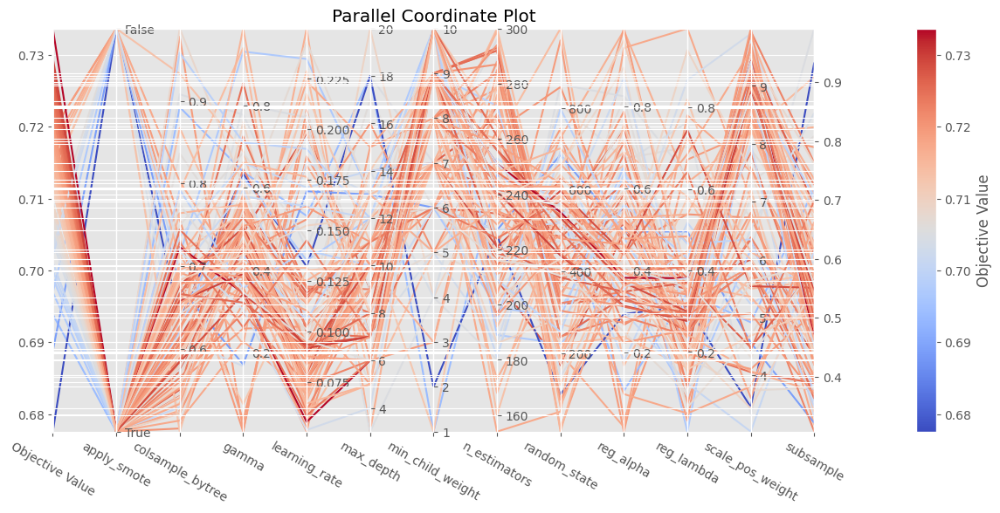

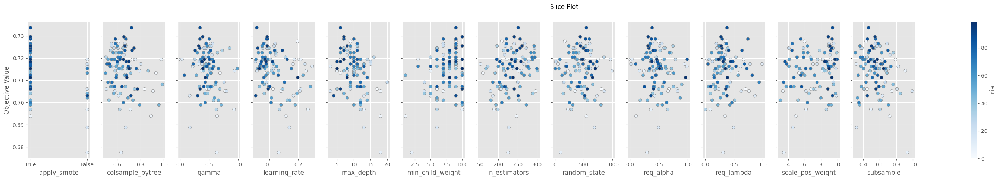

In [247]:
xgb_model = XGBClassifier(device='cuda')
sp_params = {'learning_rate':(0.05,0.25),'n_estimators':(150,300),'scale_pos_weight':(3,10)}
res = run_optuna('XGBoost',xgb_model,n_trials=100,rs=650,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 99
Params: {'learning_rate': 0.2189543011276003, 'n_estimators': 290, 'max_depth': 8, 'min_child_weight': 7, 'gamma': 0.29512973187664593, 'subsample': 0.5127194761900403, 'colsample_bytree': 0.560956920636865, 'reg_alpha': 0.7476451303069388, 'reg_lambda': 0.57001973897245, 'scale_pos_weight': 8.712756540973876, 'random_state': 744}
Accuracy = 70.41%

Best so far :
 Trial: 86
Params: {'learning_rate': 0.08070599648010639, 'n_estimators': 321, 'max_depth': 7, 'min_child_weight': 7, 'gamma': 0.3640422029929913, 'subsample': 0.4481739557402842, 'colsample_bytree': 0.6395939403870143, 'reg_alpha': 0.6923329335789964, 'reg_lambda': 0.5587662289939355, 'scale_pos_weight': 8.685257765622595, 'random_state': 898}
Accuracy = 73.78%


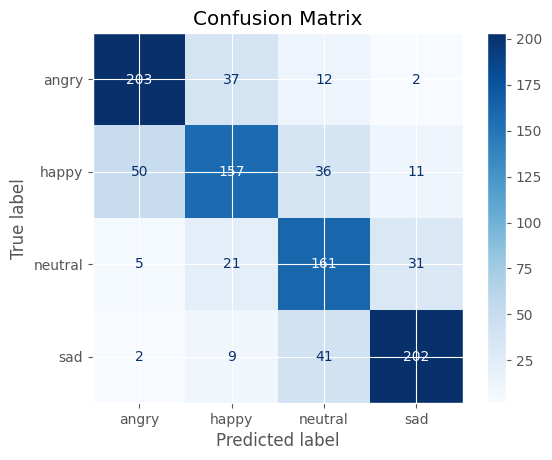


XGBoost Accuracy: 73.776%
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       254
           1       0.70      0.62      0.66       254
           2       0.64      0.74      0.69       218
           3       0.82      0.80      0.81       254

    accuracy                           0.74       980
   macro avg       0.74      0.74      0.74       980
weighted avg       0.74      0.74      0.74       980


Time taken = 5 min 54 sec



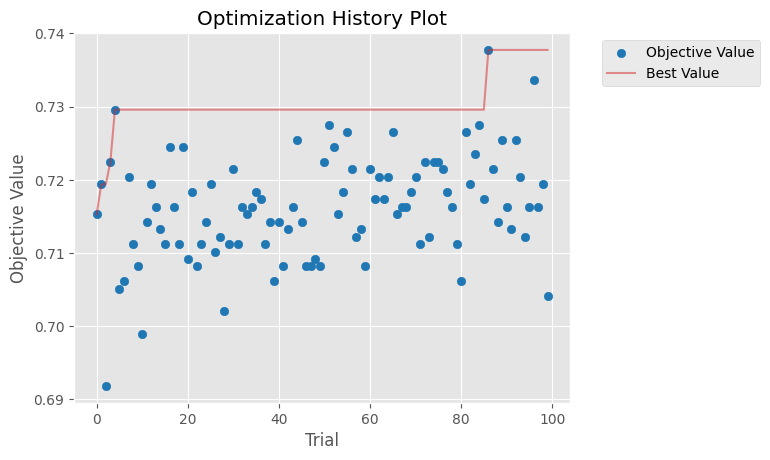

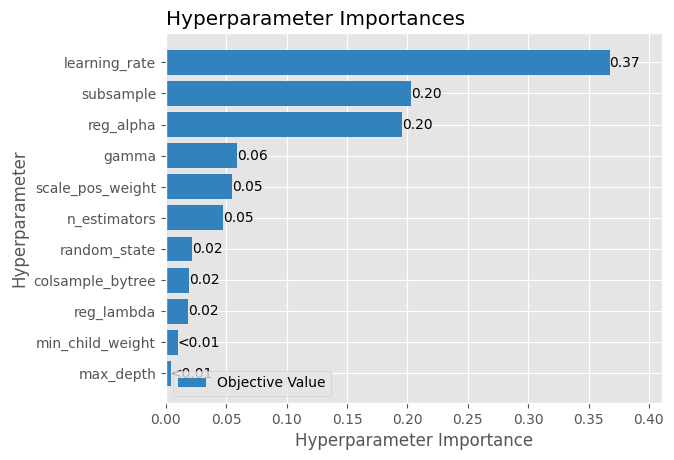

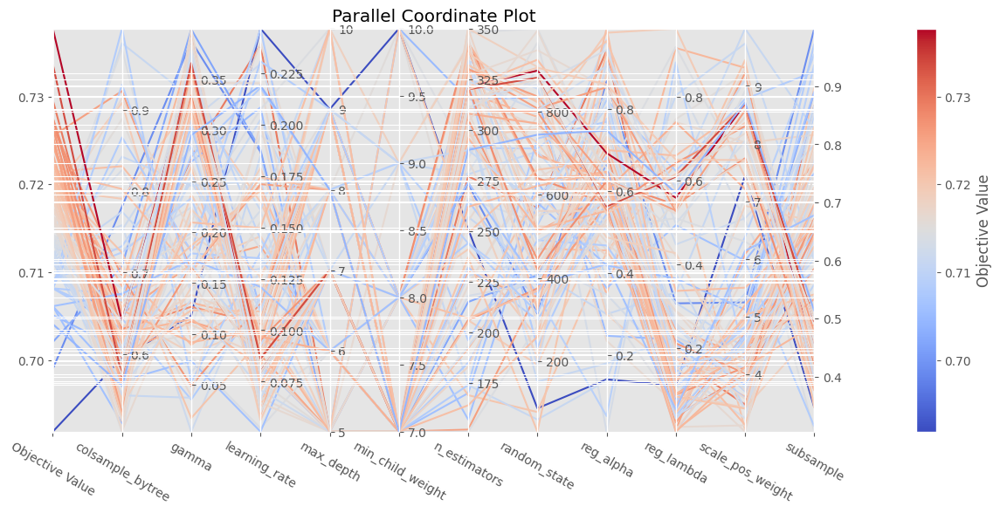

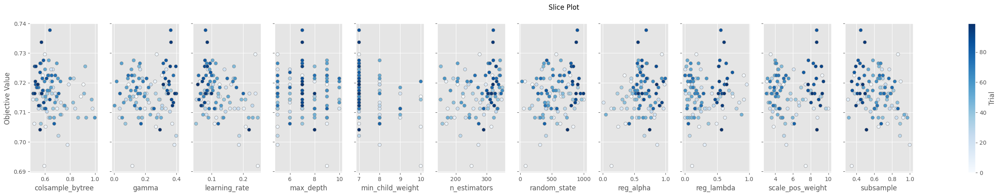

In [250]:
xgb_model = XGBClassifier(device='cuda')
sp_params = {'learning_rate':(0.05,0.25),'n_estimators':(150,350),'scale_pos_weight':(3,10),
             'max_depth':(5,10),'min_child_weight':(7,10),'gamma':(0,0.4)}
res = run_optuna('XGBoost',xgb_model,n_trials=100,rs=650,apply_LDA=False,apply_smote=True,sp_params=sp_params)
visualize_tuning(res['study'])

### **Gaussian Naive Bayes Classifier**

In [ ]:
nb_model = GaussianNB()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('NaiveBayes',nb_model,iters=100)

Total Time taken = 0 min 5 sec

Current Accuracy = 64.90%
Best Accuracy = 68.57% at iter=4
Best Model Params Found so far = {'var_smoothing': 1e-09}

Best Preprocessing Params Found so far = {'rs': 2, 'apply_smote': False, 'apply_LDA': True}

Iter No. - 40
Model Params = {'var_smoothing': 1e-09}
Preprocessing Params = {'rs': 739, 'apply_smote': True, 'apply_LDA': False}


### **Adaptive Boosting Classifier (AdaBoost)**

Total Time taken = 19 min 38 sec

Current Accuracy = 61.22%
Best Accuracy = 61.22% at iter=19
Best Model Params Found so far = {'n_estimators': 95, 'learning_rate': 1.1964128085928971, 'random_state': 48}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': True, 'apply_LDA': False}

Hyperparameter Tuning Done!


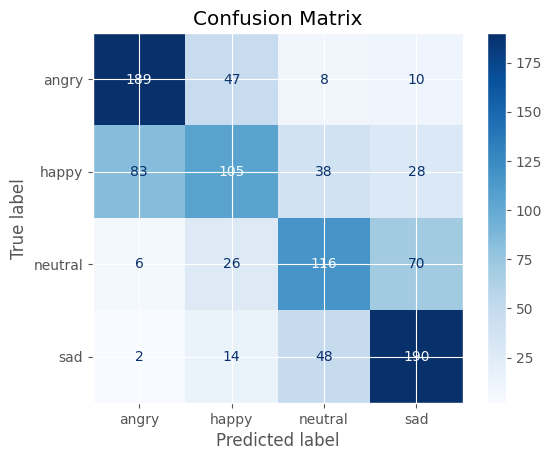


AdaBoost Accuracy: 61.224%
              precision    recall  f1-score   support

       angry       0.68      0.74      0.71       254
       happy       0.55      0.41      0.47       254
     neutral       0.55      0.53      0.54       218
         sad       0.64      0.75      0.69       254

    accuracy                           0.61       980
   macro avg       0.60      0.61      0.60       980
weighted avg       0.60      0.61      0.60       980



In [257]:
blr_model = LogisticRegression(**{'C': 0.6419359167687596, 'solver':'saga','class_weight': None, 'penalty': 'l2',
                                  'random_state': 156})
ab_model = AdaBoostClassifier(estimator=blr_model)
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('AdaBoost',ab_model,iters=20,
                                                                 **{'rs': 650, 'apply_smote': True, 'apply_LDA': False})

Trial: 19
Params: {'n_estimators': 81, 'learning_rate': 0.05337906796692417, 'random_state': 829}
Accuracy = 60.31%

Best so far :
 Trial: 12
Params: {'n_estimators': 61, 'learning_rate': 0.033218122967982704, 'random_state': 724}
Accuracy = 61.02%


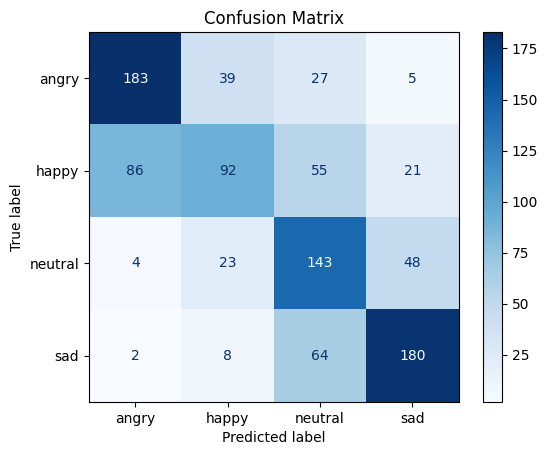


AdaBoost Accuracy: 61.020%
              precision    recall  f1-score   support

       angry       0.67      0.72      0.69       254
       happy       0.57      0.36      0.44       254
     neutral       0.49      0.66      0.56       218
         sad       0.71      0.71      0.71       254

    accuracy                           0.61       980
   macro avg       0.61      0.61      0.60       980
weighted avg       0.61      0.61      0.60       980


Time taken = 38 min 51 sec



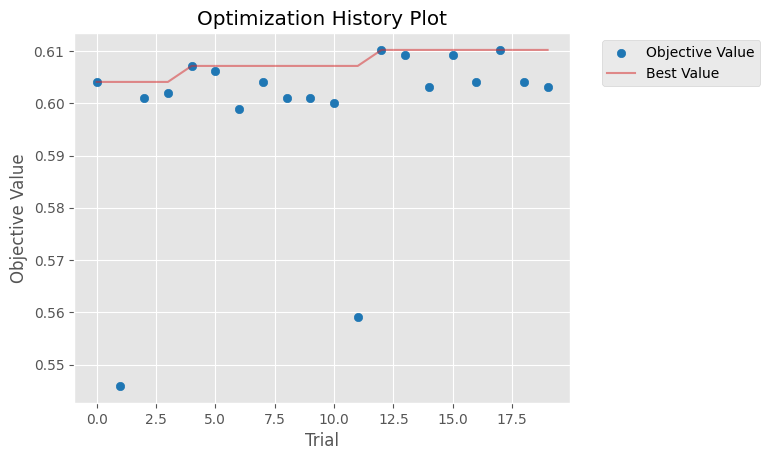

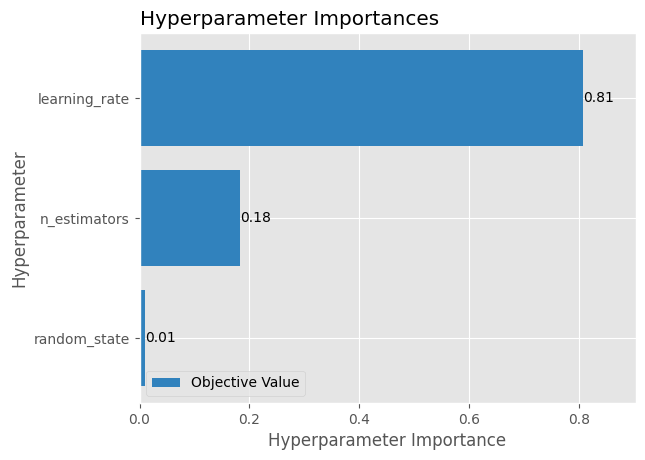

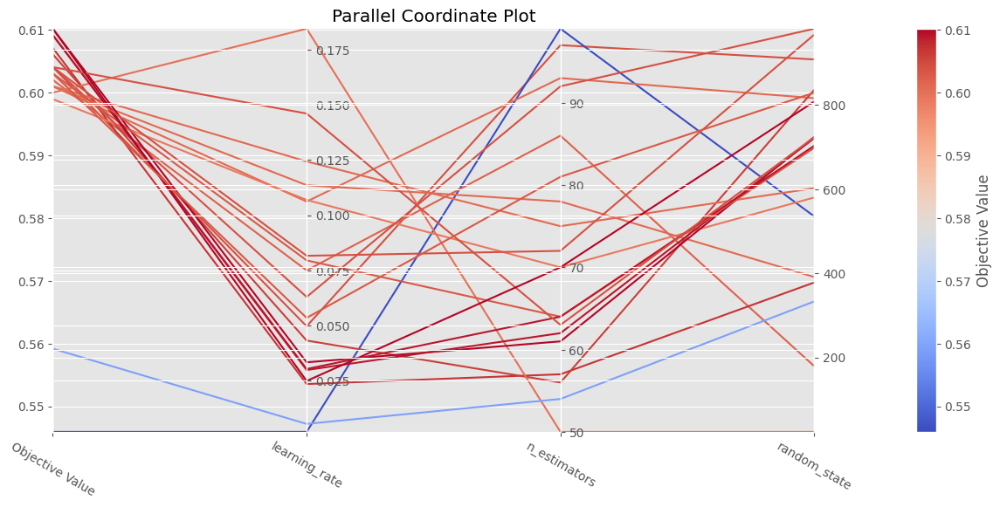

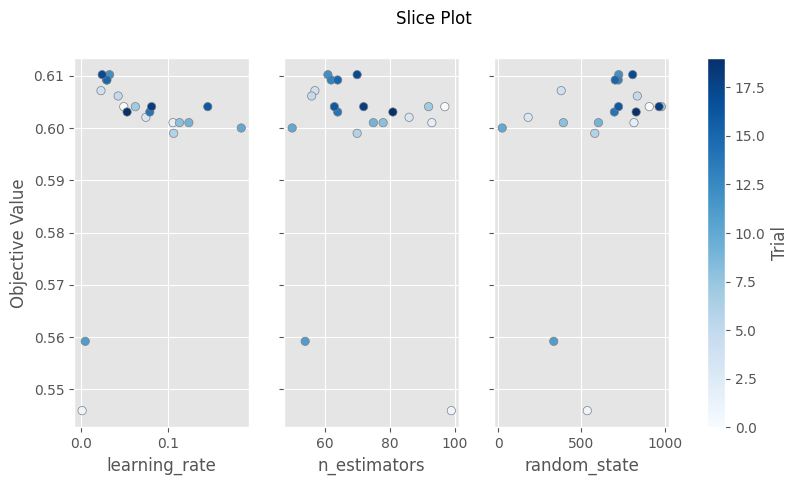

In [12]:
blr_model = LogisticRegression(**{'C': 0.6419359167687596, 'solver':'saga','class_weight': None, 'penalty': 'l2',
                                  'random_state': 156})
ab_model = AdaBoostClassifier(estimator=blr_model)
res = run_optuna('AdaBoost',ab_model,n_trials=20,rs=650,apply_LDA=False,apply_smote=True)
visualize_tuning(res['study'])

Total Time taken = 2 min 17 sec

Current Accuracy = 63.37%
Best Accuracy = 65.92% at iter=4
Best Model Params Found so far = {'n_estimators': 62, 'learning_rate': 1.8905343517549864, 'random_state': 695}

Best Preprocessing Params Found so far = {'rs': 650, 'apply_smote': False, 'apply_LDA': True}

Hyperparameter Tuning Done!


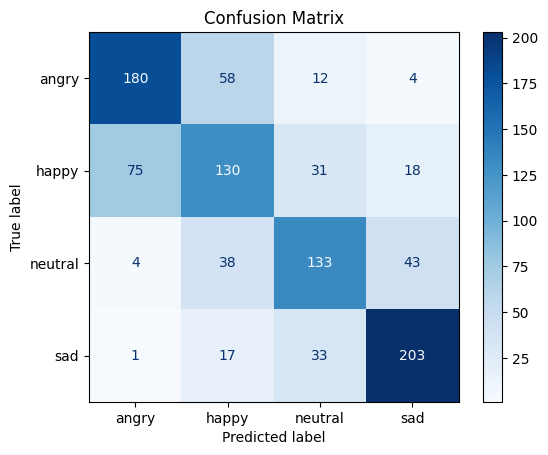


AdaBoost Accuracy: 65.918%
              precision    recall  f1-score   support

       angry       0.69      0.71      0.70       254
       happy       0.53      0.51      0.52       254
     neutral       0.64      0.61      0.62       218
         sad       0.76      0.80      0.78       254

    accuracy                           0.66       980
   macro avg       0.66      0.66      0.66       980
weighted avg       0.66      0.66      0.66       980



In [9]:
ab_model = AdaBoostClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('AdaBoost',ab_model,iters=20,rs=650)

Trial: 149
Params: {'apply_smote': False, 'apply_LDA': True, 'n_estimators': 86, 'learning_rate': 1.634233043392172, 'random_state': 447}
Accuracy = 66.94%

Best so far :
 Trial: 149
Params: {'apply_smote': False, 'apply_LDA': True, 'n_estimators': 86, 'learning_rate': 1.634233043392172, 'random_state': 447}
Accuracy = 66.94%


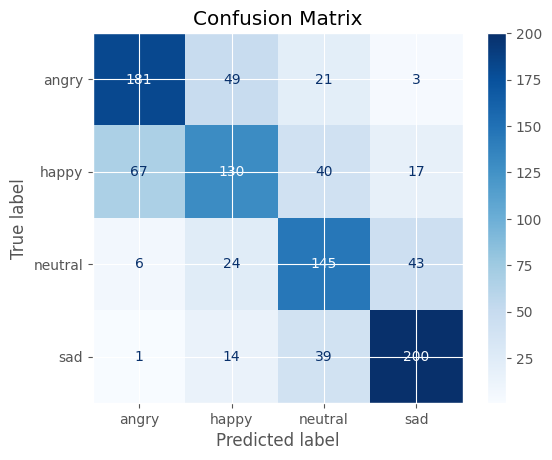


AdaBoost Accuracy: 66.939%
              precision    recall  f1-score   support

       angry       0.71      0.71      0.71       254
       happy       0.60      0.51      0.55       254
     neutral       0.59      0.67      0.63       218
         sad       0.76      0.79      0.77       254

    accuracy                           0.67       980
   macro avg       0.67      0.67      0.67       980
weighted avg       0.67      0.67      0.67       980


Time taken = 4 min 56 sec



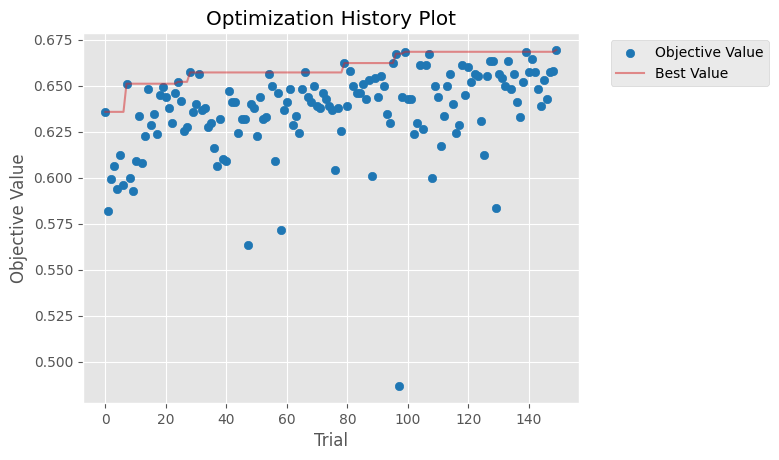

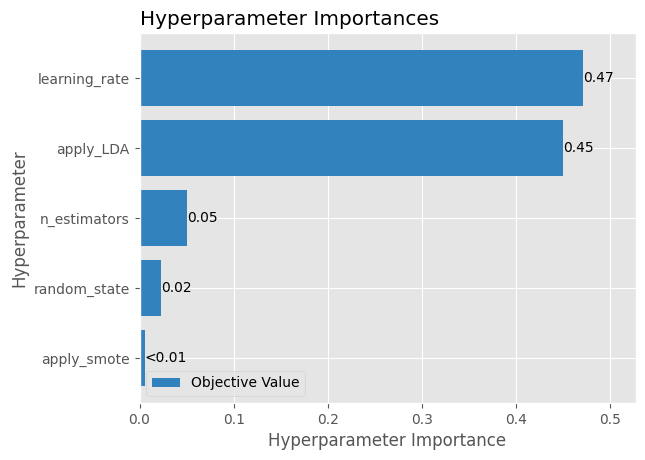

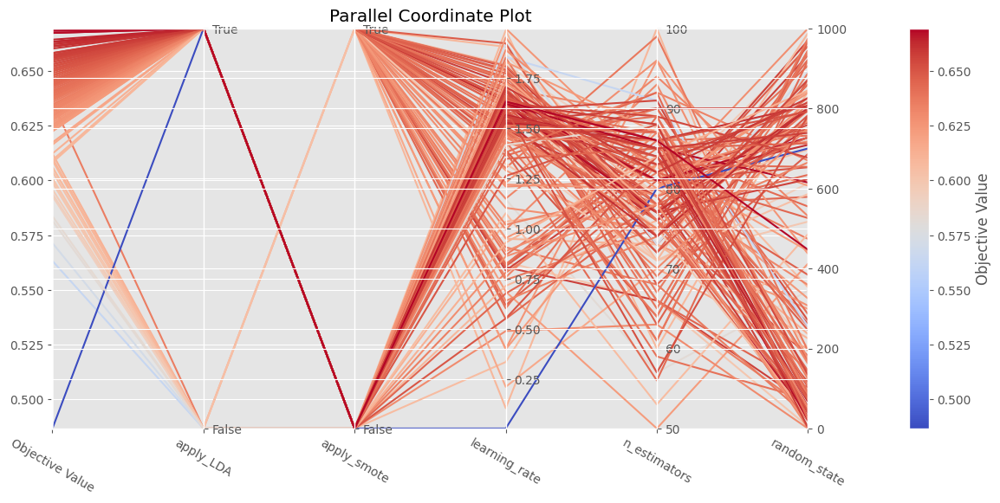

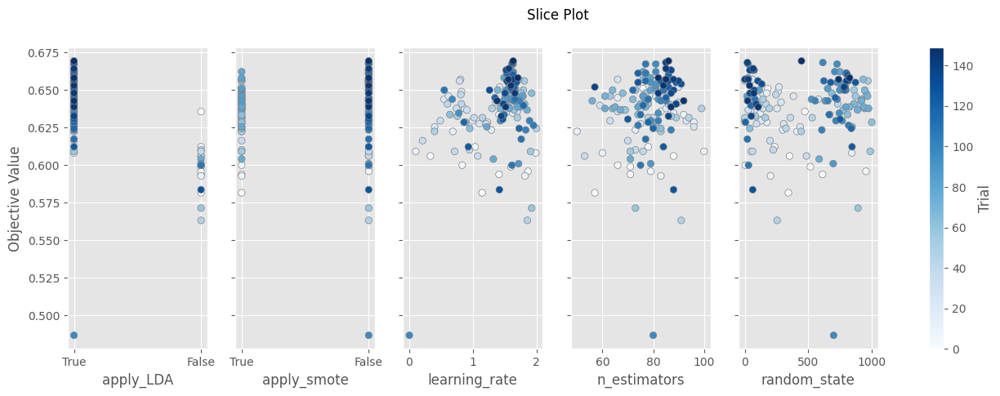

In [17]:
ab_model = AdaBoostClassifier()
res = run_optuna('AdaBoost',ab_model,n_trials=150,rs=650)
visualize_tuning(res['study'])

Trial: 249
Params: {'n_estimators': 86, 'learning_rate': 1.6386939501120201, 'random_state': 234}
Accuracy = 63.78%

Best so far :
 Trial: 147
Params: {'n_estimators': 87, 'learning_rate': 1.6345141251705997, 'random_state': 196}
Accuracy = 67.55%


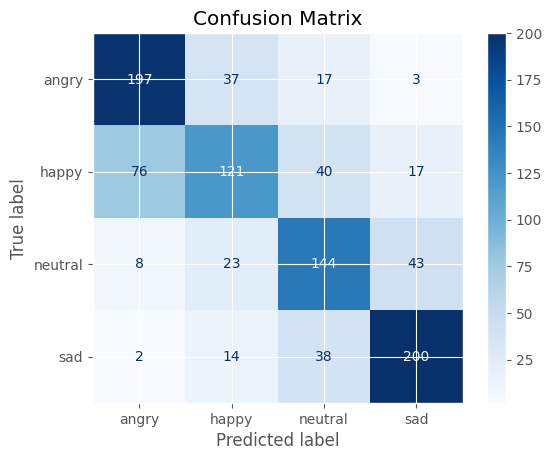


AdaBoost Accuracy: 67.551%
              precision    recall  f1-score   support

       angry       0.70      0.78      0.73       254
       happy       0.62      0.48      0.54       254
     neutral       0.60      0.66      0.63       218
         sad       0.76      0.79      0.77       254

    accuracy                           0.68       980
   macro avg       0.67      0.67      0.67       980
weighted avg       0.67      0.68      0.67       980


Time taken = 4 min 1 sec



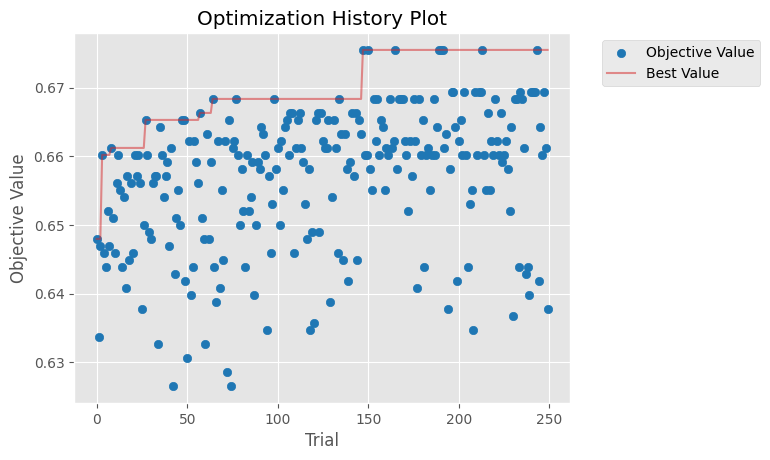

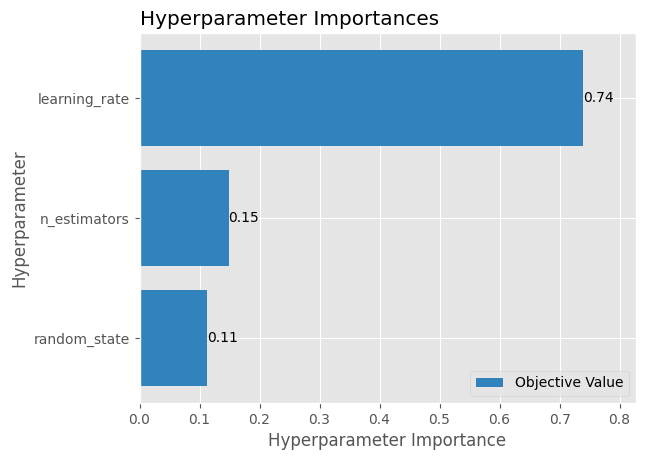

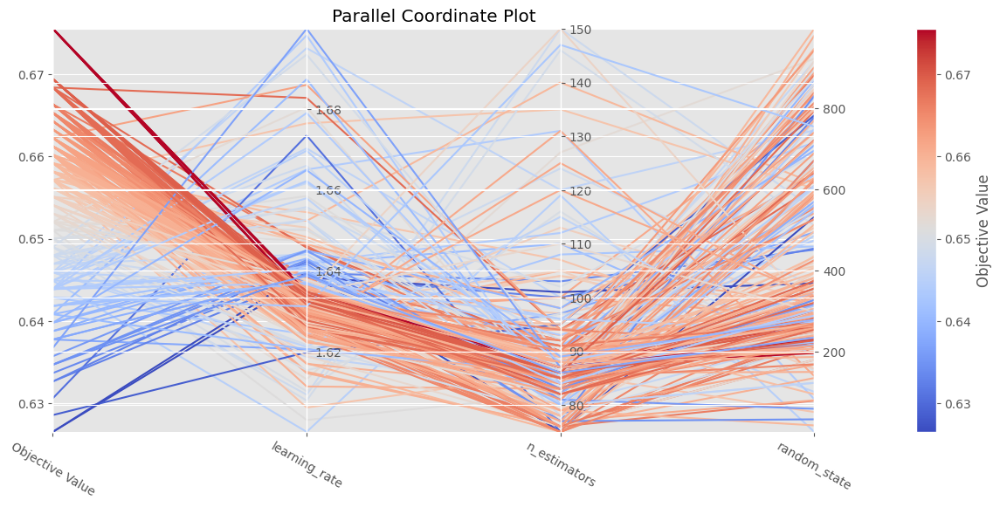

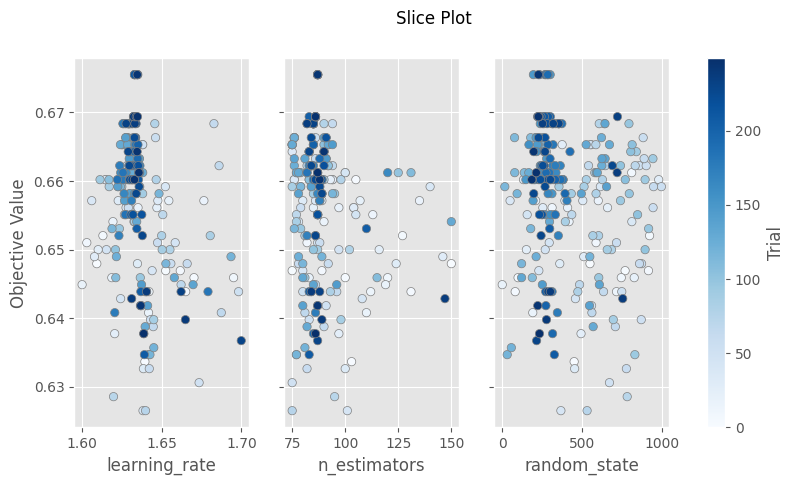

In [23]:
ab_model = AdaBoostClassifier()
sp_params = {'learning_rate':(1.6,1.7),'n_estimators':(75,150)}
res = run_optuna('AdaBoost',ab_model,n_trials=250,rs=650,apply_LDA=True,apply_smote=False,sp_params=sp_params)
visualize_tuning(res['study'])

### **Multi-Layer Perceptron Hyperparameter Tuning**

In [57]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, BatchNormalization,Input
from tensorflow.keras.optimizers import Adam,SGD,RMSprop,Adadelta,Adagrad,Adamax,Nadam
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from imblearn.over_sampling import SMOTE

In [58]:
def split_preprocess(df,apply_smote=False,rs=536,returnscalerle=False):
  x = df.drop(['label'], axis=1)
  y = df['label']
  trainX, testX, trainY, testY = train_test_split(x, y, test_size=0.2, random_state=rs,stratify=y)
  scaler = StandardScaler()
  trainX = scaler.fit_transform(trainX)
  testX = scaler.transform(testX)
  if apply_smote:
    smote = SMOTE(random_state=42)
    trainX, trainY = smote.fit_resample(trainX, trainY)
  le = LabelEncoder()
  trainY_enc = to_categorical(le.fit_transform(trainY))
  testY_enc = to_categorical(le.transform(testY))
  if returnscalerle:
    return trainX, testX, trainY, testY, trainY_enc,testY_enc, scaler,le
  return trainX, testX, trainY, testY,trainY_enc,testY_enc

In [59]:
trainX, testX, trainY, testY, trainY_enc, testY_enc,scaler,le = split_preprocess(df,rs=710,returnscalerle=True)
model = Sequential()
model.add(Input((trainX.shape[1],)))
model.add(Dense(20, activation='relu',kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(40, activation='relu',kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(80, activation='relu',kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(len(np.unique(trainY)), activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 20)             │         3,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 20)             │            80 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 20)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 40)             │           840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 40)             │           160 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 40)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 80)             │         3,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 80)             │           320 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 80)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           324 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,884 (34.70 KB)

 Trainable params: 8,604 (33.61 KB)

 Non-trainable params: 280 (1.09 KB)

In [60]:
import shutil
mpath = '/kaggle/working/ann_model_cremad_4emo_mfcc.keras'
callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=25, restore_best_weights=True),
             tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=15, min_lr=0.00001),
             tf.keras.callbacks.ModelCheckpoint(filepath=mpath, monitor='val_accuracy', save_best_only=True,verbose=1)]
history = model.fit(trainX, trainY_enc, epochs=500, batch_size=32, validation_data=(testX, testY_enc),callbacks=callbacks)
_, accuracy = model.evaluate(testX, testY_enc)
print('\nAccuracy: %.2f' % (accuracy*100))
predictions = model.predict(testX)
predicted_labels = le.inverse_transform(np.argmax(predictions, axis=1))
print(classification_report(testY, predicted_labels))
new_mpath = f"/kaggle/working/ann_model_cremad_4emo_mfcc_val_acc_{accuracy*100:.2f}.keras"
shutil.move(mpath, new_mpath)

Epoch 1/500


I0000 00:00:1732528294.096599     243 service.cc:145] XLA service 0x7f7a1400e840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732528294.096654     243 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1732528294.096658     243 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 91/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3540 - loss: 2.7347

I0000 00:00:1732528299.347956     243 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.3719 - loss: 2.6679
Epoch 1: val_accuracy improved from -inf to 0.55204, saving model to /kaggle/working/ann_model_cremad_4emo_mfcc.keras
123/123 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step - accuracy: 0.3723 - loss: 2.6662 - val_accuracy: 0.5520 - val_loss: 2.0677 - learning_rate: 0.0010
Epoch 2/500
 99/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5108 - loss: 2.1328
Epoch 2: val_accuracy improved from 0.55204 to 0.59592, saving model to /kaggle/working/ann_model_cremad_4emo_mfcc.keras
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5095 - loss: 2.1217 - val_accuracy: 0.5959 - val_loss: 1.8374 - learning_rate: 0.0010
Epoch 3/500
 98/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5173 - loss: 1.9511
Epoch 3: val_accuracy improved from 0.59592 to 0.63367, saving model to /kaggle/working/ann_model_cremad_4emo_mfcc.keras
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5184 - loss: 1.9380 - val_accuracy: 0.6337 - val_lo

'/kaggle/working/ann_model_cremad_4emo_mfcc_val_acc_68.27.keras'

In [61]:
from tensorflow.keras.regularizers import l1,l2,l1_l2
    
def getRandomHPPMS():
    params = {}
    params['rs_split'] = np.random.randint(0,1000)
    #params['rs_split'] = 6
    params['num_HL'] = np.random.randint(2,4+1)
    for i in range(1,params['num_HL']+1):
        params[f'units_{i}'] = np.random.choice(range(64,512+2,2))
        params[f'KR_{i}'] = np.random.choice(['l1','l2','l1l2','none'])
        params[f'BN_{i}'] = np.random.choice([True,False])
        #params[f'dropout_rate_{i}'] = np.random.choice(np.round(np.arange(0,0.5+0.1,0.1),1))
        params[f'dropout_rate_{i}'] = np.round(np.random.uniform(0,0.5),4)
    params['learning_rate'] = np.random.uniform(0.0001,0.005)
    optims = ['Adam','SGD','RMSprop','Adadelta','Adagrad','Adamax','Nadam']
    params['optimizer'] = np.random.choice(optims)
    params['batch_size'] = np.random.choice(range(32,132,4))
    params['adpLR'] = np.random.choice([True,False])
    params['apply_smote'] = np.random.choice([True,False])
    return params

def buildntrainmodel(params,feats,max_epochs=500):
    trainX, testX, trainY, testY, trainY_enc, testY_enc,scaler,le = split_preprocess(feats,rs=params['rs_split'],apply_smote=params['apply_smote'],returnscalerle=True)
    model = Sequential()
    model.add(Input((trainX.shape[1],)))
    for i in range(1,params['num_HL']+1):
        kern = {'l1':l1(),'l2':l2(),'l1l2':l1_l2(),'none':None}
        model.add(Dense(units=params[f'units_{i}'],activation='relu',kernel_regularizer=kern[params[f'KR_{i}']]))
        if params[f'BN_{i}']:
            model.add(BatchNormalization())
        if params[f'dropout_rate_{i}']>0:
            model.add(Dropout(params[f'dropout_rate_{i}']))
    model.add(Dense(len(np.unique(trainY)), activation='softmax'))
    optimizer_dict = {'Adam': Adam(learning_rate=params['learning_rate']),
                      'SGD': SGD(learning_rate=params['learning_rate']),
                      'RMSprop': RMSprop(learning_rate=params['learning_rate']),
                      'Adadelta': Adadelta(learning_rate=params['learning_rate']),
                      'Adagrad': Adagrad(learning_rate=params['learning_rate']),
                      'Adamax': Adamax(learning_rate=params['learning_rate']),
                      'Nadam': Nadam(learning_rate=params['learning_rate'])}
    
    model.compile(optimizer=optimizer_dict[params['optimizer']], loss='categorical_crossentropy', metrics=['accuracy'])
    callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=25, restore_best_weights=True)]
    if params['adpLR']:
        callbacks.append(tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=15, min_lr=0.00001))
    histann = model.fit(trainX, trainY_enc, epochs=max_epochs, batch_size=params['batch_size'],validation_data=(testX, testY_enc),callbacks=callbacks)
    _, accuracy = model.evaluate(testX, testY_enc)
    splits = (trainX, testX, trainY, testY, trainY_enc, testY_enc,scaler,le)
    return accuracy,params,model,splits,histann

In [62]:
import IPython.display as ipd
import time
def plot_history(hist,acc,id):
  plt.figure(figsize=(12, 6))
  plt.suptitle(f'Training & Validation Curves for Best ANN Model - Val_Acc={acc*100:.2f}% at Trial #{id}', fontsize=16)
  plt.subplot(1, 2, 1)
  plt.plot(hist.history['loss'])
  plt.plot(hist.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='upper right')

  plt.subplot(1, 2, 2)
  plt.plot(hist.history['accuracy'])
  plt.plot(hist.history['val_accuracy'])
  plt.title('Model accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='lower right')
  plt.tight_layout()
  plt.show()
    
def tune_hyperparams(ntrials,feats,max_epochs=500):
    max_acc = 0
    totm = 0
    phist = dict()
    histories = dict()
    for i in range(1,ntrials+1):
        st = time.time()
        print(f"\nRunning Trial #{i}\n")
        params = getRandomHPPMS()
        if i==1:
            best_params = params
        print(f"{'Current Value':<15}{'|Best Value So Far':<21}{'|Hyperparameter'}")
        print(f"{'-' * 15}|{'-' * 20}|{'-' * 15}")
        for param, value in params.items():
            best_value = best_params.get(param, 'N/A')
            if param=='learning_rate':
                best_value,value = round(best_value,3),round(value,3)
            print(f"{str(value):<15}|{str(best_value):<20}|{param}")
        print()
        acc,params,model,splits,histann = buildntrainmodel(params,feats,max_epochs=max_epochs)
        trainX, testX, trainY, testY, trainY_enc, testY_enc,scaler,le = splits
        fparams = frozenset(params.items())
        phist[fparams] = acc
        histories[i] = histann
        if acc>max_acc:
            max_acc = acc
            best_params = params
            best_trial = i
            best_model = model
        ipd.clear_output(wait=True)
        en = time.time()
        tm = en-st
        totm+=tm
        ep = len(histann.history['accuracy'])
        tracc = max(histann.history['accuracy'])
        print(f"Trial {i} Complete [{int(tm/3600)}h {int(tm/60)}m {int(tm%60)}s] - Trained for {ep} epochs")
        print(f"train_accuracy = {tracc*100:.3f}%")
        print(f"val_accuracy = {acc*100:.3f}%")
        print(f"Overfitting Difference = {(tracc-acc)*100:.3f}%\n")
        print(f"Best val_accuracy So Far: {max_acc*100:.3f}% at Trial #{best_trial}")
        print(f"Total time elapsed: [{int(totm/3600)}h {int(totm/60)}m {int(totm%60)}s]")
    print(f"Best Hyperparameters: {best_params}")
    print("Best Model Summary:")
    print(best_model.summary())
    best_hist = histories[best_trial]
    plot_history(best_hist,max_acc,best_trial)
    trainX, testX, trainY, testY, trainY_enc, testY_enc,scaler,le = split_preprocess(feats,rs=best_params['rs_split'],apply_smote=best_params['apply_smote'],returnscalerle=True)
    predictions = best_model.predict(testX)
    predicted_labels = le.inverse_transform(np.argmax(predictions, axis=1))
    cm = confusion_matrix(testY, predicted_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=le.classes_)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix for Best ANN Model")
    plt.show()
    print(f"\nAccuracy = {accuracy_score(testY,predicted_labels)*100:.3f}%\n")
    print(classification_report(testY, predicted_labels))
    best_model.save(f"/kaggle/working/ann_model_cremad_4emo_mfcc_val_acc_{max_acc*100:.2f}.keras")
    return max_acc, best_params, best_trial, best_model, phist,histories

Trial 20 Complete [0h 0m 28s] - Trained for 47 epochs
train_accuracy = 86.298%
val_accuracy = 68.061%
Overfitting Difference = 18.236%

Best val_accuracy So Far: 71.020% at Trial #9
Total time elapsed: [0h 9m 37s]
Best Hyperparameters: {'rs_split': 676, 'num_HL': 4, 'units_1': 414, 'KR_1': 'l1l2', 'BN_1': True, 'dropout_rate_1': 0.357, 'units_2': 174, 'KR_2': 'l2', 'BN_2': False, 'dropout_rate_2': 0.0341, 'units_3': 392, 'KR_3': 'none', 'BN_3': False, 'dropout_rate_3': 0.0617, 'units_4': 214, 'KR_4': 'none', 'BN_4': True, 'dropout_rate_4': 0.2921, 'learning_rate': 0.0016678693734614664, 'optimizer': 'Adam', 'batch_size': 108, 'adpLR': False, 'apply_smote': False}
Best Model Summary:


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_39 (Dense)                │ (None, 414)            │        80,316 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 414)            │         1,656 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 414)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 174)            │        72,210 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 174)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 392)            │        68,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 392)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 214)            │        84,102 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 214)            │           856 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 214)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 4)              │           860 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 923,290 (3.52 MB)

 Trainable params: 307,344 (1.17 MB)

 Non-trainable params: 1,256 (4.91 KB)

 Optimizer params: 614,690 (2.34 MB)

None


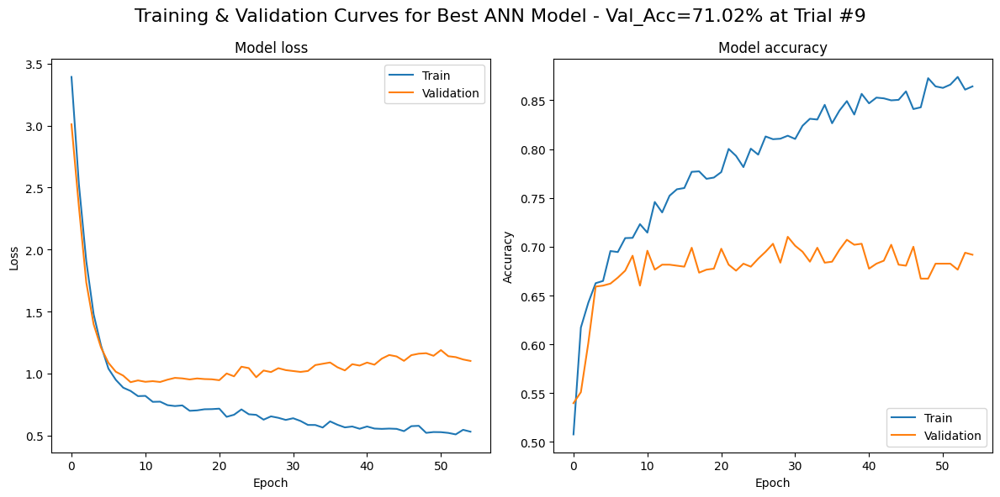

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


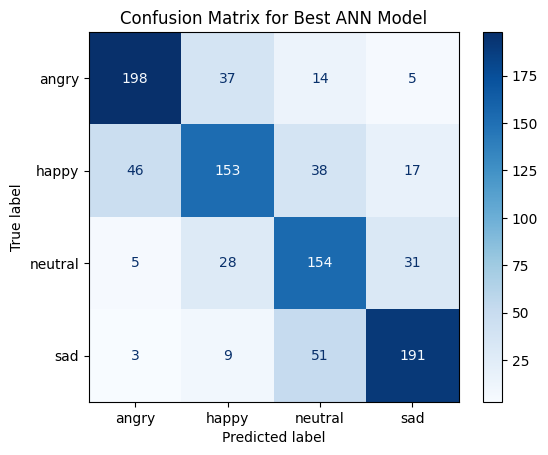


Accuracy = 71.020%

              precision    recall  f1-score   support

       angry       0.79      0.78      0.78       254
       happy       0.67      0.60      0.64       254
     neutral       0.60      0.71      0.65       218
         sad       0.78      0.75      0.77       254

    accuracy                           0.71       980
   macro avg       0.71      0.71      0.71       980
weighted avg       0.71      0.71      0.71       980



In [63]:
max_acc, best_params, best_trial, best_model, phist, histories = tune_hyperparams(ntrials=20,feats=df,max_epochs=500)

Trial 20 Complete [0h 0m 31s] - Trained for 84 epochs
train_accuracy = 87.012%
val_accuracy = 68.163%
Overfitting Difference = 18.849%

Best val_accuracy So Far: 70.510% at Trial #19
Total time elapsed: [0h 9m 20s]
Best Hyperparameters: {'rs_split': 690, 'num_HL': 4, 'units_1': 128, 'KR_1': 'l1', 'BN_1': True, 'dropout_rate_1': 0.1951, 'units_2': 422, 'KR_2': 'l1l2', 'BN_2': False, 'dropout_rate_2': 0.0079, 'units_3': 486, 'KR_3': 'l2', 'BN_3': True, 'dropout_rate_3': 0.3652, 'units_4': 126, 'KR_4': 'l2', 'BN_4': True, 'dropout_rate_4': 0.1949, 'learning_rate': 0.00354825744309204, 'optimizer': 'Nadam', 'batch_size': 68, 'adpLR': True, 'apply_smote': False}
Best Model Summary:


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 128)            │        24,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_67          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_128 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 422)            │        54,438 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_129 (Dropout)           │ (None, 422)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 486)            │       205,578 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_68          │ (None, 486)            │         1,944 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_130 (Dropout)           │ (None, 486)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 126)            │        61,362 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_69          │ (None, 126)            │           504 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_131 (Dropout)           │ (None, 126)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 4)              │           508 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,046,077 (3.99 MB)

 Trainable params: 348,198 (1.33 MB)

 Non-trainable params: 1,480 (5.78 KB)

 Optimizer params: 696,399 (2.66 MB)

None


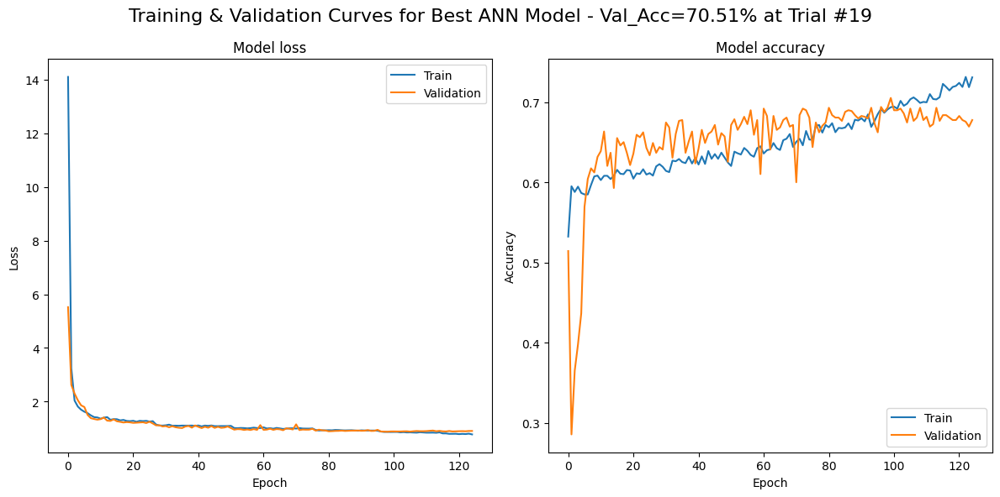

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


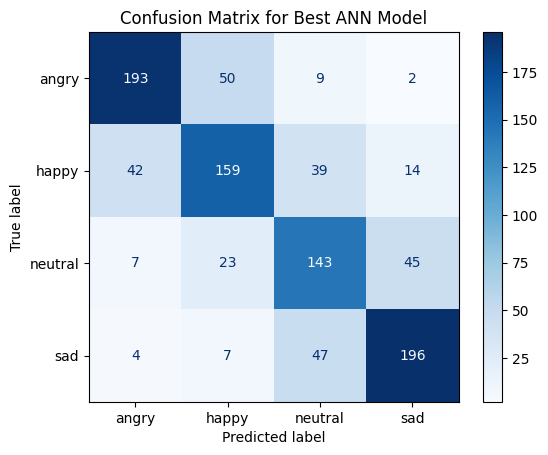


Accuracy = 70.510%

              precision    recall  f1-score   support

       angry       0.78      0.76      0.77       254
       happy       0.67      0.63      0.65       254
     neutral       0.60      0.66      0.63       218
         sad       0.76      0.77      0.77       254

    accuracy                           0.71       980
   macro avg       0.70      0.70      0.70       980
weighted avg       0.71      0.71      0.71       980



In [64]:
max_acc, best_params, best_trial, best_model, phist, histories = tune_hyperparams(ntrials=20,feats=df,max_epochs=500)

Trial 20 Complete [0h 0m 21s] - Trained for 51 epochs
train_accuracy = 57.399%
val_accuracy = 58.469%
Overfitting Difference = -1.070%

Best val_accuracy So Far: 72.959% at Trial #9
Total time elapsed: [0h 8m 25s]
Best Hyperparameters: {'rs_split': 205, 'num_HL': 3, 'units_1': 98, 'KR_1': 'l1', 'BN_1': True, 'dropout_rate_1': 0.3248, 'units_2': 346, 'KR_2': 'l2', 'BN_2': False, 'dropout_rate_2': 0.2088, 'units_3': 68, 'KR_3': 'l1l2', 'BN_3': False, 'dropout_rate_3': 0.3141, 'learning_rate': 0.002367904536314642, 'optimizer': 'Adamax', 'batch_size': 32, 'adpLR': True, 'apply_smote': True}
Best Model Summary:


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_205 (Dense)               │ (None, 98)             │        19,012 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_81          │ (None, 98)             │           392 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_156 (Dropout)           │ (None, 98)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 346)            │        34,254 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_157 (Dropout)           │ (None, 346)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 68)             │        23,596 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_158 (Dropout)           │ (None, 68)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 4)              │           276 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 232,200 (907.04 KB)

 Trainable params: 77,334 (302.09 KB)

 Non-trainable params: 196 (784.00 B)

 Optimizer params: 154,670 (604.18 KB)

None


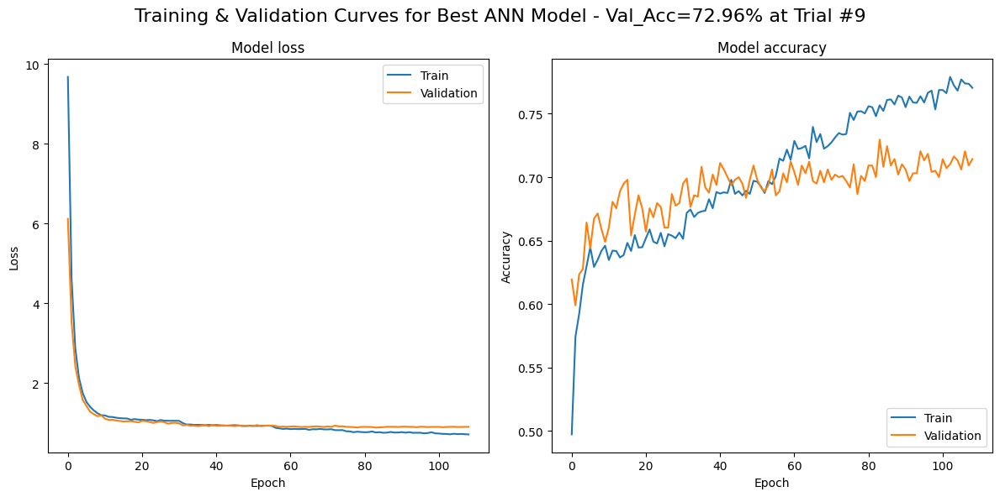

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


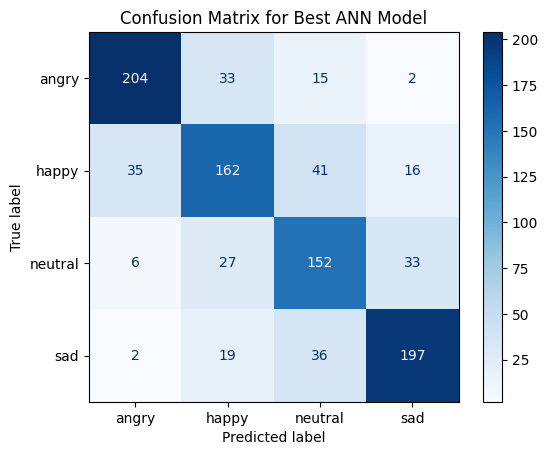


Accuracy = 72.959%

              precision    recall  f1-score   support

       angry       0.83      0.80      0.81       254
       happy       0.67      0.64      0.65       254
     neutral       0.62      0.70      0.66       218
         sad       0.79      0.78      0.78       254

    accuracy                           0.73       980
   macro avg       0.73      0.73      0.73       980
weighted avg       0.73      0.73      0.73       980



In [65]:
def getRandomHPPMS():
    params = {}
    #params['rs_split'] = np.random.randint(0,1000)
    params['rs_split'] = 205
    params['num_HL'] = np.random.randint(2,4+1)
    for i in range(1,params['num_HL']+1):
        params[f'units_{i}'] = np.random.choice(range(64,512+2,2))
        params[f'KR_{i}'] = np.random.choice(['l1','l2','l1l2','none'])
        params[f'BN_{i}'] = np.random.choice([True,False])
        #params[f'dropout_rate_{i}'] = np.random.choice(np.round(np.arange(0,0.5+0.1,0.1),1))
        params[f'dropout_rate_{i}'] = np.round(np.random.uniform(0,0.5),4)
    params['learning_rate'] = np.random.uniform(0.0001,0.005)
    optims = ['Adam','SGD','RMSprop','Adadelta','Adagrad','Adamax','Nadam']
    params['optimizer'] = np.random.choice(optims)
    params['batch_size'] = np.random.choice(range(32,132,4))
    params['adpLR'] = np.random.choice([True,False])
    params['apply_smote'] = np.random.choice([True,False])
    return params

max_acc, best_params, best_trial, best_model, phist, histories = tune_hyperparams(ntrials=20,feats=df,max_epochs=500)

Trial 20 Complete [0h 0m 59s] - Trained for 285 epochs
train_accuracy = 59.939%
val_accuracy = 66.531%
Overfitting Difference = -6.592%

Best val_accuracy So Far: 70.714% at Trial #2
Total time elapsed: [0h 11m 17s]
Best Hyperparameters: {'rs_split': 205, 'num_HL': 2, 'units_1': 414, 'KR_1': 'l2', 'BN_1': True, 'dropout_rate_1': 0.4518, 'units_2': 354, 'KR_2': 'l2', 'BN_2': False, 'dropout_rate_2': 0.044, 'learning_rate': 0.00032711610994025754, 'optimizer': 'RMSprop', 'batch_size': 64, 'adpLR': True, 'apply_smote': False}
Best Model Summary:


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_333 (Dense)               │ (None, 414)            │        80,316 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_130         │ (None, 414)            │         1,656 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_251 (Dropout)           │ (None, 414)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 354)            │       146,910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_252 (Dropout)           │ (None, 354)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 4)              │         1,420 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 459,778 (1.75 MB)

 Trainable params: 229,474 (896.38 KB)

 Non-trainable params: 828 (3.23 KB)

 Optimizer params: 229,476 (896.39 KB)

None


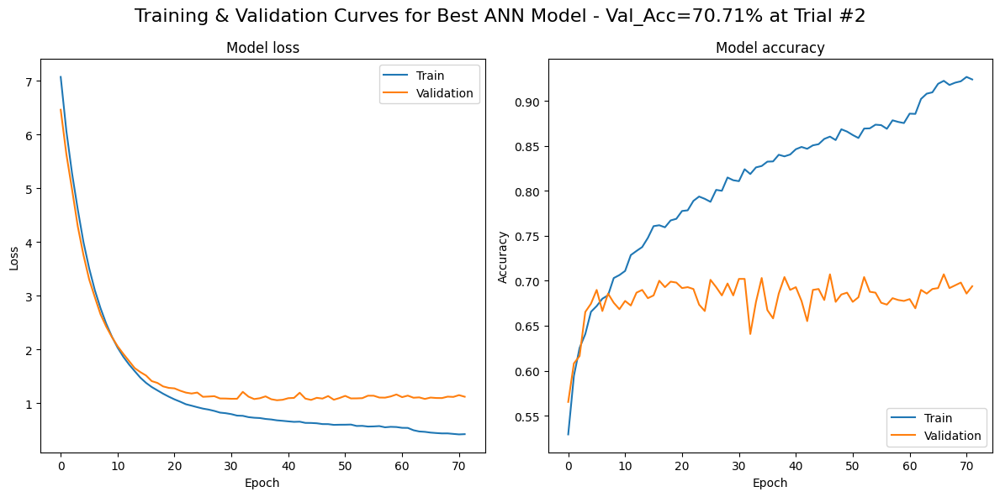

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


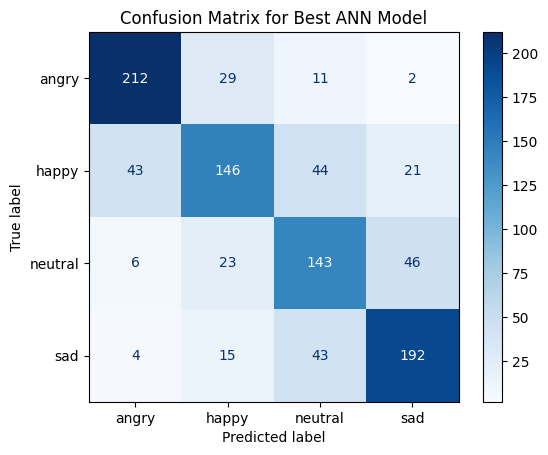


Accuracy = 70.714%

              precision    recall  f1-score   support

       angry       0.80      0.83      0.82       254
       happy       0.69      0.57      0.63       254
     neutral       0.59      0.66      0.62       218
         sad       0.74      0.76      0.75       254

    accuracy                           0.71       980
   macro avg       0.70      0.71      0.70       980
weighted avg       0.71      0.71      0.71       980



In [67]:
max_acc, best_params, best_trial, best_model, phist, histories = tune_hyperparams(ntrials=20,feats=df,max_epochs=500)